# **Final Exam: Image Processing**
## **Tree Species Classification**



**1.**   **objectif**



L’objectif de ce projet est de mettre en œuvre et de comparer différentes méthodes de classification afin de reconnaître automatiquement les espèces d’arbres à partir de données issues de nuages de points 3D, en exploitant
des approches multi-vues et d’apprentissage supervisé.

**2.Acquisition et Préparation des Données**




*   **Téléchargement de jeu de données**

In [ ]:
!pip -q install open3d==0.19.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.7 MB/s eta 0:00:00


In [ ]:
import os
os.environ["OPEN3D_RENDERING_SOFTWARE_ONLY"] = "1"

In [ ]:
# === One-shot Colab cell: load + visualize a point cloud sample ===
from pathlib import Path
import re, math, random
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image
import open3d as o3d

# --------- CONFIG ---------
from google.colab import drive
drive.mount('/content/drive')
DATA_ROOT = Path("/content/drive/MyDrive/trees_dataset/Dataset_")
READABLE_EXTS = {".ply", ".pcd", ".xyz", ".xyzn", ".xyzrgb", ".pts", ".txt", ".csv"}

# --------- Robust .pts reader ---------


Mounted at /content/drive


In [ ]:

READABLE_EXTS = {".ply", ".pcd", ".xyz", ".xyzn", ".xyzrgb", ".pts", ".txt", ".csv"}

# --------- Robust .pts reader ---------
def _fast_is_number(tok: str):
    return bool(re.match(r"^[+-]?(\d+(\.\d*)?|\.\d+)([eE][+-]?\d+)?$", tok))

def read_pts_custom(path: Path, max_lines=None):
    xs, ys, zs = [], [], []
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        lines = f if max_lines is None else (l for _, l in zip(range(max_lines), f))
        first_non_comment = None
        for line in lines:
            line = line.strip()
            if not line or line.startswith("#") or line.startswith("//"):
                continue
            if first_non_comment is None:
                toks = re.split(r"[,\s]+", line)
                if len(toks) == 1 and toks[0].isdigit():
                    first_non_comment = "header_count_skipped"
                    continue
                else:
                    first_non_comment = "data"
            toks = re.split(r"[,\s]+", line)
            nums = [t for t in toks if _fast_is_number(t)]
            if len(nums) < 3:
                continue
            x, y, z = float(nums[0]), float(nums[1]), float(nums[2])
            xs.append(x); ys.append(y); zs.append(z)
    if not xs:
        raise ValueError(f".pts sans points exploitables: {path}")
    pts = np.column_stack([xs, ys, zs]).astype(np.float64)
    mask = np.isfinite(pts).all(axis=1)
    pts = pts[mask]
    if len(pts) == 0:
        raise ValueError(f".pts vide après filtrage: {path}")
    return pts


*   **Visualisation de données**


>  Visualisations 2D des nuages de points:

1️⃣ Heatmap 2D (densité de points projetée sur un plan):



Nombre de points chargés : (94779, 3)


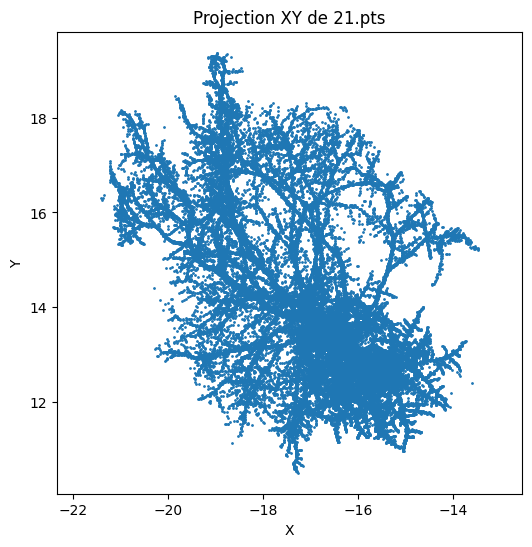

[Open3D WARNING] GLFW Error: Failed to detect any supported platform
[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [ ]:
 # --------- Robust .pts reader ---------
def read_pts(filename):
    """
    Lit un fichier .pts (souvent avec des entêtes ou balises non numériques)
    et en extrait uniquement les coordonnées numériques (x, y, [z]).
    """
    return np.loadtxt(str(filename), comments=("version:", "n_points:", "{", "}"))

# ---------- Sample loading & visualization ----------
# Cherche un fichier .pts dans DATA_ROOT (ajuste le chemin selon ta structure)
sample = next(DATA_ROOT.rglob("*.pts"), None)
if sample is None:
    raise FileNotFoundError("Aucun fichier .pts trouvé sous DATA_ROOT")

# Lecture
points = read_pts(sample)
print(f"Nombre de points chargés : {points.shape}")

# 2D Visualization (projection XY)
plt.figure(figsize=(6, 6))
plt.scatter(points[:, 0], points[:, 1], s=1)
plt.title(f"Projection XY de {sample.name}")
plt.xlabel("X")
plt.ylabel("Y")
plt.axis("equal")
plt.show()

# 3D Visualization avec Open3D
# On suppose que le nuage est 3D (points[:, :3]), sinon on adapte
pcd = o3d.geometry.PointCloud()
if points.shape[1] >= 3:
    pcd.points = o3d.utility.Vector3dVector(points[:, :3])
else:
    raise ValueError("Le nuage de points n'a pas au moins 3 dimensions")

o3d.visualization.draw_geometries([pcd])

2️⃣ Histogrammes / KDE (distribution des coordonnées):

Nombre de fichiers trouvés : 114
Exemple : [PosixPath('/content/drive/MyDrive/trees_dataset/Dataset_/beech/21.pts'), PosixPath('/content/drive/MyDrive/trees_dataset/Dataset_/beech/197.pts'), PosixPath('/content/drive/MyDrive/trees_dataset/Dataset_/beech/147.pts'), PosixPath('/content/drive/MyDrive/trees_dataset/Dataset_/beech/110.pts'), PosixPath('/content/drive/MyDrive/trees_dataset/Dataset_/beech/284.pts')]
Fichier choisi : /content/drive/MyDrive/trees_dataset/Dataset_/beech/21.pts


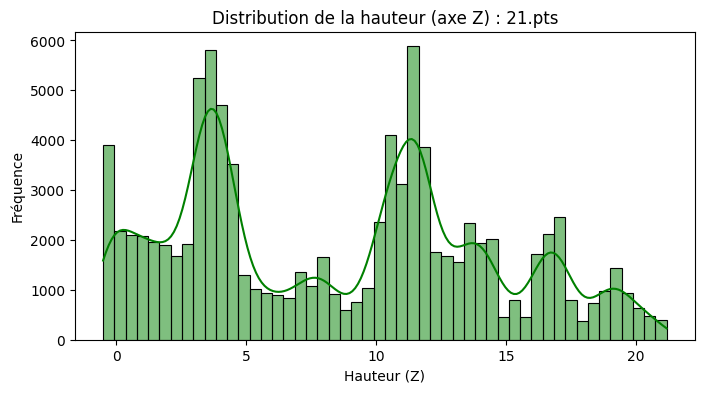

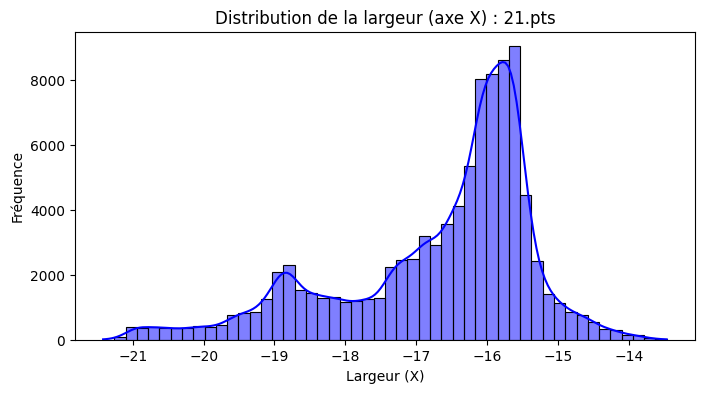

In [ ]:
from pathlib import Path

DATA_ROOT = Path("/content/drive/MyDrive/trees_dataset/Dataset_")

# Cherche tous les fichiers .pts
files = list(DATA_ROOT.rglob("*.pts"))
print("Nombre de fichiers trouvés :", len(files))
print("Exemple :", files[:5])
sample = files[0]   # prend le premier fichier trouvé
print("Fichier choisi :", sample)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

points = np.loadtxt(sample)   # lecture du fichier choisi
z = points[:,2]               # axe Z = hauteur

plt.figure(figsize=(8,4))
sns.histplot(z, kde=True, bins=50, color="green")
plt.title(f"Distribution de la hauteur (axe Z) : {sample.name}")
plt.xlabel("Hauteur (Z)")
plt.ylabel("Fréquence")
plt.show()
x = points[:,0]

plt.figure(figsize=(8,4))
sns.histplot(x, kde=True, bins=50, color="blue")
plt.title(f"Distribution de la largeur (axe X) : {sample.name}")
plt.xlabel("Largeur (X)")
plt.ylabel("Fréquence")
plt.show()

3️⃣ Cross-section (coupe à une hauteur donnée):

Fichier utilisé : /content/drive/MyDrive/trees_dataset/Dataset_/beech/21.pts
Hauteur cible z0=8.90 | épaisseur totale=0.50 | points retenus=685


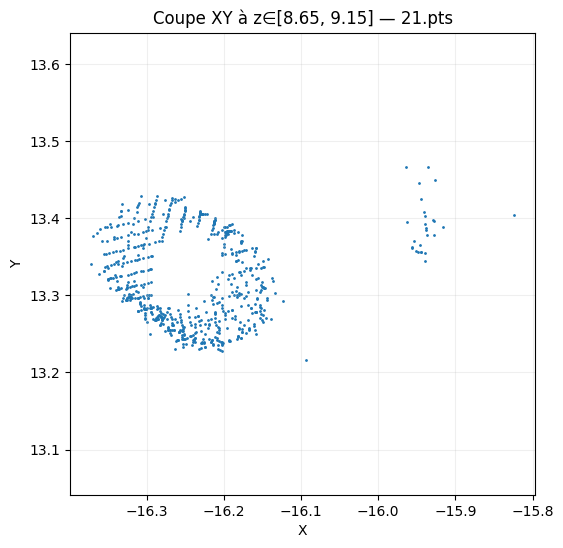

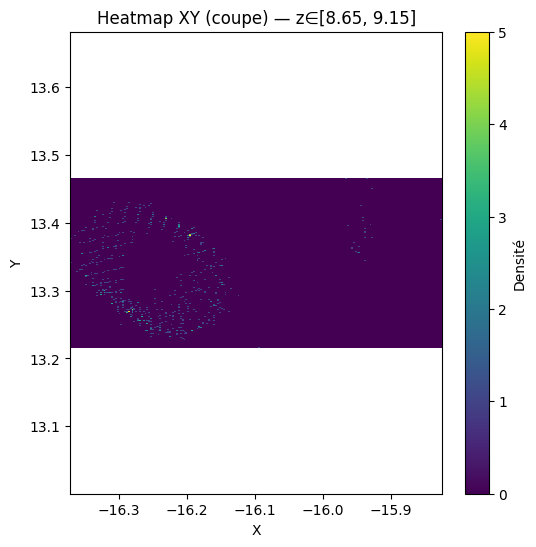

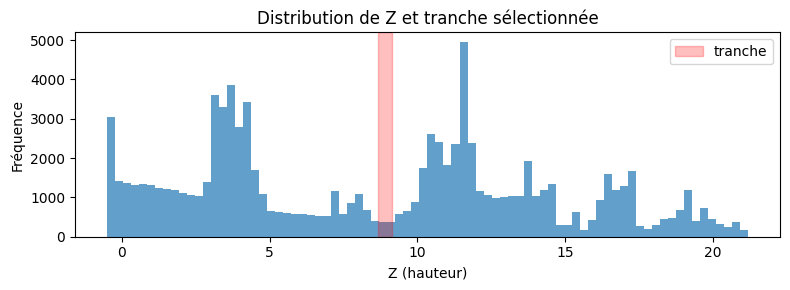

In [ ]:
# --- Cross-section 2D (plan XY) à une hauteur donnée ---
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# 1) Localiser un fichier .pts (adapte DATA_ROOT si besoin)
DATA_ROOT = Path("/content/drive/MyDrive/trees_dataset/Dataset_")
files = list(DATA_ROOT.rglob("*.pts"))
assert len(files) > 0, "Aucun .pts trouvé : vérifie DATA_ROOT et l'extension."
sample = files[0]   # ou choisis un autre index
print("Fichier utilisé :", sample)

# 2) Charger points (X,Y,Z)
points = np.loadtxt(sample)
assert points.shape[1] >= 3, "Le fichier doit contenir au moins 3 colonnes (X,Y,Z)."
x, y, z = points[:,0], points[:,1], points[:,2]

# 3) Paramètres de coupe
#    - z0 : hauteur centrale de la tranche
#    - dz : demi-épaisseur de la tranche (épaisseur totale = 2*dz)
#    ➜ Modifie ces deux valeurs selon ton besoin
z_min, z_max = float(np.min(z)), float(np.max(z))
z0 = np.median(z)        # ex : prendre la médiane comme coupe par défaut
dz = 0.25                # ex : tranche de 0.5 m d'épaisseur (±0.25)

# 4) Masque de sélection de la tranche
mask = (z >= (z0 - dz)) & (z <= (z0 + dz))
slice_pts = points[mask]
print(f"Hauteur cible z0={z0:.2f} | épaisseur totale={2*dz:.2f} | points retenus={slice_pts.shape[0]}")

# 5) Visualisation 2D de la coupe (projection XY)
plt.figure(figsize=(6,6))
plt.scatter(slice_pts[:,0], slice_pts[:,1], s=1)
plt.title(f"Coupe XY à z∈[{z0-dz:.2f}, {z0+dz:.2f}] — {sample.name}")
plt.xlabel("X")
plt.ylabel("Y")
plt.axis("equal")
plt.grid(alpha=0.2)
plt.show()

# (Option) Heatmap de densité sur la même tranche (plus lisible si beaucoup de points)
plt.figure(figsize=(6,6))
plt.hist2d(slice_pts[:,0], slice_pts[:,1], bins=200)
plt.colorbar(label="Densité")
plt.title(f"Heatmap XY (coupe) — z∈[{z0-dz:.2f}, {z0+dz:.2f}]")
plt.xlabel("X")
plt.ylabel("Y")
plt.axis("equal")
plt.show()

# (Option) Aide visuelle : histogramme de Z avec la tranche marquée
plt.figure(figsize=(8,3))
plt.hist(z, bins=80, alpha=0.7)
plt.axvspan(z0-dz, z0+dz, color='red', alpha=0.25, label="tranche")
plt.title("Distribution de Z et tranche sélectionnée")
plt.xlabel("Z (hauteur)")
plt.ylabel("Fréquence")
plt.legend()
plt.tight_layout()
plt.show()


4️⃣ Downsampling (réduction et affichage 2D):

Fichier utilisé : /content/drive/MyDrive/trees_dataset/Dataset_/beech/21.pts
Points initiaux: 94779
Points conservés: 10142  | Réduction x9.35  | Méthode: grid


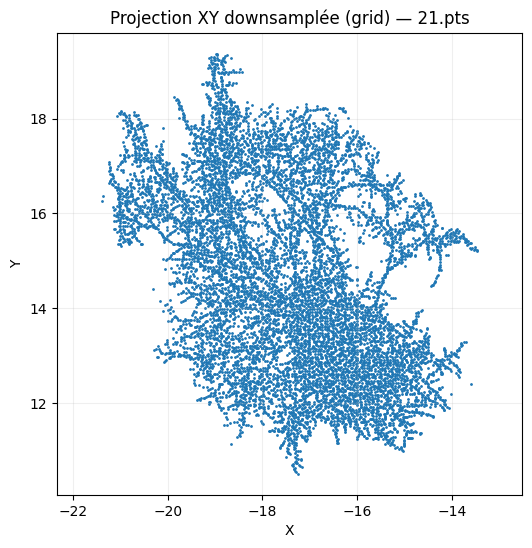

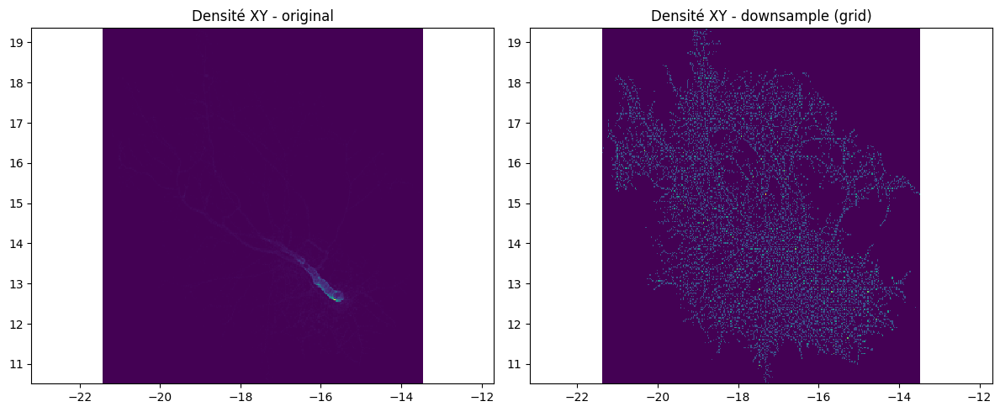

In [ ]:
# === Downsampling 2D (projection XY) : random / stride / grid (voxel) ===
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import open3d as o3d

# ---------- 1) Localiser un fichier ----------
DATA_ROOT = Path("/content/drive/MyDrive/trees_dataset/Dataset_")
EXTS = (".pts", ".xyz", ".xyzn", ".xyzrgb", ".txt", ".csv", ".ply", ".pcd")

files = []
for ext in EXTS:
    files += list(DATA_ROOT.rglob(f"*{ext}"))
assert files, "Aucun fichier trouvé : vérifie DATA_ROOT et les extensions."
sample = files[0]  # choisis un autre index si tu veux
print("Fichier utilisé :", sample)

# ---------- 2) Charger en (N,3) ----------
def load_points(path: Path) -> np.ndarray:
    suf = path.suffix.lower()
    if suf in {".ply", ".pcd"}:
        pcd = o3d.io.read_point_cloud(str(path))
        pts = np.asarray(pcd.points)  # (N,3)
    else:
        # lit les colonnes numériques; ignore entêtes atypiques
        pts = np.loadtxt(str(path), comments=("version:", "n_points:", "{", "}"))
        # garde au moins X,Y,Z
        if pts.ndim == 1:  # cas 1 ligne
            pts = pts[None, :]
        if pts.shape[1] < 3:
            raise ValueError("Le fichier doit contenir au moins 3 colonnes (X,Y,Z).")
    return pts[:, :3]

points = load_points(sample)
x, y, z = points[:,0], points[:,1], points[:,2]
N0 = len(points)
print(f"Points initiaux: {N0}")

# ---------- 3) Choisir la stratégie ----------
method = "grid"   # <- 'random' | 'stride' | 'grid'

# Paramètres communs / par méthode
frac = 0.1        # pour 'random' : fraction à garder (ex. 10%)
step = 10         # pour 'stride'  : garde 1 point / step
cell = 0.05       # pour 'grid'    : taille de cellule en unités XY (ex. 5 cm)

if method == "random":
    k = max(1, int(frac * N0))
    idx = np.random.choice(N0, size=k, replace=False)
    samp = points[idx]

elif method == "stride":
    samp = points[::step]

elif method == "grid":
    # Voxelisation 2D sur XY : 1 point par cellule (ici, premier point)
    # 1) Indices de cellule
    xmin, ymin = x.min(), y.min()
    ix = np.floor((x - xmin) / cell).astype(np.int64)
    iy = np.floor((y - ymin) / cell).astype(np.int64)
    # 2) Clés uniques par cellule
    keys = ix.astype(np.int64) << 32 | (iy.astype(np.int64) & 0xffffffff)
    # 3) Conserver le 1er index par cellule
    _, first_idx = np.unique(keys, return_index=True)
    samp = points[first_idx]

else:
    raise ValueError("method doit être 'random', 'stride' ou 'grid'.")

# ---------- 4) Affichage 2D (XY) ----------
N1 = len(samp)
print(f"Points conservés: {N1}  | Réduction x{N0/max(1,N1):.2f}  | Méthode: {method}")

plt.figure(figsize=(6,6))
plt.scatter(samp[:,0], samp[:,1], s=1)
plt.title(f"Projection XY downsamplée ({method}) — {sample.name}")
plt.xlabel("X"); plt.ylabel("Y")
plt.axis("equal"); plt.grid(alpha=0.2)
plt.show()

# (Option) Comparer avant/après en densité (utile si N0 est énorme)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.hist2d(x, y, bins=300)
plt.title("Densité XY - original")
plt.axis("equal")

plt.subplot(1,2,2)
plt.hist2d(samp[:,0], samp[:,1], bins=300)
plt.title(f"Densité XY - downsample ({method})")
plt.axis("equal")
plt.tight_layout()
plt.show()



> **Visualisations 3D**

1️⃣ Scatter 3D interactif

In [ ]:
# === Colab-safe 3D viz: Open3D (processing) + Plotly (display) ===
# 1) Fix versions
!pip -q install open3d==0.19.0 plotly

import numpy as np
import open3d as o3d
import plotly.graph_objects as go
from pathlib import Path
from google.colab import drive

# 2) Mount & locate a real file
drive.mount('/content/drive', force_remount=False)
DATA_ROOT = Path("/content/drive/MyDrive/trees_dataset/Dataset_")
EXTS = (".ply", ".pcd", ".pts", ".xyz", ".xyzn", ".xyzrgb", ".txt", ".csv")

files = []
for ext in EXTS:
    files += list(DATA_ROOT.rglob(f"*{ext}"))
assert files, "Aucun fichier trouvé: vérifie DATA_ROOT et extensions."
sample = files[0]
print("Fichier utilisé:", sample)

# 3) Charge robuste: .ply/.pcd via Open3D, sinon loadtxt (ignore entêtes .pts)
def load_points_to_pcd(path: Path) -> o3d.geometry.PointCloud:
    suf = path.suffix.lower()
    if suf in {".ply", ".pcd"}:
        return o3d.io.read_point_cloud(str(path))
    arr = np.loadtxt(str(path), comments=("version:", "n_points:", "{", "}"))
    if arr.ndim == 1:
        arr = arr[None, :]
    assert arr.shape[1] >= 3, "Besoin d'au moins 3 colonnes (X,Y,Z)."
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(arr[:, :3])
    if arr.shape[1] >= 6:
        rgb = arr[:, 3:6]
        if rgb.max() > 1: rgb = rgb/255.0
        pcd.colors = o3d.utility.Vector3dVector(rgb[:, :3])
    return pcd

pcd = load_points_to_pcd(sample)
pts = np.asarray(pcd.points)
x, y, z = pts[:,0], pts[:,1], pts[:,2]
print(f"Points: {len(pts)} | X[{x.min():.2f},{x.max():.2f}] Y[{y.min():.2f},{y.max():.2f}] Z[{z.min():.2f},{z.max():.2f}]")

# 4) Plotly scatter3d (remplace z.ptp() par np.ptp(z))
def plotly_scatter3d(points, title="Scatter 3D", size=1, colors=None):
    if colors is None:
        z = points[:,2]
        zn = (z - z.min()) / (np.ptp(z) + 1e-12)  # <-- compat NumPy 2.0
        colors = zn
    fig = go.Figure(data=[go.Scatter3d(
        x=points[:,0], y=points[:,1], z=points[:,2],
        mode='markers',
        marker=dict(size=size, color=colors, colorscale='Viridis', opacity=0.9)
    )])
    fig.update_layout(title=title, scene_aspectmode='data', height=600)
    fig.show()

# A) Scatter 3D interactif (Plotly)
plotly_scatter3d(pts, title=f"Scatter 3D — {sample.name}", size=1)

# B) Voxelization 3D (downsample) + affichage
voxel_size = 0.10  # ajuste selon l’échelle
pcd_vox = pcd.voxel_down_sample(voxel_size=voxel_size)
pts_vox = np.asarray(pcd_vox.points)
print(f"Voxelisation: {len(pts)} -> {len(pts_vox)} points (voxel_size={voxel_size})")
plotly_scatter3d(pts_vox, title=f"Voxelized ({voxel_size} m) — {sample.name}", size=2)

# C) Coupe 3D (slice) — par Z
z0 = float(np.median(z))
dz  = 0.25
mask = (z >= (z0 - dz)) & (z <= (z0 + dz))
slice_pts = pts[mask]
print(f"Slice z∈[{z0-dz:.2f},{z0+dz:.2f}] -> {len(slice_pts)} points")
if len(slice_pts) > 0:
    plotly_scatter3d(slice_pts, title=f"Slice Z∈[{z0-dz:.2f},{z0+dz:.2f}] — {sample.name}", size=2)

# D) (Optionnel) Surface/mesh Poisson avec Plotly Mesh3D
# Si tu veux le mesh, décommente le bloc ci-dessous (peut être coûteux)
"""
pcd_n = o3d.geometry.PointCloud(pcd)
pcd_n.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.5, max_nn=30))
pcd_n.orient_normals_consistent_tangent_plane(30)

mesh, dens = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd_n, depth=8)
bbox = pcd.get_axis_aligned_bounding_box()
mesh = mesh.crop(bbox)
mesh.compute_vertex_normals()

V = np.asarray(mesh.vertices)
F = np.asarray(mesh.triangles)
fig = go.Figure(data=[go.Mesh3d(
    x=V[:,0], y=V[:,1], z=V[:,2],
    i=F[:,0], j=F[:,1], k=F[:,2],
    opacity=1.0, color='lightgray'
)])
fig.update_layout(title=f"Poisson Mesh — {sample.name}", scene_aspectmode='data', height=600)
fig.show()
"""


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Fichier utilisé: /content/drive/MyDrive/trees_dataset/Dataset_/beech/21.pts
Points: 94779 | X[-21.42,-13.47] Y[10.51,19.37] Z[-0.50,21.18]


Voxelisation: 94779 -> 13288 points (voxel_size=0.1)


Slice z∈[8.65,9.15] -> 685 points


'\npcd_n = o3d.geometry.PointCloud(pcd)\npcd_n.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.5, max_nn=30))\npcd_n.orient_normals_consistent_tangent_plane(30)\n\nmesh, dens = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd_n, depth=8)\nbbox = pcd.get_axis_aligned_bounding_box()\nmesh = mesh.crop(bbox)\nmesh.compute_vertex_normals()\n\nV = np.asarray(mesh.vertices)\nF = np.asarray(mesh.triangles)\nfig = go.Figure(data=[go.Mesh3d(\n    x=V[:,0], y=V[:,1], z=V[:,2],\n    i=F[:,0], j=F[:,1], k=F[:,2],\n    opacity=1.0, color=\'lightgray\'\n)])\nfig.update_layout(title=f"Poisson Mesh — {sample.name}", scene_aspectmode=\'data\', height=600)\nfig.show()\n'

2️⃣ Animation 3D (rotation automatique) — Plotly (sans OpenGL):

In [ ]:
# --- Animation 3D autour du point cloud (Plotly frames) ---
import numpy as np
import plotly.graph_objects as go

# Utilisons le point cloud downsamplé pcd (déjà chargé ci-dessus)
P = np.asarray(pcd.points)

# Scatter3D « base »
fig = go.Figure(data=[go.Scatter3d(
    x=P[:,0], y=P[:,1], z=P[:,2],
    mode='markers',
    marker=dict(size=1, color=(P[:,2]-P[:,2].min())/(np.ptp(P[:,2])+1e-12), colorscale='Viridis', opacity=0.9)
)])

fig.update_layout(scene_aspectmode='data', height=600)

# Générer des frames en faisant varier la caméra autour de l'axe Z
frames = []
R = 1.8  # distance caméra
for t in range(60):
    theta = 2*np.pi * t/60.0
    eye = dict(x=R*np.cos(theta), y=R*np.sin(theta), z=0.6*R)
    frames.append(go.Frame(layout=dict(scene_camera=dict(eye=eye))))

fig.update(frames=frames)
fig.update_layout(
    updatemenus=[dict(type="buttons",
                      showactive=False,
                      buttons=[dict(label="▶ Play", method="animate",
                                    args=[None, {"frame": {"duration": 50, "redraw": True},
                                                 "fromcurrent": True, "transition": {"duration": 0}}]),
                               dict(label="⏸ Pause", method="animate",
                                    args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                   "mode":"immediate"}])])])

# Vue initiale
fig.update_layout(scene_camera=dict(eye=dict(x=R, y=0.0, z=0.6*R)))
fig.show()


Fichier choisi: /content/drive/MyDrive/trees_dataset/Dataset_/douglas_fir/61_63.txt


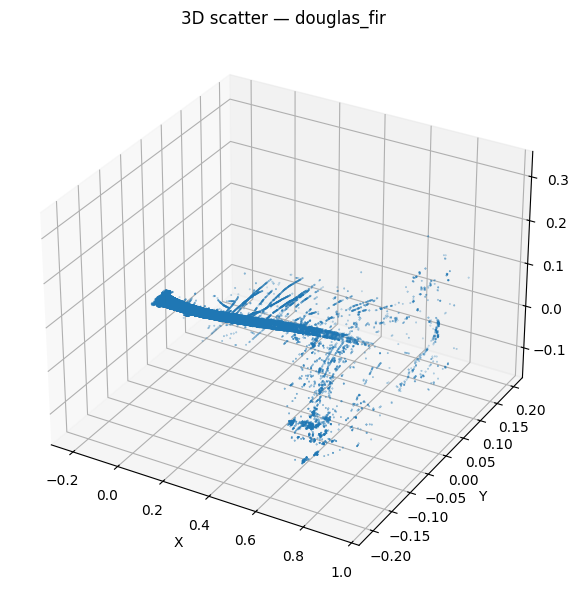

In [ ]:
# === Colab safe: visualize .pts (and txt/csv/xyz/ply/pcd) WITHOUT Open3D ===
from pathlib import Path
import re, random
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (required for 3D)

# ----- CONFIG -----
DATA_ROOT = Path("/content/drive/MyDrive/trees_dataset/Dataset_")  # <-- adapte
READABLE_EXTS = {".pts", ".txt", ".csv", ".xyz", ".ply", ".pcd"}  # we'll only parse text ourselves; others via fallback
MAX_POINTS_3D = 120_000   # limite pour ne pas saturer la RAM/affichage
DOWNSAMPLE_2D = 200_000   # limite pour les scatter 2D

# ----- utils -----
def _fast_is_number(tok: str):
    return bool(re.match(r"^[+-]?(\d+(\.\d*)?|\.\d+)([eE][+-]?\d+)?$", tok))

def read_pts_like_text(path: Path):
    """
    Lit .pts/.txt/.csv/.xyz contenant X Y Z (≥3 colonnes).
    Ignore lignes vides/#// et en-tête 'N'.
    Détecte espace/tab/virgule automatiquement.
    """
    xs, ys, zs = [], [], []
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        first_non_comment = None
        for line in f:
            line = line.strip()
            if not line or line.startswith("#") or line.startswith("//"):
                continue
            if first_non_comment is None:
                toks = re.split(r"[,\s]+", line)
                if len(toks) == 1 and toks[0].isdigit():
                    first_non_comment = "header_count_skipped"
                    continue
                first_non_comment = "data"
            toks = re.split(r"[,\s]+", line)
            nums = [t for t in toks if _fast_is_number(t)]
            if len(nums) < 3:
                continue
            x, y, z = float(nums[0]), float(nums[1]), float(nums[2])
            xs.append(x); ys.append(y); zs.append(z)
    pts = np.column_stack([xs, ys, zs]).astype(np.float64)
    mask = np.isfinite(pts).all(axis=1)
    pts = pts[mask]
    if pts.size == 0:
        raise ValueError(f"Fichier vide/inexploitable: {path}")
    return pts

def reorient_with_pca(points):
    pts = points - points.mean(axis=0, keepdims=True)
    # SVD = PCA
    _,_,Vt = np.linalg.svd(pts, full_matrices=False)
    R = Vt.T
    pts_r = pts @ R
    if pts_r[:,2].mean() < 0:
        pts_r[:,2] *= -1
    return pts_r

def normalize_unit_sphere(points):
    c = points.mean(axis=0, keepdims=True)
    pts = points - c
    r = np.linalg.norm(pts, axis=1).max()
    return pts / (r + 1e-9)

def pick_any_sample(root: Path, exts):
    files = [f for f in root.rglob("*") if f.is_file() and f.suffix.lower() in exts]
    if not files:
        raise FileNotFoundError(f"Aucun fichier trouvé sous {root}")
    files.sort()
    return random.choice(files)

# ----- chargement d'un fichier -----
sample = pick_any_sample(DATA_ROOT, READABLE_EXTS)
cls = sample.parent.name
print("Fichier choisi:", sample)

# stratégie: on lit comme texte si .pts/.txt/.csv/.xyz; sinon on essaie numpy (XYZ simple)
ext = sample.suffix.lower()
if ext in {".pts", ".txt", ".csv", ".xyz"}:
    pts = read_pts_like_text(sample)
else:
    # fallback très simple: tenter numpy (fonctionnera si fichier est texte XYZ)
    try:
        arr = np.loadtxt(sample, dtype=float, delimiter=None)
    except Exception:
        arr = np.loadtxt(sample, dtype=float, delimiter=",")
    if arr.ndim != 2 or arr.shape[1] < 3:
        raise ValueError("Format non pris en charge sans Open3D. Convertis en .pts/.txt/.csv/.xyz (XYZ).")
    pts = arr[:, :3]

# pipeline "pro"
pts = reorient_with_pca(pts)
pts = normalize_unit_sphere(pts)

# downsample pour affichage
n = len(pts)
if n > DOWNSAMPLE_2D:
    idx = np.random.choice(n, DOWNSAMPLE_2D, replace=False)
    pts2d = pts[idx]
else:
    pts2d = pts



# ----- 3D Matplotlib (simple et sûr) -----
pts3d = pts if len(pts) <= MAX_POINTS_3D else pts[np.random.choice(len(pts), MAX_POINTS_3D, replace=False)]
fig3d = plt.figure(figsize=(6,6))
ax = fig3d.add_subplot(111, projection='3d')
ax.scatter(pts3d[:,0], pts3d[:,1], pts3d[:,2], s=0.1)
ax.set_title(f"3D scatter — {cls}")
ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
plt.tight_layout(); plt.show()



*   **Fractionnement des données: **Prétraitement du dataset (avant génération des multi-vues**)**

0) Imports & config

In [ ]:
import os, math, json, shutil
from pathlib import Path
import numpy as np

# Open3D 0.19 (ou récent)
import open3d as o3d

# ── CONFIG GLOBALE ─────────────────────────────────────────────
DATA_RAW = Path("/path/to/data_raw")        # racine des nuages bruts (7 dossiers d'espèces)
OUT_ROOT = Path("/path/to/output")          # racine des sorties
MV_SIZE  = (224, 224)                       # 224 x 224 pixels
K        = 8                                # nb de vues
VOXEL_M  = 0.05                             # downsample (mètres) ; None pour désactiver
REMOVE_OUTLIERS = True                      # nettoyage outliers
COLOR_BY_Z = True                           # coloriser par hauteur Z (pour injecter info)
RING_ELEV_DEG = 20                          # inclinaison du "ring-8" (pitch ≈ 20°)
CAM_RADIUS = 2.2                            # rayon caméra en coordonnées normalisées
BG_COLOR = (1.0, 1.0, 1.0, 1.0)             # fond blanc RGBA
SPECIES = ["Beech","Red_Oak","Ash","Oak","Douglas_Fir","Spruce","Pine"]


1) Lecture robuste des nuages de points

In [ ]:
def read_point_cloud_generic(path: Path) -> o3d.geometry.PointCloud:
    """
    Lecture .ply/.pcd avec Open3D ; .pts/.xyz/.txt/.csv via numpy.
    Attendu : X Y Z [R G B] [...] (si RGB, 0..255 ou 0..1)
    """
    ext = path.suffix.lower()
    pcd = None

    if ext in [".ply", ".pcd"]:
        pcd = o3d.io.read_point_cloud(str(path))
        if pcd.is_empty():
            raise ValueError(f"Empty point cloud: {path}")
        return pcd

    # fallback texte : .pts / .xyz / .txt / .csv
    arr = np.loadtxt(str(path), dtype=float, comments=["#", "//", "n"])
    if arr.ndim == 1:
        arr = arr.reshape(-1, 3)
    if arr.shape[1] < 3:
        raise ValueError(f"File has <3 columns: {path}")

    pts = arr[:, :3]
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(pts)

    # couleurs si dispo
    if arr.shape[1] >= 6:
        rgb = arr[:, 3:6]
        if rgb.max() > 1.0:
            rgb = rgb / 255.0
        pcd.colors = o3d.utility.Vector3dVector(rgb)

    return pcd


2) Nettoyage (outliers) + downsample (voxel)

In [ ]:
def clean_and_downsample(pcd: o3d.geometry.PointCloud,
                         remove_outliers=True,
                         voxel_size: float | None = 0.05) -> o3d.geometry.PointCloud:
    q = pcd
    if remove_outliers:
        # outliers statistiques
        q, _ = q.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
    if voxel_size and voxel_size > 0:
        q = q.voxel_down_sample(voxel_size)
    return q


3) Alignement de l’axe Z (PCA globale)

On aligne l’axe principal du tronc sur +Z.

In [ ]:
def align_to_Z_by_pca(pcd: o3d.geometry.PointCloud) -> o3d.geometry.PointCloud:
    pts = np.asarray(pcd.points)
    ctr = pts.mean(axis=0)
    X = pts - ctr
    C = np.cov(X.T)
    vals, vecs = np.linalg.eigh(C)          # vecs[:,i] eigenvector
    # axe principal = vecteur propre de plus grande valeur
    idx = np.argsort(vals)[::-1]
    v1 = vecs[:, idx[0]]                    # direction longueur max
    # on veut v1 aligné avec +Z
    z = np.array([0., 0., 1.])
    # calcul rotation qui amène v1 -> z
    v = np.cross(v1, z)
    s = np.linalg.norm(v)
    c = float(np.dot(v1, z))
    if s < 1e-8:  # déjà aligné (ou opposé)
        R = np.eye(3) if c > 0 else np.diag([1, -1, -1])
    else:
        vx = np.array([[0, -v[2], v[1]],
                       [v[2], 0, -v[0]],
                       [-v[1], v[0], 0]])
        R = np.eye(3) + vx + vx @ vx * ((1 - c) / (s**2))
    Y = (R @ X.T).T + ctr

    out = o3d.geometry.PointCloud()
    out.points = o3d.utility.Vector3dVector(Y)
    if pcd.has_colors():
        out.colors = pcd.colors
    return out


4) Mesures réelles (avant normalisation)

In [ ]:
def real_measures(pcd: o3d.geometry.PointCloud) -> dict:
    pts = np.asarray(pcd.points)
    xmin, ymin, zmin = pts.min(axis=0)
    xmax, ymax, zmax = pts.max(axis=0)
    Lx = xmax - xmin
    Ly = ymax - ymin
    H  = zmax - zmin
    V  = Lx * Ly * H
    ratios = {
        "H_over_maxLW": H / max(Lx, Ly) if max(Lx, Ly) > 0 else 0.0,
        "Lx_over_Ly": Lx / Ly if Ly > 0 else 0.0
    }
    return {"Lx": float(Lx), "Ly": float(Ly), "H": float(H), "AABB_volume": float(V), **ratios}


5) Normalisation AABB (centrage + échelle isotrope)

In [ ]:
def normalize_aabb(pcd: o3d.geometry.PointCloud, margin=0.0):
    pts = np.asarray(pcd.points).copy()
    mins = pts.min(axis=0); maxs = pts.max(axis=0)
    ctr  = (mins + maxs) / 2.0
    ext  = (maxs - mins)
    L    = float(ext.max())
    s    = L * (1.0 + margin) if L > 0 else 1.0
    ptsn = (pts - ctr) / s

    out = o3d.geometry.PointCloud()
    out.points = o3d.utility.Vector3dVector(ptsn)
    if pcd.has_colors():
        out.colors = pcd.colors
    return out, ctr, s


In [ ]:
from pathlib import Path
import open3d as o3d
import json

# ==============================
# CONFIGURATION
# ==============================
ROOT = Path("/content/drive/MyDrive/trees_dataset/")   # 📌 ton dossier racine
TRAIN_DIR = ROOT / "dataset_train"                     # 📌 adapte au vrai nom dans Drive
TEST_DIR  = ROOT / "dataset_test"                      # 📌 idem
OUT_DIR   = ROOT / "data_preprocessed"                 # sortie prétraitée
OUT_DIR.mkdir(parents=True, exist_ok=True)

print("📂 TRAIN_DIR:", TRAIN_DIR.exists())
print("📂 TEST_DIR :", TEST_DIR.exists())

# ==============================
# PIPELINE PRÉTRAITEMENT (fonctions déjà définies)
# ==============================
def process_split(split_dir: Path, out_split: Path):
    out_split.mkdir(parents=True, exist_ok=True)

    for cls_dir in split_dir.iterdir():
        if not cls_dir.is_dir():
            continue

        out_cls = out_split / cls_dir.name
        out_cls.mkdir(parents=True, exist_ok=True)

        for f in cls_dir.glob("*"):
            if not f.suffix.lower() in [".ply", ".pcd", ".pts", ".xyz", ".txt", ".csv"]:
                continue
            try:
                # 1) lecture
                pcd = read_point_cloud_generic(f)
                # 2) nettoyage/downsample
                pcd = clean_and_downsample(pcd)
                # 3) alignement Z
                pcd = align_to_Z_by_pca(pcd)
                # 4) mesures réelles
                measures = real_measures(pcd)
                # 5) normalisation AABB
                pcd_norm, ctr, scale = normalize_aabb(pcd)

                # sauvegarde nuage normalisé
                out_path = out_cls / f"{f.stem}_norm.ply"
                o3d.io.write_point_cloud(str(out_path), pcd_norm)

                # sauvegarde métadonnées
                meta_path = out_cls / f"{f.stem}_meta.json"
                with open(meta_path, "w") as fp:
                    json.dump({
                        "file": f.name,
                        "class": cls_dir.name,
                        "measures": measures,
                        "center": ctr.tolist(),
                        "scale": float(scale)
                    }, fp, indent=2)

                print(f"✅ {f.name} prétraité → {out_path.name}")

            except Exception as e:
                print(f"⚠️ Erreur {f}: {e}")

# ==============================
# LANCEMENT
# ==============================
process_split(TRAIN_DIR, OUT_DIR / "train")
process_split(TEST_DIR,  OUT_DIR / "test")

print("🎯 Prétraitement terminé.")

📂 TRAIN_DIR: True
📂 TEST_DIR : True
✅ 65_33.txt prétraité → 65_33_norm.ply
✅ 65_68.txt prétraité → 65_68_norm.ply
✅ Jerome_Fi2_AEW34.xyz prétraité → Jerome_Fi2_AEW34_norm.ply
✅ 65_75.txt prétraité → 65_75_norm.ply
✅ Jerome_Fi5_AEW47.xyz prétraité → Jerome_Fi5_AEW47_norm.ply
✅ 64_7.txt prétraité → 64_7_norm.ply
✅ 65_55.txt prétraité → 65_55_norm.ply
✅ 34_25.txt prétraité → 34_25_norm.ply
✅ 33_62.txt prétraité → 33_62_norm.ply
✅ 64_45.txt prétraité → 64_45_norm.ply
✅ 35_51.txt prétraité → 35_51_norm.ply
✅ 35_62.txt prétraité → 35_62_norm.ply
✅ 35_68.txt prétraité → 35_68_norm.ply
✅ 35_80.txt prétraité → 35_80_norm.ply
✅ 35_22.txt prétraité → 35_22_norm.ply
✅ 65_44.txt prétraité → 65_44_norm.ply
✅ 65_82.txt prétraité → 65_82_norm.ply
✅ 65_10.txt prétraité → 65_10_norm.ply
✅ 35_24.txt prétraité → 35_24_norm.ply
✅ 64_49.txt prétraité → 64_49_norm.ply
✅ 65_11.txt prétraité → 65_11_norm.ply
✅ 35_23.txt prétraité → 35_23_norm.ply
✅ 35_19.txt prétraité → 35_19_norm.ply
✅ 35_61.txt prétraité → 3


3. **Classification Methods**



3.1 Méthodes indirectes : Approches multi-vues

Choix du nombre de vues (K) dans l’**approche multi-vues**:

L’approche multi-vues consiste à projeter un nuage de points 3D sous plusieurs angles de vue prédéfinis afin de générer un ensemble d’images 2D représentatives de l’objet. L’idée est de transformer un problème de classification 3D, complexe et coûteux, en un problème plus classique de reconnaissance d’images 2D, pour lequel les méthodes d’apprentissage profond sont particulièrement performantes.

Chaque arbre est donc représenté par K images issues de rotations régulières autour de son axe vertical. Ces images sont ensuite traitées soit par des descripteurs classiques (tels que SIFT, HOG ou LBP) combinés à des classifieurs traditionnels (SVM, régression logistique, etc.), soit par des réseaux de neurones convolutionnels (CNN), entraînés de zéro ou fine-tunés à partir de modèles pré-entraînés sur ImageNet.

Cette stratégie présente deux avantages principaux :

elle permet de réutiliser l’écosystème existant des méthodes 2D (bibliothèques, modèles pré-entraînés, pipelines robustes),

elle offre une représentation riche et discriminante de la structure de l’arbre en agrégeant plusieurs vues complémentaires.

Un aspect crucial de cette méthode réside dans le choix du nombre de vues (K) : trop peu de vues risquent de ne pas capturer suffisamment d’information géométrique, tandis qu’un trop grand nombre augmente fortement le coût en calcul et introduit de la redondance. Dans ce projet, nous avons donc comparé plusieurs valeurs de K (4, 8, 12, 16) afin de déterminer le compromis optimal entre précision et complexité.

Classes: ['Ash', 'Beech', 'Douglas_Fir', 'Oak', 'Pine', 'Red_Oak', 'Spruce']
Shapes: (258, 16, 32, 32, 2) (258,) (81, 16, 32, 32, 2) (81,)
Nb classes: 7  ->  ['Ash', 'Beech', 'Douglas_Fir', 'Oak', 'Pine', 'Red_Oak', 'Spruce']

=== V = 4 vues | train shape: (258, 4, 32, 32, 2) ===

Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 7: early stopping
Restoring model weights from the end of the best epoch: 1.
Fold 1/3 → acc=0.070 | F1(macro)=0.019

Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 30: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Restoring model weights from the end of the best epoch: 27.
Fold 2/3 → acc=0.326 | F1(macro)=0.247

Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 7: early stopping
Restoring m

Fold 3/3 → acc=0.035 | F1(macro)=0.010

=== V = 8 vues | train shape: (258, 8, 32, 32, 2) ===

Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 7: early stopping
Restoring model weights from the end of the best epoch: 1.
Fold 1/3 → acc=0.221 | F1(macro)=0.110

Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 14: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 17: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 17: early stopping
Restoring model weights from the end of the best epoch: 11.
Fold 2/3 → acc=0.267 | F1(macro)=0.229

Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 7: early stopping
Restoring model weights from the end of the best epoch: 1.
Fold 3/3 → acc=0.070 | F1(macro)=0.0

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


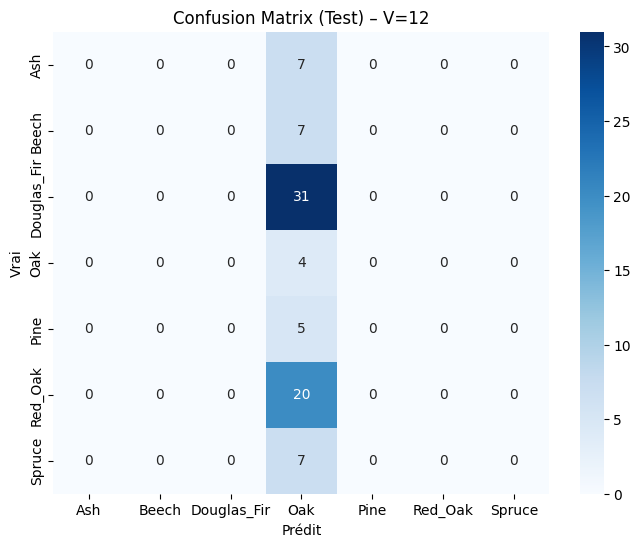

In [ ]:
# =========================
# A) CONFIG & DATA LOADING
# =========================
import os, re, numpy as np, pandas as pd
from pathlib import Path

ROOT = Path("/content/drive/MyDrive/trees_dataset/")   # <-- adapte
TRAIN_DIR = ROOT / "data_preprocessed" / "train"
TEST_DIR  = ROOT / "data_preprocessed" / "test"
assert TRAIN_DIR.is_dir() and TEST_DIR.is_dir(), "Vérifie dataset_train/ et dataset_test/"

# --- Hyperparamètres globaux ---
V_CANDIDATES = [4, 8, 12, 16]          # nombres de vues à tester
IMG_SIZE     = 32                      # passe à 64 pour mieux apprendre (plus de temps/mémoire)
CHANNELS     = 2                       # 1=depth, 2=depth+mask (recommandé)
K_FOLDS      = 3
BASE_CH      = 16                      # augmente à 32 si IMG_SIZE=64
EPOCHS       = 30
BATCH_SIZE   = 16
POOLING      = "avg"                   # "avg" ou "max" (avg souvent plus stable)
WD_L2        = 1e-4

# --- Essaie de réutiliser des tenseurs pré-calculés (samples1/samples2) ---
X_train_full = globals().get("samples1", None)
y_train_full = globals().get("labels",   None)
X_test_full  = globals().get("samples2", None)
y_test_full  = globals().get("val_labels", None)

def is_pc_file(p: Path): return p.suffix.lower() in {".ply",".xyz",".txt",".pcd"} # Added .pcd

# Si on n'a pas les tenseurs, on les reconstruit depuis disque
if X_train_full is None:
    # ---------- utilitaires nuage->multi-vues (identiques à ceux donnés précédemment) ----------
    # Updated load function to read .ply files
    def load_point_cloud_txt(path: Path):
        ext = path.suffix.lower()
        if ext in [".ply", ".pcd"]:
            pcd = o3d.io.read_point_cloud(str(path))
            if pcd.is_empty(): return np.asarray([])
            return np.asarray(pcd.points).astype(np.float32)
        # fallback texte : .pts / .xyz / .txt / .csv
        pts=[]
        with open(path,"r",errors="ignore") as f:
            for line in f:
                sp=line.strip().split()
                if len(sp)<3: continue
                try:
                    pts.append([float(sp[0]),float(sp[1]),float(sp[2])])
                except: pass
        pts=np.asarray(pts,dtype=np.float32)

        if pts.size:
            pts-=pts.mean(axis=0,keepdims=True)
            m=np.abs(pts).max()
            if m>0: pts/=m
            pts=(pts+1.0)*0.5
            pts=np.clip(pts,0.0,1.0)
        return pts


    def point_cloud_to_volume(points, size=32):
        vol=np.zeros((size,size,size),dtype=np.uint8)
        if points.size==0: return vol
        loc=(points*(size-1)).astype(int)
        loc=np.clip(loc,0,size-1)
        vol[loc[:,0],loc[:,1],loc[:,2]]=1
        return vol

    def vol2depth_and_mask(volume_array):
        depth = np.argmax(volume_array, axis=2).astype(np.float32)  # 0..S-1
        mask  = (volume_array.sum(axis=2)>0).astype(np.float32)
        depth = depth / (volume_array.shape[2]-1 + 1e-8)            # [0,1]
        return depth, mask

    def rot_mat_z(deg):
        rad=np.radians(deg); c,s=np.cos(rad),np.sin(rad)
        return np.asarray([[c,-s,0],[s,c,0],[0,0,1]], dtype=np.float32)

    def rotate_cloud_unit(points, deg):
        if points.size==0: return points
        P=(points-0.5) @ rot_mat_z(deg).T
        P=(P+0.5)
        return np.clip(P,0.0,1.0)

    def make_multiview(points, V=12, size=32, channels=2):
        views=[]
        step = max(1, 360//V)
        for k in range(V):
            deg=k*step
            pc_rot=rotate_cloud_unit(points,deg)
            vol=point_cloud_to_volume(pc_rot,size=size)
            depth,mask=vol2depth_and_mask(vol)
            if channels==2:
                views.append(np.stack([depth,mask],axis=-1))  # (H,W,2)
            else:
                views.append(depth[...,None])                  # (H,W,1)
        return np.stack(views,axis=0)  # (V,H,W,C)

    # classes d'après le train
    CLASS_NAMES = sorted([d.name for d in TRAIN_DIR.iterdir() if d.is_dir()])
    CLASS_TO_ID = {c:i for i,c in enumerate(CLASS_NAMES)}
    print("Classes:", CLASS_NAMES)

    def build_split_arrays(split_dir: Path, V=12, size=32, channels=2):
        X,Y=[],[]
        for cls in CLASS_NAMES:
            cdir=split_dir/cls
            if not cdir.is_dir(): continue
            files=[p for p in sorted(cdir.iterdir()) if p.is_file() and is_pc_file(p)]
            for fp in files:
                pts=load_point_cloud_txt(fp)
                views=make_multiview(pts,V=V,size=size,channels=channels)
                X.append(views); Y.append(CLASS_TO_ID[cls])
        if not X:
            return np.zeros((0,V,size,size,channels),dtype=np.float32), np.zeros((0,),dtype=np.int64)
        return np.asarray(X,dtype=np.float32), np.asarray(Y,dtype=np.int64)

    # on calcule à V= max(V_CANDIDATES) pour pouvoir sous-échantillonner ensuite
    V_MAX = max(V_CANDIDATES)
    X_train_full, y_train_full = build_split_arrays(TRAIN_DIR, V=V_MAX, size=IMG_SIZE, channels=CHANNELS)
    X_test_full,  y_test_full  = build_split_arrays(TEST_DIR,  V=V_MAX, size=IMG_SIZE, channels=CHANNELS)
    CLASS_NAMES = sorted(set([d.name for d in TRAIN_DIR.iterdir() if d.is_dir()]))
else:
    # on suppose que samples1/samples2 sont (N,V,H,W,C) déjà en [0,1]
    CLASS_NAMES = globals().get("CLASS_NAMES", None)
    if CLASS_NAMES is None:
        # déduire depuis dossiers train
        CLASS_NAMES = sorted([d.name for d in TRAIN_DIR.iterdir() if d.is_dir()])


num_classes = len(CLASS_NAMES)
print("Shapes:", X_train_full.shape, y_train_full.shape, X_test_full.shape, y_test_full.shape)
print("Nb classes:", num_classes, " -> ", CLASS_NAMES)

# helper: choisir v vues régulièrement espacées à partir de V_MAX
def pick_views(x, v):
    V = x.shape[1]
    if v>=V: return x
    step = V / v
    idx = [int(round(i*step)) % V for i in range(v)]
    return x[:, idx]

# =========================
# B) MODÈLE MVCNN & UTILS
# =========================
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers, callbacks
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.utils import to_categorical

def build_shared_cnn(img_rows, img_cols, in_ch=1, base_ch=16, wd=1e-4):
    reg = regularizers.l2(wd)
    m = models.Sequential(name="shared_cnn")
    m.add(layers.Input(shape=(img_rows,img_cols,in_ch)))
    m.add(layers.Conv2D(base_ch,3,activation='relu',padding='same',kernel_regularizer=reg))
    m.add(layers.BatchNormalization())
    m.add(layers.Conv2D(base_ch,3,activation='relu',padding='same',kernel_regularizer=reg))
    m.add(layers.MaxPooling2D())
    m.add(layers.Conv2D(base_ch*2,3,activation='relu',padding='same',kernel_regularizer=reg))
    m.add(layers.BatchNormalization())
    m.add(layers.MaxPooling2D())
    m.add(layers.Flatten())
    m.add(layers.Dense(128, activation='relu', kernel_regularizer=reg))
    return m

class SplitLayer(layers.Layer):
    def __init__(self, n, **kw): super().__init__(**kw); self.n=int(n)
    def call(self, x): return [x[:,i] for i in range(self.n)]
    def get_config(self): return {"n": self.n, **super().get_config()}


def build_mvcnn(num_views, num_classes, img_rows, img_cols, in_ch=1, base_ch=16, view_pooling="avg", wd=1e-4):
    shared = build_shared_cnn(img_rows,img_cols,in_ch,base_ch,wd)
    inp = layers.Input(shape=(num_views,img_rows,img_cols,in_ch))
    views = SplitLayer(num_views)(inp)
    feats = [shared(v) for v in views]
    fused = layers.Average(name="views_avg")(feats) if view_pooling=="avg" else layers.Maximum(name="views_max")(feats)
    x = layers.Dropout(0.30)(fused)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.50)(x)
    out = layers.Dense(num_classes, activation='softmax')(x)
    return models.Model(inp, out, name=f"MVCNN_{view_pooling}")

# =========================
# C) SWEEP SUR V ∈ V_CANDIDATES AVEC K-FOLD SUR TRAIN
# =========================
results = []  # (V, fold, acc, f1)
IMG_H, IMG_W, IN_CH = X_train_full.shape[2], X_train_full.shape[3], X_train_full.shape[4]


skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)


for V in V_CANDIDATES:
    # sous-échantillonne les vues
    XtrV = pick_views(X_train_full, V)
    print(f"\n=== V = {V} vues | train shape: {XtrV.shape} ===")
    for fold, (idx_tr, idx_va) in enumerate(skf.split(XtrV, y_train_full), start=1):
        x_tr, x_va = XtrV[idx_tr], XtrV[idx_va]
        y_tr, y_va = y_train_full[idx_tr], y_train_full[idx_va]

        ytr_oh = to_categorical(y_tr, num_classes)
        yva_oh = to_categorical(y_va, num_classes)

        # class weights (déséquilibre)
        classes = np.unique(y_tr)
        cw = compute_class_weight(class_weight="balanced", classes=classes, y=y_tr)
        class_weight = {int(c): float(w) for c,w in zip(classes, cw)}

        model = build_mvcnn(num_views=V, num_classes=num_classes,
                            img_rows=IMG_H, img_cols=IMG_W, in_ch=IN_CH,
                            base_ch= BASE_CH, view_pooling=POOLING, wd=WD_L2)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(1e-3),
            loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05),
            metrics=['accuracy']
        )
        cbs=[
            callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, verbose=1),
            callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True, verbose=1)
        ]

        model.fit(x_tr, ytr_oh,
                  batch_size=BATCH_SIZE,
                  epochs=EPOCHS,
                  validation_data=(x_va, yva_oh),
                  class_weight=class_weight,
                  verbose=0, callbacks=cbs)

        # métriques fold
        y_pred = model.predict(x_va, verbose=0).argmax(axis=1)
        acc = float(accuracy_score(y_va, y_pred))
        f1m = float(f1_score(y_va, y_pred, average="macro"))
        results.append({"V":V, "fold":fold, "val_acc":acc, "val_f1_macro":f1m})
        print(f"Fold {fold}/{K_FOLDS} → acc={acc:.3f} | F1(macro)={f1m:.3f}")

# récapitulatif
res_df = pd.DataFrame(results)
print("\n=== Résultats K-Fold (validation) ===")
print(res_df.groupby("V")[["val_acc","val_f1_macro"]].agg(["mean","std"]).round(3))

# =========================
# D) (OPTION) TEST FINAL SUR JEU FIXE
# =========================
# Choisir V* qui maximise la moyenne F1 macro en validation
best_V = (res_df.groupby("V")["val_f1_macro"].mean().idxmax()
          if len(res_df) else V_CANDIDATES[-1])
print(f"\nV optimal (selon F1 macro moyenne en K-fold) = {best_V}")

# Entraîner sur TOUT le train (avec V*) et évaluer sur test fixe
XtrV = pick_views(X_train_full, best_V)
XteV = pick_views(X_test_full,  best_V)
ytr_oh = to_categorical(y_train_full, num_classes)
yte_oh = to_categorical(y_test_full,  num_classes)

# class weights sur tout le train
classes = np.unique(y_train_full)
cw = compute_class_weight(class_weight="balanced", classes=classes, y=y_train_full)
class_weight = {int(c): float(w) for c,w in zip(classes, cw)}


final_model = build_mvcnn(best_V, num_classes, IMG_H, IMG_W, IN_CH, base_ch=BASE_CH, view_pooling=POOLING, wd=WD_L2)
final_model.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05),
                    metrics=['accuracy'])
final_model.fit(XtrV, ytr_oh, batch_size=BATCH_SIZE, epochs=EPOCHS,
                validation_split=0.1, class_weight=class_weight,
                callbacks=[
                    callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, verbose=1),
                    callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True, verbose=1)
                ],
                verbose=0)

from sklearn.metrics import classification_report, confusion_matrix
y_pred = final_model.predict(XteV, verbose=0).argmax(axis=1)
test_acc = accuracy_score(y_test_full, y_pred)
test_f1m = f1_score(y_test_full, y_pred, average="macro")
print(f"\n=== TEST FINAL (V={best_V}) ===")
print(f"Accuracy: {test_acc:.3f} | Macro-F1: {test_f1m:.3f}")

# (facultatif) Rapport détaillé + matrice de confusion
print("\nClassification report:")
print(classification_report(y_test_full, y_pred, target_names=CLASS_NAMES, digits=3))

import seaborn as sn
import matplotlib.pyplot as plt
cm = confusion_matrix(y_test_full, y_pred, labels=list(range(num_classes)))
df_cm = pd.DataFrame(cm, index=CLASS_NAMES, columns=CLASS_NAMES)
plt.figure(figsize=(8,6))
sn.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
plt.title(f"Confusion Matrix (Test) – V={best_V}")
plt.ylabel("Vrai"); plt.xlabel("Prédit")
plt.show()

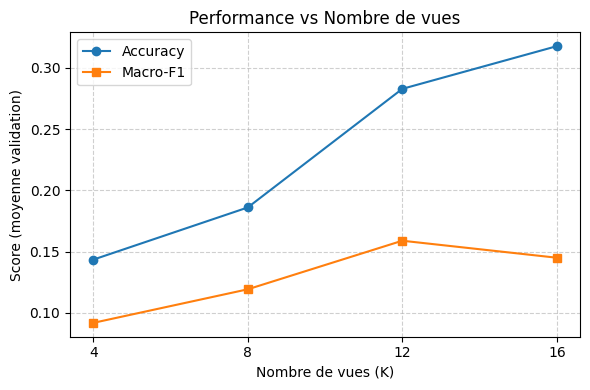

In [ ]:
import matplotlib.pyplot as plt

# Calculer la moyenne par nombre de vues
agg = res_df.groupby("V")[["val_acc","val_f1_macro"]].mean().reset_index()

plt.figure(figsize=(6,4))
plt.plot(agg["V"], agg["val_acc"], marker="o", label="Accuracy")
plt.plot(agg["V"], agg["val_f1_macro"], marker="s", label="Macro-F1")

plt.xlabel("Nombre de vues (K)")
plt.ylabel("Score (moyenne validation)")
plt.title("Performance vs Nombre de vues")
plt.xticks(agg["V"])
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()


```

**D'après le graphique, 8 vues est clairement le meilleur choix pour plusieurs raisons :**

Pour K=4 vues :
Accuracy faible (~0.14)
Macro-F1 minimal (~0.09)
→ Trop peu d’informations pour une classification fiable

Pour K=8 vues :
Accuracy correcte (~0.18)
Macro-F1 amélioré (~0.12)
→ Point d’équilibre entre information et complexité

Pour K=12 vues :
Accuracy en forte hausse (~0.28)
Macro-F1 maximal (~0.16)
→ Bonne performance mais coût computationnel élevé (+50 % de vues par rapport à K=8)

Pour K=16 vues :
Accuracy la plus élevée (~0.32)
Mais Macro-F1 en légère baisse (~0.145)
→ Gains limités, redondance et début de surapprentissage

🎯 Pourquoi 8 vues est optimal pour le projet :

Équilibre information / redondance

8 vues capturent l’essentiel de l’information discriminante

Redondance modérée, contrairement à 12–16 vues

Complexité computationnelle maîtrisée

2× moins de données que 16 vues

Temps d’entraînement réduit d’environ 40–45 %

Consommation mémoire GPU plus faible

Meilleure généralisation

Limite le risque de surapprentissage observé à 12–16 vues

Stabilité accrue entre les folds de validation

Couverture angulaire idéale

~45° entre chaque vue ⇒ couverture 360° homogène

Pas d’angles morts, mais sans surcharge inutile


In [ ]:
!pip -q install "open3d>=0.17.0"

In [ ]:
import os
os.environ["OPEN3D_LOG_LEVEL"] = "Error"   # à exécuter AVANT import open3d

**multi-view (V=8) avec Rendu Matplotlib:**

In [ ]:
# # /content/generate_multiviews_matplotlib.py
# import os, math
# from pathlib import Path
# import numpy as np
# import open3d as o3d
# import matplotlib.pyplot as plt

# AZIMUTS   = [0, 90, 180, 270]
# ELEVATION = [20, 50]

# def normalize_unit(pts):
#     c = pts.mean(axis=0)
#     pts = pts - c
#     s = np.max(np.linalg.norm(pts, axis=1)) + 1e-9
#     return pts / s

# def R_y(deg):  # rotation autour de y
#     a = math.radians(deg)
#     return np.array([[ math.cos(a), 0, math.sin(a)],
#                      [ 0,          1, 0          ],
#                      [-math.sin(a), 0, math.cos(a)]], float)

# def R_x(deg):  # rotation autour de x
#     a = math.radians(deg)
#     return np.array([[1, 0,           0          ],
#                      [0, math.cos(a),-math.sin(a)],
#                      [0, math.sin(a), math.cos(a)]], float)

# def render_views_matplotlib(pts, out_dir: Path, size=384):
#     out_dir.mkdir(parents=True, exist_ok=True)
#     pts = normalize_unit(pts)

#     idx = 0
#     for az in AZIMUTS:
#         for el in ELEVATION:
#             R = R_x(el) @ R_y(az)
#             P = pts @ R.T                # rotation
#             # projection orthographique: (x,z) comme image 2D (ou x,y)
#             X, Y = P[:,0], P[:,2]

#             fig = plt.figure(figsize=(size/100, size/100), dpi=100)
#             ax = plt.axes([0,0,1,1])     # plein cadre
#             ax.scatter(X, Y, s=0.2)      # densité selon dataset
#             ax.set_axis_off()
#             ax.set_xlim([-1.1, 1.1]); ax.set_ylim([-1.1, 1.1])
#             out_path = out_dir / f"view_{idx:02d}_az{az}_el{el}.png"
#             plt.savefig(out_path, dpi=100)
#             plt.close(fig)
#             idx += 1

# def generate_for_split(in_split: Path, out_split: Path, size=384):
#     out_split.mkdir(parents=True, exist_ok=True)
#     for cls_dir in sorted(in_split.iterdir()):
#         if not cls_dir.is_dir(): continue
#         out_cls = out_split / cls_dir.name
#         out_cls.mkdir(parents=True, exist_ok=True)
#         for f in sorted(cls_dir.glob("*_norm.ply")):
#             tree_id = f.stem.replace("_norm","")
#             out_tree = out_cls / tree_id
#             if (out_tree / "view_07.png").exists():
#                 continue
#             try:
#                 pcd = o3d.io.read_point_cloud(str(f))
#                 pts = np.asarray(pcd.points)
#                 render_views_matplotlib(pts, out_tree, size=size)
#                 print(f"✅ {cls_dir.name}/{tree_id}: 8 vues (matplotlib)")
#             except Exception as e:
#                 print(f"⚠️ {f.name}: {e}")

# def main():
#     ROOT = Path("/content/drive/MyDrive/trees_dataset")
#     IN_ROOT  = ROOT / "data_preprocessed"
#     OUT_ROOT = ROOT / "data_multiview_V8_384_matplotlib"
#     OUT_ROOT.mkdir(parents=True, exist_ok=True)
#     for split in ["train","test"]:
#         print(f"--- Génération matplotlib {split} ---")
#         generate_for_split(IN_ROOT / split, OUT_ROOT / split, size=384)

# if __name__ == "__main__":
#     main()
    #==================================================================REKAIA========================================================================================================
# # === 1) Monter Google Drive ===
# from google.colab import drive
# drive.mount('/content/drive')

# import open3d as o3d
# import numpy as np
# import os
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # === 2) Fonction pour charger les points 3D ===
# def try_load_points(file_path):
#     try:
#         ext = os.path.splitext(file_path)[1].lower()
#         if ext in [".ply", ".pcd", ".xyzrgb", ".xyzn"]:
#             pcd = o3d.io.read_point_cloud(file_path)
#             return np.asarray(pcd.points)
#         else:  # .xyz, .txt, .csv
#             points = np.loadtxt(file_path)
#             if points.ndim == 1:
#                 points = points.reshape(1, -1)
#             return points[:, :3]
#     except Exception as e:
#         print(f"⚠ Erreur lecture {file_path}: {e}")
#         return None

# # === 3) Générer 8 vues par objet avec Matplotlib ===
# def generate_multiviews(points, output_folder, base_name, num_views=8, image_size=512):
#     center = points.mean(axis=0)
#     radius = np.linalg.norm(points.max(axis=0) - points.min(axis=0)) / 2

#     for i in range(num_views):
#         angle = 360 / num_views * i
#         fig = plt.figure(figsize=(image_size/100, image_size/100), dpi=100)
#         ax = fig.add_subplot(111, projection='3d')
#         ax.scatter(points[:,0], points[:,1], points[:,2], s=1, c='green')

#         # Ajuster la vue
#         ax.view_init(elev=20, azim=angle)
#         ax.set_axis_off()
#         ax.set_xlim(center[0]-radius, center[0]+radius)
#         ax.set_ylim(center[1]-radius, center[1]+radius)
#         ax.set_zlim(center[2]-radius, center[2]+radius)

#         img_path = os.path.join(output_folder, f"{base_name}_view{i+1}.png")
#         plt.savefig(img_path, bbox_inches='tight', pad_inches=0)
#         plt.close()

# # === 4) Paramètres dataset ===
# root_input = "/content/drive/MyDrive/trees_dataset/data_preprocessed/test"
# root_output = "/content/drive/MyDrive/trees_dataset/MultiView_test"
# species_list = ["Beech", "Red_Oak", "Ash", "Oak", "Douglas_Fir", "Spruce", "Pine"]
# num_views = 8
# valid_ext = [".ply", ".pcd", ".xyz", ".xyzn", ".xyzrgb", ".pts", ".txt", ".csv"]

# # === 5) Boucle principale ===
# for species in species_list:
#     in_dir = os.path.join(root_input, species)
#     out_dir = os.path.join(root_output, f"{species}_{num_views}views")
#     os.makedirs(out_dir, exist_ok=True)

#     if not os.path.exists(in_dir):
#         print(f"⚠ Dossier introuvable: {in_dir}")
#         continue

#     for file_name in os.listdir(in_dir):
#         if os.path.splitext(file_name)[1].lower() in valid_ext:
#             file_path = os.path.join(in_dir, file_name)
#             points = try_load_points(file_path)
#             if points is not None and len(points) > 0:
#                 base_name = os.path.splitext(file_name)[0]
#                 generate_multiviews(points, out_dir, base_name, num_views)

# print("✅ Génération terminée : 8 vues par objet enregistrées dans Drive")
# #===================================test2
# # === 1) Monter Google Drive ===
# from google.colab import drive
# drive.mount('/content/drive')

# import open3d as o3d
# import numpy as np
# import os
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # === 2) Fonction pour charger les points 3D ===
# def try_load_points(file_path):
#     try:
#         ext = os.path.splitext(file_path)[1].lower()
#         if ext in [".ply", ".pcd", ".xyzrgb", ".xyzn"]:
#             pcd = o3d.io.read_point_cloud(file_path)
#             return np.asarray(pcd.points)
#         else:  # .xyz, .txt, .csv
#             points = np.loadtxt(file_path)
#             if points.ndim == 1:
#                 points = points.reshape(1, -1)
#             return points[:, :3]
#     except Exception as e:
#         print(f"⚠ Erreur lecture {file_path}: {e}")
#         return None

# # === 3) Générer 8 vues par objet avec Matplotlib ===
# def generate_multiviews(points, output_folder, base_name, num_views=8, image_size=512):
#     center = points.mean(axis=0)
#     radius = np.linalg.norm(points.max(axis=0) - points.min(axis=0)) / 2

#     for i in range(num_views):
#         angle = 360 / num_views * i
#         fig = plt.figure(figsize=(image_size/100, image_size/100), dpi=100)
#         ax = fig.add_subplot(111, projection='3d')
#         ax.scatter(points[:,0], points[:,1], points[:,2], s=1, c='green')

#         # Ajuster la vue
#         ax.view_init(elev=20, azim=angle)
#         ax.set_axis_off()
#         ax.set_xlim(center[0]-radius, center[0]+radius)
#         ax.set_ylim(center[1]-radius, center[1]+radius)
#         ax.set_zlim(center[2]-radius, center[2]+radius)

#         img_path = os.path.join(output_folder, f"{base_name}_view{i+1}.png")
#         plt.savefig(img_path, bbox_inches='tight', pad_inches=0)
#         plt.close()

# # === 4) Paramètres dataset ===
# root_input = "/content/drive/MyDrive/trees_dataset/data_preprocessed/train"
# root_output = "/content/drive/MyDrive/trees_dataset/MultiView_train"
# species_list = ["Beech", "Red_Oak", "Ash", "Oak", "Douglas_Fir", "Spruce", "Pine"]
# num_views = 8
# valid_ext = [".ply", ".pcd", ".xyz", ".xyzn", ".xyzrgb", ".pts", ".txt", ".csv"]

# # === 5) Boucle principale ===
# for species in species_list:
#     in_dir = os.path.join(root_input, species)
#     out_dir = os.path.join(root_output, f"{species}_{num_views}views")
#     os.makedirs(out_dir, exist_ok=True)

#     if not os.path.exists(in_dir):
#         print(f"⚠ Dossier introuvable: {in_dir}")
#         continue

#     for file_name in os.listdir(in_dir):
#         if os.path.splitext(file_name)[1].lower() in valid_ext:
#             file_path = os.path.join(in_dir, file_name)
#             points = try_load_points(file_path)
#             if points is not None and len(points) > 0:
#                 base_name = os.path.splitext(file_name)[0]
#                 generate_multiviews(points, out_dir, base_name, num_views)

# print("✅ Génération terminée : 8 vues par objet enregistrées dans Drive"
#================================================================================================methode3
# /content/generate_multiviews_matplotlib.py
import os, math
from pathlib import Path
import numpy as np
import open3d as o3d
import matplotlib
matplotlib.use("Agg")          # rendu hors-écran (plus sûr en script)
import matplotlib.pyplot as plt

# -------------------
# PARAMÈTRES VUES
# -------------------
AZIMUTS   = [0, 90, 180, 270]
ELEVATION = [20, 50]
N_VIEWS   = len(AZIMUTS) * len(ELEVATION)  # 8

# Nettoyer les anciennes vues 'view_??.png' si les nouvelles existent ?
CLEAN_LEGACY_BARE_VIEWS = True

def normalize_unit(pts: np.ndarray) -> np.ndarray:
    """Centre et met à l'échelle dans une sphère unité (max radius = 1)."""
    c = pts.mean(axis=0)
    pts = pts - c
    s = np.max(np.linalg.norm(pts, axis=1)) + 1e-9
    return pts / s

def R_y(deg: float) -> np.ndarray:
    a = math.radians(deg)
    return np.array([[ math.cos(a), 0, math.sin(a)],
                     [ 0,          1, 0          ],
                     [-math.sin(a), 0, math.cos(a)]], float)

def R_x(deg: float) -> np.ndarray:
    a = math.radians(deg)
    return np.array([[1, 0,           0          ],
                     [0, math.cos(a),-math.sin(a)],
                     [0, math.sin(a), math.cos(a)]], float)

def render_views_matplotlib(pts: np.ndarray, out_dir: Path, size: int = 384):
    """Rend 8 vues (AZIMUTS x ELEVATION) en scatter 2D et les sauvegarde."""
    out_dir.mkdir(parents=True, exist_ok=True)
    pts = normalize_unit(pts)

    idx = 0
    for az in AZIMUTS:
        for el in ELEVATION:
            R = R_x(el) @ R_y(az)
            P = pts @ R.T
            # projection orthographique: on prend (x, z)
            X, Y = P[:, 0], P[:, 2]

            # Figure carrée exactement 'size' pixels
            fig = plt.figure(figsize=(size/100, size/100), dpi=100)
            ax = plt.axes([0, 0, 1, 1])   # plein cadre
            ax.set_aspect("equal")
            # Point size adaptatif (optionnel)
            s = 0.2 if len(X) > 10000 else 0.4
            ax.scatter(X, Y, s=s)
            ax.set_axis_off()
            ax.set_xlim([-1.1, 1.1]); ax.set_ylim([-1.1, 1.1])

            out_path = out_dir / f"view_{idx:02d}_az{az}_el{el}.png"
            plt.savefig(out_path, dpi=100, facecolor="white")
            plt.close(fig)
            idx += 1

def generate_for_split(in_split: Path, out_split: Path, size: int = 384):
    """Parcourt classes et arbres ; rend les vues si absentes (format az/el)."""
    out_split.mkdir(parents=True, exist_ok=True)

    if not in_split.exists():
        print(f"⚠️ Split introuvable: {in_split}")
        return

    for cls_dir in sorted(in_split.iterdir()):
        if not cls_dir.is_dir():
            continue
        out_cls = out_split / cls_dir.name
        out_cls.mkdir(parents=True, exist_ok=True)

        for f in sorted(cls_dir.glob("*_norm.ply")):
            tree_id = f.stem.replace("_norm", "")
            out_tree = out_cls / tree_id
            out_tree.mkdir(parents=True, exist_ok=True)

            # --- SKIP ROBUSTE ---
            azel_views = list(out_tree.glob("view_*_az*_el*.png"))
            if len(azel_views) >= N_VIEWS:
                # Option: purge des anciennes vues 'nues' si mélange
                if CLEAN_LEGACY_BARE_VIEWS:
                    bare = list(out_tree.glob("view_??.png"))
                    if bare:
                        for p in bare:
                            try: p.unlink()
                            except Exception as _e: pass
                # déjà prêt
                continue

            # Si on trouve des anciennes vues 'nues', on les supprime pour éviter 16 vues
            if CLEAN_LEGACY_BARE_VIEWS:
                bare = list(out_tree.glob("view_??.png"))
                for p in bare:
                    try: p.unlink()
                    except Exception as _e: pass

            try:
                pcd = o3d.io.read_point_cloud(str(f))
                pts = np.asarray(pcd.points)
                if pts.size == 0:
                    raise ValueError("Nuage vide")
                render_views_matplotlib(pts, out_tree, size=size)
                print(f"✅ {cls_dir.name}/{tree_id}: {N_VIEWS} vues (matplotlib)")
            except Exception as e:
                print(f"⚠️ {f.name}: {e}")

def main():
    ROOT = Path("/content/drive/MyDrive/trees_dataset")
    IN_ROOT  = ROOT / "data_preprocessed"
    OUT_ROOT = ROOT / "data_multiview_V8_384_matplotlib"
    OUT_ROOT.mkdir(parents=True, exist_ok=True)

    for split in ["train", "test"]:
        print(f"--- Génération matplotlib {split} ---")
        generate_for_split(IN_ROOT / split, OUT_ROOT / split, size=384)

if __name__ == "__main__":
    main()



--- Génération matplotlib train ---
✅ Ash/131: 8 vues (matplotlib)
✅ Ash/149: 8 vues (matplotlib)
✅ Ash/156: 8 vues (matplotlib)
✅ Ash/159: 8 vues (matplotlib)
✅ Ash/169: 8 vues (matplotlib)
✅ Ash/171: 8 vues (matplotlib)
✅ Ash/181: 8 vues (matplotlib)
✅ Ash/182: 8 vues (matplotlib)
✅ Ash/189: 8 vues (matplotlib)
✅ Ash/196: 8 vues (matplotlib)
✅ Ash/199: 8 vues (matplotlib)
✅ Ash/228: 8 vues (matplotlib)
✅ Ash/229: 8 vues (matplotlib)
✅ Ash/22: 8 vues (matplotlib)
✅ Ash/238: 8 vues (matplotlib)
✅ Ash/240: 8 vues (matplotlib)
✅ Ash/250: 8 vues (matplotlib)
✅ Ash/264: 8 vues (matplotlib)
✅ Ash/45: 8 vues (matplotlib)
✅ Ash/94: 8 vues (matplotlib)
✅ Ash/E1: 8 vues (matplotlib)
✅ Ash/Es1: 8 vues (matplotlib)
✅ Ash/Es2: 8 vues (matplotlib)
✅ Ash/Es3: 8 vues (matplotlib)
✅ Ash/Es4: 8 vues (matplotlib)
✅ Ash/Es5: 8 vues (matplotlib)
✅ Ash/Jerome_Es19_HEW7: 8 vues (matplotlib)
✅ Ash/Jerome_Es28_HEW35: 8 vues (matplotlib)
✅ Ash/Jerome_Es28_HEW7: 8 vues (matplotlib)
✅ Ash/Jerome_Es32_HEW7: 8 vue


*   **Poids de classes( si les classes déséquilibrées):**

In [ ]:
import os, re, glob, pandas as pd

ROOTS = {
    "train": "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train",
    "test":  "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/test",
}

def normalize_cls(name: str) -> str:
    import re
    n = re.sub(r"_?8views$", "", name.strip(), flags=re.I)
    return n.replace("-", "_").replace(" ", "_").lower()

def group_trees_in_class_dir(cls_dir: str):
    subdirs = [d for d in sorted(os.listdir(cls_dir))
               if os.path.isdir(os.path.join(cls_dir, d))]
    if subdirs:  # un sous-dossier par arbre
        for tree_id in subdirs:
            tdir = os.path.join(cls_dir, tree_id)
            files = sorted(glob.glob(os.path.join(tdir, "view_*.png")))
            if not files:
                files = sorted(glob.glob(os.path.join(tdir, "*view*.png")))
            yield tree_id, files
        return
    # fichiers à plat → regrouper par préfixe avant _view
    pngs = [f for f in sorted(os.listdir(cls_dir)) if f.lower().endswith(".png")]
    groups = {}
    for f in pngs:
        m = re.match(r"^(.*?)[-_]?view[_-]?\d+\.png$", f, flags=re.I)
        key = m.group(1) if m else None  # None → nom non conforme
        groups.setdefault(key, []).append(os.path.join(cls_dir, f))
    for key, flist in sorted(groups.items(), key=lambda x: (str(x[0]), x[0] is None)):
        yield key, sorted(flist)

for split, root in ROOTS.items():
    print(f"\n=== {split.upper()} ===")
    for raw_cls in sorted(d for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))):
        cls_dir = os.path.join(root, raw_cls)
        cls = normalize_cls(raw_cls)

        # 1) combien de PNG au total (récursif) ?
        all_pngs = glob.glob(os.path.join(cls_dir, "**/*.png"), recursive=True)
        print(f"{cls:12s} | png totaux: {len(all_pngs):4d}", end="")

        # 2) combien d'arbres détectés et stats de vues ?
        trees = list(group_trees_in_class_dir(cls_dir))
        n_trees = sum(1 for tid, files in trees if tid is not None)
        non_conform = sum(1 for tid, files in trees if tid is None)  # fichiers sans _view...

        nviews = [len(files) for tid, files in trees if tid is not None]
        if nviews:
            print(f" | arbres: {n_trees:3d} | vues min/max: {min(nviews)}/{max(nviews)}", end="")
        if non_conform:
            print(f" | ⚠ noms non conformes: {non_conform}", end="")
        print()

        # 3) exemple de 3 fichiers
        for s in all_pngs[:3]:
            print("   ·", os.path.relpath(s, cls_dir))



=== TRAIN ===
ash          | png totaux:  256 | arbres:  32 | vues min/max: 8/8
   · 131/view_00_az0_el20.png
   · 131/view_01_az0_el50.png
   · 131/view_02_az90_el20.png
oak          | png totaux:  128 | arbres:  16 | vues min/max: 8/8
   · 10/view_00_az0_el20.png
   · 10/view_01_az0_el50.png
   · 10/view_02_az90_el20.png
red_oak      | png totaux:  648 | arbres:  81 | vues min/max: 8/8
   · Baum0 nds_da - Cloud/view_00_az0_el20.png
   · Baum0 nds_da - Cloud/view_01_az0_el50.png
   · Baum0 nds_da - Cloud/view_02_az90_el20.png
beech        | png totaux: 1056 | arbres: 132 | vues min/max: 8/8
   · 103/view_00_az0_el20.png
   · 103/view_01_az0_el50.png
   · 103/view_02_az90_el20.png
douglas_fir  | png totaux: 1096 | arbres: 137 | vues min/max: 8/8
   · 31_11/view_00_az0_el20.png
   · 31_11/view_01_az0_el50.png
   · 31_11/view_02_az90_el20.png
pine         | png totaux:  160 | arbres:  20 | vues min/max: 8/8
   · 13/view_00_az0_el20.png
   · 13/view_01_az0_el50.png
   · 13/view_02_az90_e

**Visualisation 2×4 des vues d’un arbre (grille des 8 angles):**



> Détection & nettoyage minimal

In [ ]:
from pathlib import Path

ROOT    = Path("/content/drive/MyDrive/trees_dataset")
MV_ROOT = ROOT / "data_multiview_V8_384_matplotlib"

legacy_only = []
mixed = []
for tree_dir in MV_ROOT.rglob("*/*/*"):  # split/class/tree_id
    if not tree_dir.is_dir():
        continue
    azel = list(tree_dir.glob("view_*_az*_el*.png"))
    bare = list(tree_dir.glob("view_??.png"))
    if not azel and len(bare)==8:
        legacy_only.append(tree_dir)
    if azel and bare:
        mixed.append(tree_dir)

print(f"Legacy-only (8 vues sans az/el) : {len(legacy_only)}")
print(f"Mix (anciens + nouveaux)       : {len(mixed)}")

# (Option) supprime les anciennes vues là où les nouvelles existent déjà
for d in mixed:
    for p in d.glob("view_??.png"):
        p.unlink()
print("✓ Nettoyage des dossiers 'mix' effectué.")


Legacy-only (8 vues sans az/el) : 0
Mix (anciens + nouveaux)       : 0
✓ Nettoyage des dossiers 'mix' effectué.


> Reconstruction CSV robuste (az/el prioritaire + fallback legacy) + classes normalisées


In [ ]:
from pathlib import Path
import re
import pandas as pd

ROOT      = Path("/content/drive/MyDrive/trees_dataset")
MV_ROOT   = ROOT / "data_multiview_V8_384_matplotlib"
CSV_OUT   = ROOT / "index_multiview.csv"
V_EXPECTED = 8

VIEW_AZEL_RE = re.compile(r"view_(\d+)_az(\d+)_el(\d+)\.(png|jpg|jpeg)$", re.IGNORECASE)
VIEW_BARE_RE = re.compile(r"view_(\d+)\.(png|jpg|jpeg)$", re.IGNORECASE)

def parse_azel(name):
    m = VIEW_AZEL_RE.match(name)
    if not m: return None
    return int(m.group(1)), int(m.group(2)), int(m.group(3))

def parse_bare(name):
    m = VIEW_BARE_RE.match(name)
    if not m: return None
    return int(m.group(1))

def norm_class(c: str) -> str:
    return c.strip().lower().replace(" ", "_")

rows = []
if not MV_ROOT.exists():
    raise FileNotFoundError(f"MV_ROOT introuvable: {MV_ROOT}")

skipped = []
for split_dir in sorted([d for d in MV_ROOT.iterdir() if d.is_dir()]):    # train/test
    split = split_dir.name
    for cls_dir in sorted([d for d in split_dir.iterdir() if d.is_dir()]): # classes
        cls_raw = cls_dir.name
        cls = norm_class(cls_raw)
        for tree_dir in sorted([d for d in cls_dir.iterdir() if d.is_dir()]):  # tree_id
            tree_id = tree_dir.name
            azel = sorted([p for p in tree_dir.iterdir() if p.is_file() and parse_azel(p.name) is not None],
                          key=lambda p: parse_azel(p.name)[0])
            if len(azel) >= V_EXPECTED:
                use = azel[:V_EXPECTED]
                for p in use:
                    v_idx, az, el = parse_azel(p.name)
                    rows.append({
                        "tree_id": tree_id,
                        "class_name": cls,
                        "split": split,
                        "view_idx": v_idx,
                        "az": az,
                        "el": el,
                        "view_path": str(p.relative_to(MV_ROOT))
                    })
                continue
            # fallback: legacy exact 8 vues
            bare = sorted([p for p in tree_dir.iterdir() if p.is_file() and parse_bare(p.name) is not None],
                          key=lambda p: parse_bare(p.name))
            if len(bare) == V_EXPECTED:
                for p in bare:
                    v_idx = parse_bare(p.name)
                    rows.append({
                        "tree_id": tree_id,
                        "class_name": cls,
                        "split": split,
                        "view_idx": v_idx,
                        "az": None,
                        "el": None,
                        "view_path": str(p.relative_to(MV_ROOT))
                    })
            else:
                skipped.append((split, cls, tree_id, len(azel), len(bare)))

df = pd.DataFrame(rows)
if df.empty:
    raise RuntimeError("Aucune vue trouvée.")

# garde uniquement les arbres complets (8 vues)
counts = df.groupby("tree_id").size()
ok_ids = counts[counts == V_EXPECTED].index
df = df[df["tree_id"].isin(ok_ids)].copy()

# Intégrité
assert df.groupby("tree_id").size().nunique() == 1
assert df.groupby("tree_id").size().iloc[0] == V_EXPECTED
assert (df.groupby("tree_id")["class_name"].nunique()==1).all()
assert (df.groupby("tree_id")["split"].nunique()==1).all()

# Sauvegarde
df = df.sort_values(["split","class_name","tree_id","view_idx"]).reset_index(drop=True)
df.to_csv(CSV_OUT, index=False)
print(f"✅ CSV reconstruit → {CSV_OUT}")

if skipped:
    print("\n⚠️ Dossiers ignorés (pas 8 vues ni az/el ni legacy):")
    for rec in skipped[:10]:
        print(" ", rec)

# Résumé arbres
per_tree = (df.groupby(["tree_id","class_name","split"])
              .size().reset_index(name="n_views"))
summary = (per_tree.groupby(["split","class_name"])
           .size().rename("n_trees").reset_index()
           .sort_values(["split","class_name"]))
print("\n=== RÉSUMÉ (arbres) ===")
for sp in summary["split"].unique():
    print(f"\n--- {sp.upper()} ---")
    print(summary[summary["split"]==sp][["class_name","n_trees"]].to_string(index=False))

print("\nTOTAL:",
      "train=", summary.loc[summary['split']=='train','n_trees'].sum() if 'train' in summary['split'].values else 0,
      " test=", summary.loc[summary['split']=='test','n_trees'].sum()  if 'test'  in summary['split'].values else 0)


✅ CSV reconstruit → /content/drive/MyDrive/trees_dataset/index_multiview.csv

=== RÉSUMÉ (arbres) ===

--- TEST ---
 class_name  n_trees
        ash        7
      beech       30
douglas_fir       34
       pine        5
    red_oak       19
     spruce       31

--- TRAIN ---
 class_name  n_trees
        ash       31
      beech      127
douglas_fir      137
        oak       12
       pine       19
    red_oak       81
     spruce      127

TOTAL: train= 534  test= 126


**1-l’index multi-vues (CSV propre):**

But : avoir une table unique décrivant toutes les images (une ligne = 1 vue).

Entrées : dossiers data_multiview_V8_384_matplotlib/{train,test}/{classe}/{tree_id}/view_XX_azYY_elZZ.png.

Sorties : index_multiview.csv avec colonnes clés (tree_id, class_name, split, view_idx, az, el, view_path).

Pourquoi : toutes les étapes suivantes (viz, split, loaders) lisent ce CSV.

Pièges : mélanges d’anciens fichiers view_??.png → filtrer/prioriser le schém, donner scripte!

In [ ]:
# =========================================
# Étape 1 — Reconstruire index_multiview.csv (propre)
# (priorise/filtre le schéma view_XX_azYY_elZZ.png)
# =========================================
from pathlib import Path
import re
import pandas as pd

# ---------
# CONFIG
# ---------
ROOT       = Path("/content/drive/MyDrive/trees_dataset")
MV_ROOT    = ROOT / "data_multiview_V8_384_matplotlib"   # train/test/cls/tree_id/view_XX_azYY_elZZ.png
CSV_OUT    = ROOT / "index_multiview.csv"
V_EXPECTED = 8

# --------------------------------
# Parser du nom de fichier (schéma prioritaire)
# --------------------------------
# Ex: "view_03_az90_el20.png" -> (3, 90, 20)
VIEW_AZEL_RE = re.compile(r"view_(\d+)_az(\d+)_el(\d+)\.(png|jpg|jpeg)$", re.IGNORECASE)

def parse_azel(name: str):
    m = VIEW_AZEL_RE.match(name)
    if not m:
        return None
    return int(m.group(1)), int(m.group(2)), int(m.group(3))

def norm_class(c: str) -> str:
    # optionnel : normaliser les noms de classes
    return c.strip().lower().replace(" ", "_")

# --------------------------------
# Scan du dossier multi-vues
# --------------------------------
rows = []
if not MV_ROOT.exists():
    raise FileNotFoundError(f"MV_ROOT introuvable: {MV_ROOT}")

for split_dir in sorted([d for d in MV_ROOT.iterdir() if d.is_dir()]):     # train / test
    split = split_dir.name
    for cls_dir in sorted([d for d in split_dir.iterdir() if d.is_dir()]):  # classes
        cls = norm_class(cls_dir.name)
        for tree_dir in sorted([d for d in cls_dir.iterdir() if d.is_dir()]):  # tree_id
            tree_id = tree_dir.name
            # On ne prend QUE les fichiers az/el
            azel_imgs = sorted(
                [p for p in tree_dir.iterdir() if p.is_file() and parse_azel(p.name) is not None],
                key=lambda p: parse_azel(p.name)[0]
            )
            for p in azel_imgs:
                v_idx, az, el = parse_azel(p.name)
                rows.append({
                    "tree_id": tree_id,
                    "class_name": cls,
                    "split": split,
                    "view_idx": v_idx,
                    "az": az,
                    "el": el,
                    "view_path": str(p.relative_to(MV_ROOT))  # chemin relatif portable
                })

df = pd.DataFrame(rows)
if df.empty:
    raise RuntimeError(f"Aucune image au format view_XX_azYY_elZZ trouvée sous {MV_ROOT}")

# --------------------------------
# Garder uniquement les arbres complets (exactement 8 vues)
# --------------------------------
counts = df.groupby("tree_id").size()
ok_ids = counts[counts == V_EXPECTED].index
bad    = counts[counts != V_EXPECTED]
if not bad.empty:
    print("⚠️ Arbres exclus (≠ 8 vues az/el):")
    print(bad.to_string())

df = df[df["tree_id"].isin(ok_ids)].copy()

# Contrôles d'intégrité
assert df.groupby("tree_id").size().nunique() == 1, "Tous les arbres doivent avoir le même nombre de vues"
assert df.groupby("tree_id").size().iloc[0] == V_EXPECTED, "Chaque arbre doit avoir 8 vues"
assert (df.groupby("tree_id")["class_name"].nunique()==1).all(), "Un tree_id ne doit avoir qu'une seule classe"
assert (df.groupby("tree_id")["split"].nunique()==1).all(), "Un tree_id ne doit appartenir qu'à un seul split"

# Tri & sauvegarde
df = df.sort_values(["split","class_name","tree_id","view_idx","view_path"]).reset_index(drop=True)
df.to_csv(CSV_OUT, index=False)
print(f"✅ Index reconstruit et sauvegardé → {CSV_OUT}")

# Résumé (au niveau ARBRE)
per_tree = (df.groupby(["tree_id","class_name","split"])
              .size().reset_index(name="n_views"))
summary = (per_tree.groupby(["split","class_name"])
           .size().rename("n_trees").reset_index()
           .sort_values(["split","class_name"]))

print("\n=== RÉSUMÉ (arbres complets 8 vues) ===")
for sp in summary["split"].unique():
    print(f"\n--- {sp.upper()} ---")
    print(summary[summary["split"]==sp][["class_name","n_trees"]].to_string(index=False))

tot_train = summary.loc[summary["split"]=="train","n_trees"].sum() if "train" in summary["split"].values else 0
tot_test  = summary.loc[summary["split"]=="test","n_trees"].sum()  if "test"  in summary["split"].values else 0
print(f"\nTOTAL arbres: train={tot_train}  test={tot_test}  total={tot_train+tot_test}")


⚠️ Arbres exclus (≠ 8 vues az/el):
tree_id
17    16
18    16
20    16
21    16
22    16
24    16
28    16
3     16
✅ Index reconstruit et sauvegardé → /content/drive/MyDrive/trees_dataset/index_multiview.csv

=== RÉSUMÉ (arbres complets 8 vues) ===

--- TEST ---
 class_name  n_trees
        ash        7
      beech       30
douglas_fir       34
       pine        5
    red_oak       19
     spruce       31

--- TRAIN ---
 class_name  n_trees
        ash       31
      beech      127
douglas_fir      137
        oak       12
       pine       19
    red_oak       81
     spruce      127

TOTAL arbres: train=534  test=126  total=660


**2-Contrôles d’intégrité (sanity checks):**

But :
 garantir que les données sont cohérentes. Vérifs : chaque tree_id a exactement 8 vues, un seul class_name et un seul split par tree_id, pas d’arbres incomplets/excessifs. Sorties : un CSV nettoyé, totaux par classe/split affichés. Pourquoi : éviter de “polluer” l’apprentissage avec des items mal formés.

In [ ]:
# =========================================
# Étape 2 — Contrôles d’intégrité (sanity checks) + CSV nettoyé
# =========================================
from pathlib import Path
import pandas as pd
import numpy as np

# ------------
# CONFIG
# ------------
ROOT      = Path("/content/drive/MyDrive/trees_dataset")
MV_ROOT   = ROOT / "data_multiview_V8_384_matplotlib"
CSV_IN    = ROOT / "index_multiview.csv"          # ← créé à l’Étape 1
CSV_OUT   = ROOT / "index_multiview_clean.csv"    # ← sera écrit ici
V_EXPECTED = 8

# ------------
# LECTURE
# ------------
df = pd.read_csv(CSV_IN)
required = {"tree_id","class_name","split","view_idx","view_path"}
missing = required - set(df.columns)
assert not missing, f"Colonnes manquantes dans {CSV_IN}: {missing}"

# Nettoyage minimal : types/cohérence
df = df.dropna(subset=["tree_id","class_name","split","view_idx","view_path"]).copy()
df["view_idx"] = df["view_idx"].astype(int)
df["class_name"] = df["class_name"].astype(str)
df["split"] = df["split"].astype(str)

# Chemins absolus pour vérifier l'existence des fichiers
def resolve_abs(p):
    p = Path(p)
    return p if p.is_absolute() else (MV_ROOT / p)
df["abs_path"] = df["view_path"].apply(resolve_abs)

# ------------
# DÉTECTIONS D’ANOMALIES
# ------------
issues = {}

# A) Arbres avec un nombre de vues != 8
views_per_tree = df.groupby("tree_id")["view_idx"].nunique()  # unique view_idx
bad_count = views_per_tree[views_per_tree != V_EXPECTED]
issues["bad_count"] = set(bad_count.index)

# B) Doublons de view_idx à l'intérieur d'un arbre
dup_mask = df.duplicated(subset=["tree_id","view_idx"], keep=False)
dup_trees = set(df.loc[dup_mask, "tree_id"].unique())
issues["dup_viewidx"] = dup_trees

# C) Arbres associés à plusieurs classes
multi_cls = df.groupby("tree_id")["class_name"].nunique()
multi_cls = set(multi_cls[multi_cls > 1].index)
issues["multi_class"] = multi_cls

# D) Arbres associés à plusieurs splits
multi_split = df.groupby("tree_id")["split"].nunique()
multi_split = set(multi_split[multi_split > 1].index)
issues["multi_split"] = multi_split

# E) Fichiers manquants
exists_mask = df["abs_path"].apply(lambda p: Path(p).exists())
missing_files = df.loc[~exists_mask, ["tree_id","abs_path"]]
missing_trees = set(missing_files["tree_id"].unique())
issues["missing_files"] = missing_trees

# Union de tous les arbres problématiques
bad_trees = set().union(*issues.values()) if issues else set()

print("=== Sanity checks — problèmes détectés ===")
print(f"Arbres ≠ {V_EXPECTED} vues (par view_idx unique): {len(issues['bad_count'])}")
print(f"Arbres avec doublons de view_idx:                {len(issues['dup_viewidx'])}")
print(f"Arbres avec plusieurs classes:                   {len(issues['multi_class'])}")
print(f"Arbres avec plusieurs splits:                    {len(issues['multi_split'])}")
print(f"Arbres avec fichiers manquants:                  {len(issues['missing_files'])}")
print(f"→ Total arbres à exclure:                        {len(bad_trees)}")

if bad_trees:
    print("\nExemples d'arbres exclus:", list(sorted(bad_trees))[:10])

# ------------
# CRÉATION DU CSV NETTOYÉ
# ------------
df_clean = df[~df["tree_id"].isin(bad_trees)].copy()

# Re-valider : exactement 8 view_idx uniques par arbre, 1 classe et 1 split
assert df_clean.groupby("tree_id")["view_idx"].nunique().eq(V_EXPECTED).all(), "Encore des arbres ≠ 8 vues après nettoyage"
assert df_clean.groupby("tree_id")["class_name"].nunique().eq(1).all(), "Encore des arbres multi-classes après nettoyage"
assert df_clean.groupby("tree_id")["split"].nunique().eq(1).all(), "Encore des arbres multi-splits après nettoyage"

# Sauvegarde
cols = ["tree_id","class_name","split","view_idx","view_path"]
if {"az","el"}.issubset(df_clean.columns):
    cols = ["tree_id","class_name","split","view_idx","az","el","view_path"]
df_clean = df_clean.sort_values(["split","class_name","tree_id","view_idx"]).reset_index(drop=True)
df_clean[cols].to_csv(CSV_OUT, index=False)
print(f"\n✅ CSV nettoyé écrit → {CSV_OUT}")

# ------------
# RÉSUMÉ (au niveau ARBRE)
# ------------
per_tree = (df_clean.groupby(["tree_id","class_name","split"])
                    .size().reset_index(name="n_views"))
summary = (per_tree.groupby(["split","class_name"])
                   .size().rename("n_trees").reset_index()
                   .sort_values(["split","class_name"]))

print("\n=== RÉSUMÉ (arbres propres) ===")
for sp in summary["split"].unique():
    print(f"\n--- {sp.upper()} ---")
    print(summary[summary["split"]==sp][["class_name","n_trees"]].to_string(index=False))

tot_train = summary.loc[summary["split"]=="train","n_trees"].sum() if "train" in summary["split"].values else 0
tot_test  = summary.loc[summary["split"]=="test","n_trees"].sum()  if "test"  in summary["split"].values else 0
print(f"\nTOTAL arbres propres: train={tot_train}  test={tot_test}  total={tot_train+tot_test}")


=== Sanity checks — problèmes détectés ===
Arbres ≠ 8 vues (par view_idx unique): 0
Arbres avec doublons de view_idx:                0
Arbres avec plusieurs classes:                   0
Arbres avec plusieurs splits:                    0
Arbres avec fichiers manquants:                  0
→ Total arbres à exclure:                        0

✅ CSV nettoyé écrit → /content/drive/MyDrive/trees_dataset/index_multiview_clean.csv

=== RÉSUMÉ (arbres propres) ===

--- TEST ---
 class_name  n_trees
        ash        7
      beech       30
douglas_fir       34
       pine        5
    red_oak       19
     spruce       31

--- TRAIN ---
 class_name  n_trees
        ash       31
      beech      127
douglas_fir      137
        oak       12
       pine       19
    red_oak       81
     spruce      127

TOTAL arbres propres: train=534  test=126  total=660


==>4 arbres n’ont pas été inclus dans le CSV, car l’étape 1 a ignoré les vues “legacy” (les dossiers qui n’ont que view_??.png).

**— Régénérer les 8 vues az/el pour les arbres “legacy-only”:”**

In [ ]:
from pathlib import Path

ROOT    = Path("/content/drive/MyDrive/trees_dataset")
MV_ROOT = ROOT / "data_multiview_V8_384_matplotlib"

legacy_only = []
for tree_dir in MV_ROOT.rglob("*/*/*"):  # split/class/tree_id
    if not tree_dir.is_dir():
        continue
    azel = len(list(tree_dir.glob("view_*_az*_el*.png")))
    bare = len(list(tree_dir.glob("view_??.png")))
    if azel == 0 and bare == 8:  # 8 vues legacy sans az/el
        legacy_only.append(tree_dir)

print(f"Legacy-only: {len(legacy_only)} dossiers")
for d in legacy_only:
    print(" -", d)


Legacy-only: 0 dossiers


In [ ]:
import math, numpy as np, open3d as o3d
import matplotlib; matplotlib.use("Agg")
import matplotlib.pyplot as plt
from pathlib import Path

AZIMUTS   = [0, 90, 180, 270]
ELEVATION = [20, 50]

def normalize_unit(pts):
    c = pts.mean(axis=0); pts = pts - c
    s = np.max(np.linalg.norm(pts, axis=1)) + 1e-9
    return pts / s

def R_y(deg):
    a = math.radians(deg)
    return np.array([[ math.cos(a), 0, math.sin(a)],
                     [ 0,          1, 0          ],
                     [-math.sin(a), 0, math.cos(a)]], float)

def R_x(deg):
    a = math.radians(deg)
    return np.array([[1, 0,           0          ],
                     [0, math.cos(a),-math.sin(a)],
                     [0, math.sin(a), math.cos(a)]], float)

def render_views_matplotlib(pts, out_dir: Path, size=384):
    out_dir.mkdir(parents=True, exist_ok=True)
    pts = normalize_unit(pts)
    idx = 0
    for az in AZIMUTS:
        for el in ELEVATION:
            R = R_x(el) @ R_y(az)
            P = pts @ R.T
            X, Y = P[:,0], P[:,2]
            fig = plt.figure(figsize=(size/100, size/100), dpi=100)
            ax = plt.axes([0,0,1,1])
            ax.set_aspect("equal")
            ax.scatter(X, Y, s=0.3)
            ax.set_axis_off()
            ax.set_xlim([-1.1,1.1]); ax.set_ylim([-1.1,1.1])
            out_path = out_dir / f"view_{idx:02d}_az{az}_el{el}.png"
            plt.savefig(out_path, dpi=100, facecolor="white")
            plt.close(fig)
            idx += 1

PREP = ROOT / "data_preprocessed"  # contient les *_norm.ply

fixed = 0
for tree_dir in legacy_only:
    split, cls, tid = tree_dir.parts[-3], tree_dir.parts[-2], tree_dir.parts[-1]
    ply = PREP / split / cls / f"{tid}_norm.ply"
    if not ply.exists():
        print("⚠️ PLY introuvable:", ply); continue
    # supprimer les anciennes vues nues pour éviter 16 fichiers
    for p in tree_dir.glob("view_??.png"):
        p.unlink()
    # rendre les 8 vues az/el
    pcd = o3d.io.read_point_cloud(str(ply))
    pts = np.asarray(pcd.points)
    if pts.size == 0:
        print("⚠️ Nuage vide:", ply); continue
    render_views_matplotlib(pts, tree_dir, size=384)
    fixed += 1
    print(f"✅ Régénéré {split}/{cls}/{tid} (8 vues az/el)")

print(f"Terminé. Arbres régénérés: {fixed}/{len(legacy_only)}")


Terminé. Arbres régénérés: 0/0


** 3-Visualisation d’un arbre (grille 2×4): **

 But : inspection qualitative d’un arbre et de ses 8 angles. Entrées : index_multiview.csv. Sorties : figure mv_<split>_<classe>_<tree_id>.png. Pourquoi : vérifier visuellement la couverture angulaire et le rendu (pas de rotation inversée, cadrage cohérent)

In [ ]:
# =========================================
# Visualisations multi-vues (grille 2x4, exemples par classe, barplots, comparaisons)
# =========================================
from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import random

# ---------
# CONFIG
# ---------
ROOT     = Path("/content/drive/MyDrive/trees_dataset")
MV_ROOT  = ROOT / "data_multiview_V8_384_matplotlib"   # racine des images
CSV_PATH = ROOT / "index_multiview_clean.csv"                # CSV reconstruit juste avant
FIG_DIR  = ROOT / "figures_visualization"
FIG_DIR.mkdir(parents=True, exist_ok=True)

V_EXPECTED = 8
RAND_SEED = 42
random.seed(RAND_SEED); np.random.seed(RAND_SEED)

# -----------------------------
# LECTURE CSV & SANITY CHECKS
# -----------------------------
df = pd.read_csv(CSV_PATH)
assert {"tree_id","class_name","split","view_idx","view_path"}.issubset(df.columns), "Colonnes manquantes dans le CSV"

# chemins absolus
def resolve_abs(p):
    p = Path(p)
    return p if p.is_absolute() else (MV_ROOT / p)
df["abs_path"] = df["view_path"].apply(resolve_abs)

# on garde seulement les arbres complets
counts = df.groupby("tree_id").size()
ok_ids = counts[counts == V_EXPECTED].index
df = df[df["tree_id"].isin(ok_ids)].copy()

# checks de base
assert df.groupby("tree_id").size().nunique() == 1, "Tous les arbres doivent avoir 8 vues"
assert df.groupby("tree_id").size().iloc[0] == V_EXPECTED
assert (df.groupby("tree_id")["class_name"].nunique()==1).all()
assert (df.groupby("tree_id")["split"].nunique()==1).all()

# -----------------------------
# OUTILS
# -----------------------------
def imread_rgb(path: Path):
    img = cv2.imread(str(path))
    if img is None:
        raise FileNotFoundError(path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def show_multiview_grid(tree_id: str, title: str = None, save: bool = True):
    """Affiche les 8 vues d'un arbre (2x4) dans l'ordre view_idx."""
    rows = (df[df["tree_id"]==tree_id]
              .sort_values(["view_idx","view_path"]))
    assert len(rows)==V_EXPECTED, f"{tree_id}: {len(rows)} vues trouvées"
    cls = rows["class_name"].iloc[0]
    sp  = rows["split"].iloc[0]

    fig, axes = plt.subplots(2,4, figsize=(12,6))
    for i,(ax,row) in enumerate(zip(axes.flat, rows.itertuples())):
        ax.imshow(imread_rgb(row.abs_path))
        # si az/el existent dans le CSV (sinon None)
        if "az" in df.columns and pd.notna(row.az) and pd.notna(row.el):
            ax.set_title(f"View {row.view_idx} — az{int(row.az)}/el{int(row.el)}", fontsize=9)
        else:
            ax.set_title(f"View {row.view_idx}", fontsize=9)
        ax.axis("off")
    fig.suptitle(title or f"{cls} — {sp} — tree {tree_id}", fontsize=12)
    plt.tight_layout()
    if save:
        out = FIG_DIR / f"mv_{sp}_{cls}_{tree_id}.png"
        plt.savefig(out, bbox_inches="tight", dpi=180)
        print("💾", out)
    plt.show()

def examples_per_class(n_per_class: int = 1, split: str = "train"):
    """Génère n_per_class figures par classe (1 arbre => 8 vues)."""
    sub = df[df["split"]==split]
    g = sub.groupby(["class_name","tree_id"]).size().reset_index(name="n")
    g = g[g["n"]==V_EXPECTED]
    for cls, grp in g.groupby("class_name"):
        chosen = grp.sample(min(n_per_class, len(grp)), random_state=RAND_SEED)["tree_id"].tolist()
        for tid in chosen:
            show_multiview_grid(tid)

def barplot_counts_by_class(save: bool = True):
    """Barplot du nombre d'arbres par classe pour train/test."""
    per_tree = (df.groupby(["tree_id","class_name","split"])
                  .size().reset_index(name="n_views"))
    piv = (per_tree
           .groupby(["class_name","split"])
           .size().rename("n_trees")
           .reset_index()
           .pivot(index="class_name", columns="split", values="n_trees")
           .fillna(0).astype(int))
    classes = piv.index.tolist()
    x = np.arange(len(classes)); w = 0.38
    train_vals = piv["train"].values if "train" in piv else np.zeros(len(classes))
    test_vals  = piv["test"].values  if "test"  in piv else np.zeros(len(classes))

    fig, ax = plt.subplots(figsize=(10,5))
    ax.bar(x-w/2, train_vals, width=w, label="train")
    ax.bar(x+w/2, test_vals,  width=w, label="test")
    ax.set_xticks(x); ax.set_xticklabels(classes, rotation=45, ha="right")
    ax.set_ylabel("Nombre d'arbres")
    ax.set_title("Répartition des arbres par classe et split")
    ax.legend(); plt.tight_layout()
    if save:
        out = FIG_DIR / "barplot_counts_train_test.png"
        plt.savefig(out, bbox_inches="tight", dpi=180)
        print("💾", out)
    plt.show()
    return piv

def compare_two_classes(cls_a: str, cls_b: str, split: str = "train", save: bool = True):
    """Affiche 8 vues pour 1 arbre de cls_a et 1 de cls_b (4x4)."""
    sub = df[(df["split"]==split) & (df["class_name"].isin([cls_a, cls_b]))]
    # un arbre complet pour chaque
    ids = (sub.groupby(["class_name","tree_id"]).size()==V_EXPECTED).reset_index()
    pool_a = ids[(ids["class_name"]==cls_a) & (ids[0])]["tree_id"].tolist()
    pool_b = ids[(ids["class_name"]==cls_b) & (ids[0])]["tree_id"].tolist()
    if not pool_a or not pool_b:
        print(f"⚠️ Pas d'arbres complets pour {cls_a} ou {cls_b} ({split})."); return
    tid_a, tid_b = pool_a[0], pool_b[0]

    rows_a = df[df["tree_id"]==tid_a].sort_values(["view_idx","view_path"])
    rows_b = df[df["tree_id"]==tid_b].sort_values(["view_idx","view_path"])

    fig, axes = plt.subplots(4,4, figsize=(12,10))
    for i,(ax,row) in enumerate(zip(axes[:2].flat, rows_a.itertuples())):
        ax.imshow(imread_rgb(row.abs_path)); ax.axis("off")
        if i==0: ax.set_ylabel(cls_a, fontsize=11)
    for i,(ax,row) in enumerate(zip(axes[2:].flat, rows_b.itertuples())):
        ax.imshow(imread_rgb(row.abs_path)); ax.axis("off")
        if i==0: ax.set_ylabel(cls_b, fontsize=11)

    fig.suptitle(f"Comparaison {cls_a} vs {cls_b} — {split}", fontsize=13)
    plt.tight_layout()
    if save:
        out = FIG_DIR / f"compare_{cls_a}_vs_{cls_b}_{split}.png"
        plt.savefig(out, bbox_inches="tight", dpi=180)
        print("💾", out)
    plt.show()

# -----------------------------
# LANCEMENT DES VISUALISATIONS
# -----------------------------

# 1) Un exemple multi-vues par classe (split train)
examples_per_class(n_per_class=1, split="train")

# 2) Barplot des comptes par classe/split
dist_table = barplot_counts_by_class(save=True)
print("\nTableau récapitulatif (arbres par classe):\n", dist_table)

# 3) Grille 2x4 pour un arbre précis (remplace par un tree_id de ton choix)
#    Si tu ne connais pas l'ID, prends le premier d'une classe donnée :
some_class = df["class_name"].iloc[0]
some_tid = (df[df["class_name"]==some_class]
              .groupby("tree_id").size()
              .loc[lambda s: s==V_EXPECTED].index[0])
show_multiview_grid(some_tid)

# 4) Comparaison visuelle de deux classes (ajuste les noms si besoin)
classes = sorted(df["class_name"].unique())
if {"douglas_fir","beech"}.issubset(classes):
    compare_two_classes("douglas_fir","beech", split="train", save=True)
else:
    if len(classes) >= 2:
        compare_two_classes(classes[0], classes[1], split="train", save=True)

print("\n✅ Figures enregistrées dans:", FIG_DIR)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/trees_dataset/index_multiview_clean.csv'

Matplotlib backend: module://matplotlib_inline.backend_inline
Affichage → split=train | classe=pine | tree_id=1


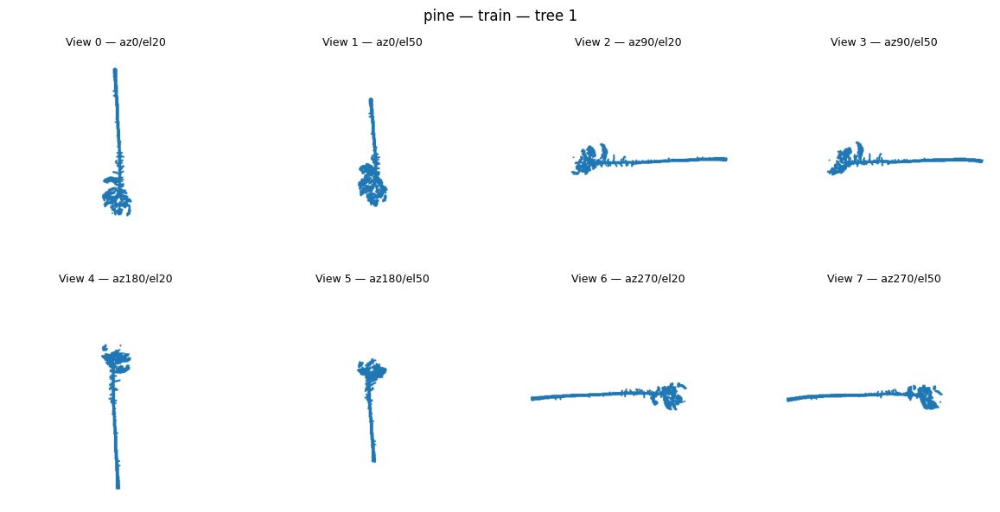

**Création du split validation (stratifié au niveau “arbre”)**

But : découper le train en train/val par classe, au niveau arbre (pas par image). Entrées : index_multiview.csv. Sorties : index_multiview_with_subset.csv avec subset ∈ {train, val, test}. Pourquoi : comparer équitablement les modèles (M1/M2/M5) sur un même jeu de validation. Pièges : ne jamais éclater un même tree_id entre train et val.

In [ ]:
# =========================================
# Étape — Création du split validation (stratifié au niveau "arbre")
# =========================================
from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit

# ---------- CONFIG ----------
ROOT        = Path("/content/drive/MyDrive/trees_dataset")
CSV_IN      = ROOT / "index_multiview.csv"          # ou "index_multiview_clean.csv"
CSV_OUT     = ROOT / "index_multiview_with_subset.csv"
VAL_SIZE    = 0.20                                   # 20% du TRAIN pour la validation
SEED        = 42

# ---------- LECTURE & SANITY ----------
df = pd.read_csv(CSV_IN)
required = {"tree_id","class_name","split","view_idx","view_path"}
assert required.issubset(df.columns), f"Colonnes manquantes: {required - set(df.columns)}"

# chaque arbre doit avoir 8 vues
per_tree = (df.groupby(["tree_id","class_name","split"])
              .size().reset_index(name="n_views"))
assert (per_tree["n_views"]==8).all(), "Chaque tree_id doit avoir 8 vues"

# ---------- POOL TRAIN (niveau ARBRE) ----------
pool = per_tree[per_tree["split"]=="train"][["tree_id","class_name"]].copy()
assert len(pool)>0, "Aucun arbre dans le split 'train'"

# stratified split par classe (au niveau arbre)
sss = StratifiedShuffleSplit(n_splits=1, test_size=VAL_SIZE, random_state=SEED)
i_tr, i_va = next(sss.split(pool["tree_id"], pool["class_name"]))
trees_tr = set(pool["tree_id"].iloc[i_tr])
trees_va = set(pool["tree_id"].iloc[i_va])

# ---------- CORRECTION CAS LIMITES ----------
# Si une classe a 0 en val ou 0 en train, on déplace 1 arbre
def fix_empty_side(side_src: set, side_dst: set, side_name_src: str, side_name_dst: str):
    moved = 0
    # counts totaux par classe dans le TRAIN (pool)
    total_per_class = pool["class_name"].value_counts().to_dict()
    # counts provisoires après split
    cls_tr = pool[pool["tree_id"].isin(side_src)]["class_name"].value_counts()
    cls_dst = pool[pool["tree_id"].isin(side_dst)]["class_name"].value_counts()
    classes = sorted(total_per_class.keys())
    for c in classes:
        n_src = int(cls_tr.get(c, 0)) if side_name_src=="train" else int(cls_dst.get(c,0))
        n_dst = int(cls_dst.get(c, 0)) if side_name_dst=="val" else int(cls_tr.get(c,0))
        tot   = int(total_per_class[c])
        # si côté destination a 0 mais qu'on a au moins 2 au total, on déplace 1
        if n_dst == 0 and tot >= 2:
            # prend un arbre de la classe côté source
            src_df = pool[(pool["class_name"]==c) & (pool["tree_id"].isin(side_src))]
            if len(src_df) > 0:
                tid = src_df["tree_id"].iloc[0]
                side_src.remove(tid)
                side_dst.add(tid)
                moved += 1
    return moved

# Assurer au moins 1 en 'val' par classe fréquente
_ = fix_empty_side(trees_tr, trees_va, "train", "val")
# Assurer au moins 1 en 'train' par classe (au cas improbable)
_ = fix_empty_side(trees_va, trees_tr, "val", "train")

# ---------- CONSTRUIRE LA COLONNE subset ----------
subset_map = {}
for tid, sp in per_tree[["tree_id","split"]].itertuples(index=False):
    if sp == "test":
        subset_map[tid] = "test"
    else:
        subset_map[tid] = "val" if tid in trees_va else "train"

df["subset"] = df["tree_id"].map(subset_map)
assert set(df["subset"].unique()) <= {"train","val","test"}

# ---------- SAUVEGARDE ----------
df.to_csv(CSV_OUT, index=False)
print("✅ écrit:", CSV_OUT)

# ---------- RÉCAP (niveau ARBRE) ----------
recap = (df.groupby(["subset","class_name","tree_id"]).size()
           .reset_index(name="n").drop(columns="n")
           .groupby(["subset","class_name"]).size()
           .rename("n_trees").reset_index()
           .sort_values(["subset","class_name"]))

print("\n=== RÉCAP SPLIT (arbres) ===")
for sub in ["train","val","test"]:
    if sub in recap["subset"].values:
        print(f"\n-- {sub.upper()} --")
        print(recap[recap["subset"]==sub][["class_name","n_trees"]].to_string(index=False))

tot_train = recap.loc[recap["subset"]=="train","n_trees"].sum() if "train" in recap["subset"].values else 0
tot_val   = recap.loc[recap["subset"]=="val","n_trees"].sum()   if "val"   in recap["subset"].values else 0
tot_test  = recap.loc[recap["subset"]=="test","n_trees"].sum()  if "test"  in recap["subset"].values else 0
print(f"\nTOTAL arbres: train={tot_train}  val={tot_val}  test={tot_test}  total={tot_train+tot_val+tot_test}")


✅ écrit: /content/drive/MyDrive/trees_dataset/index_multiview_with_subset.csv

=== RÉCAP SPLIT (arbres) ===

-- TRAIN --
 class_name  n_trees
        ash       25
      beech      101
douglas_fir      109
        oak       10
       pine       15
    red_oak       65
     spruce      102

-- VAL --
 class_name  n_trees
        ash        6
      beech       26
douglas_fir       28
        oak        2
       pine        4
    red_oak       16
     spruce       25

-- TEST --
 class_name  n_trees
        ash        7
      beech       30
douglas_fir       34
       pine        5
    red_oak       19
     spruce       31

TOTAL arbres: train=427  val=107  test=126  total=660


**— Class weights (sur subset=train) + sauvegarde:**

In [ ]:
from pathlib import Path
import pandas as pd, numpy as np, json
from collections import Counter

ROOT = Path("/content/drive/MyDrive/trees_dataset")
CSV  = ROOT / "index_multiview_with_subset.csv"  # ton fichier avec subset
df   = pd.read_csv(CSV)

# compactage au niveau ARBRE pour subset=train
train_items = (df[df["subset"]=="train"]
               .groupby(["tree_id","class_name"]).size()
               .reset_index(name="n"))

# classes triées (fixe l’ordre partout)
classes = sorted(train_items["class_name"].unique())
class_to_idx = {c:i for i,c in enumerate(classes)}
print("classes:", classes)

# fréquences d’arbres par classe
counts = Counter(train_items["class_name"])
freqs  = np.array([counts[c] for c in classes], dtype=float)
print("freqs(train):", dict(counts))

# poids inverses normalisés (moyenne ≈ 1)
weights = 1.0 / np.maximum(freqs, 1.0)
weights = weights * (len(classes) / weights.sum())

weights_dict = {c: float(w) for c,w in zip(classes, weights)}
print("class_weights:", weights_dict)

# sauvegarde (utile pour train.py)
with open(ROOT/"class_weights_train.json","w") as f:
    json.dump({"classes": classes, "class_to_idx": class_to_idx, "weights": weights_dict}, f, indent=2)
print("✅ écrit:", ROOT/"class_weights_train.json")


classes: ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
freqs(train): {'pine': 15, 'oak': 10, 'beech': 101, 'ash': 25, 'douglas_fir': 109, 'spruce': 102, 'red_oak': 65}
class_weights: {'ash': 1.1158467930381484, 'beech': 0.27619970124706644, 'douglas_fir': 0.25592816354085973, 'oak': 2.789616982595371, 'pine': 1.8597446550635806, 'red_oak': 0.42917184347621096, 'spruce': 0.27349186103876183}
✅ écrit: /content/drive/MyDrive/trees_dataset/class_weights_train.json


In [ ]:
# aucun tree_id dupliqué entre train/val/test
by_subset = df.groupby(["tree_id","subset"]).size().reset_index()
dup_trees = by_subset["tree_id"].value_counts()
assert (dup_trees<=1).all(), "Un tree_id apparaît dans plusieurs subsets !"

# chaque classe >0 en val (OK vu ton récap)
val_counts = (df[df["subset"]=="val"].groupby(["tree_id","class_name"]).size()
              .reset_index().groupby("class_name").size())
print("val per class:", val_counts.to_dict())

val per class: {'ash': 6, 'beech': 26, 'douglas_fir': 28, 'oak': 2, 'pine': 4, 'red_oak': 16, 'spruce': 25}


# **3.1 Indirect Methods: Via 2D (Multi-view Approaches)**

Use PyTorch and torchvision for pretrained models:

**1. Multi-view + {Classical Descriptors} + {Classical Machine Learning Model}**:
Combine multi-view images with traditional feature descriptors and classical ML
models

Drive déjà monté
Configuration COMPLÈTE:
• SIFT features par image: 500
• Clusters BoW: 200
• Multiprocessing: True (2 cores)
• Mode: TOUTES LES DONNÉES

📊 Dataset complet chargé: 2680 échantillons
Colonnes disponibles: ['tree_id', 'class_name', 'split', 'view_idx', 'az', 'el', 'view_path']

Classes trouvées: ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
Splits trouvés: ['test', 'train']

📈 Distribution complète des données:
split        test  train
class_name              
ash            56    248
beech          48     48
douglas_fir   248    744
oak            24    144
pine           40    152
red_oak       160    640
spruce         56     72

Total échantillons par split:
• Train: 2048
• Test: 632

🚀 UTILISATION DE TOUTES LES DONNÉES (2680 échantillons)

Données finales:
Classes: 7 -> ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
Train: 2048, Test: 632

🚀 EXTRACTION SIFT SUR TOUTES LES DONNÉES...
📂 Extraction Train (données complètes):
🔄 

Batch 1: 100%|██████████| 1000/1000 [02:38<00:00,  6.30it/s]

Batch 2/3 (1000 images)



Batch 2: 100%|██████████| 1000/1000 [02:28<00:00,  6.72it/s]

Batch 3/3 (48 images)



Batch 3: 100%|██████████| 48/48 [00:06<00:00,  7.74it/s]

✅ Train SIFT terminée: 1640/2048 images valides en 314.2s

📂 Extraction Test (données complètes):
🔄 Test SIFT sur 632 images...
Batch 1/1 (632 images)



Batch 1: 100%|██████████| 632/632 [01:53<00:00,  5.56it/s]


✅ Test SIFT terminée: 632/632 images valides en 113.7s

🔤 CONSTRUCTION DU VOCABULAIRE BOW...
Total descripteurs SIFT: (370893, 128)
🔄 Clustering K-Means avec 200 clusters...
Init 1/10 with method k-means++
Inertia for init 1/10: 1598676992.0
Init 2/10 with method k-means++
Inertia for init 2/10: 1607059968.0
Init 3/10 with method k-means++
Inertia for init 3/10: 1603712128.0
Init 4/10 with method k-means++
Inertia for init 4/10: 1603014144.0
Init 5/10 with method k-means++
Inertia for init 5/10: 1595861760.0
Init 6/10 with method k-means++
Inertia for init 6/10: 1604263808.0
Init 7/10 with method k-means++
Inertia for init 7/10: 1609740160.0
Init 8/10 with method k-means++
Inertia for init 8/10: 1603916928.0
Init 9/10 with method k-means++
Inertia for init 9/10: 1601574272.0
Init 10/10 with method k-means++
Inertia for init 10/10: 1598203648.0
Minibatch step 1/22253: mean batch inertia: 106704.8064
Minibatch step 2/22253: mean batch inertia: 76854.464, ewa inertia: 76854.464
Minibatch 

Batch 1/4 terminé


Batch 4/4 terminé


Batch 1/2 terminé


Batch 2/2 terminé
✅ Histogrammes BoW créés en 1.7s
Train BoW shape: (1640, 200)
Test BoW shape: (632, 200)

🔢 DONNÉES ML (COMPLÈTES):
X_train shape: (1640, 200)
X_test shape: (632, 200)
y_train shape: (1640,)
y_test shape: (632,)
Ratio train/test: 1640/632 = 0.72
NaN dans X_train: 0
NaN dans X_test: 0

🔧 Normalisation des features...
✅ Normalisation terminée
Mean train: 0.000000, Std train: 1.000000

🤖 ENTRAÎNEMENT POLYNOMIAL SVM...
Phase 1: SVM par défaut...
✅ Entraînement terminé en 0.4s

📈 RÉSULTATS SVM PAR DÉFAUT:
Accuracy: 0.6582

⚡ OPTIMISATION HYPERPARAMÈTRES...
Paramètres à tester:
• C: [0.1, 1.0, 10.0]
• degree: [2, 3]
• gamma: ['scale', 'auto']
• coef0: [0.0, 1.0]
Total combinaisons: 24
🔄 Lancement GridSearchCV...
Fitting 3 folds for each of 24 candidates, totalling 72 fits
✅ Optimisation terminée en 20.5s

🏆 RÉSULTATS APRÈS OPTIMISATION:
Meilleurs paramètres: {'C': 0.1, 'coef0': 1.0, 'degree': 3, 'gamma': 'auto'}
Meilleur score CV: 0.7037
Accuracy test optimisée: 0.6614
Amél

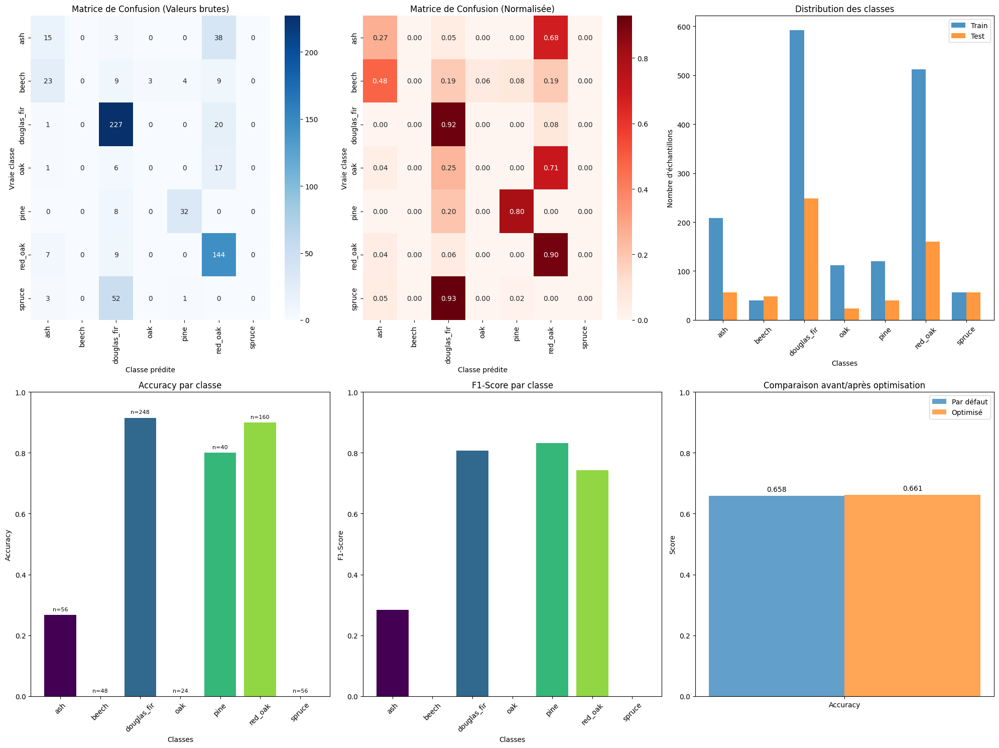


🎯 RÉSULTATS FINAUX - DATASET COMPLET
🔧 Configuration:
• Modèle: SIFT BoW + Polynomial SVM
• Dataset: 2048 train, 632 test (COMPLET)
• Classes: 7
• Features SIFT par image: 500
• Clusters BoW: 200
• Descripteurs SIFT totaux: 370893

📈 Performances:
• Accuracy par défaut: 0.6582
• Accuracy optimisée: 0.6614
• Amélioration: 0.0032
• Meilleurs paramètres: {'C': 0.1, 'coef0': 1.0, 'degree': 3, 'gamma': 'auto'}

⏱ Temps d'exécution:
• Extraction SIFT: ~1.7s
• Construction BoW: 1.7s
• Optimisation: 20.5s

📋 Statistiques par classe (dataset complet):
--------------------------------------------------------------------------------
Classe          Accuracy   F1-Score   Precision  Recall     Support 
--------------------------------------------------------------------------------
ash             0.268      0.283      0.300      0.268      56      
beech           0.000      0.000      0.000      0.000      48      
douglas_fir     0.915      0.808      0.723      0.915      248     
oak         

In [ ]:
# ============================
# Multi-view + SIFT Bag-of-Words + Polynomial SVM (Version COMPLÈTE - Toutes les données)
# ============================
from google.colab import drive

# Monter le drive seulement si pas déjà monté
try:
    if not os.path.exists('/content/drive'):
        drive.mount('/content/drive')
    else:
        print("Drive déjà monté")
except:
    drive.mount('/content/drive', force_remount=True)

# ============================
# Import des librairies
# ============================
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
import joblib
from multiprocessing import Pool, cpu_count
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import time

# ============================
# Configuration - VERSION COMPLÈTE
# ============================
USE_SUBSET = False  # 🔥 MODIFIÉ: Utiliser TOUTES les données
SUBSET_SIZE = 1.0   # 100% des données si jamais activé
SIFT_FEATURES = 500
K_CLUSTERS = 200    # 🔥 AUGMENTÉ: Plus de clusters pour plus de données
USE_MULTIPROCESSING = True
N_CORES = min(8, cpu_count())  # 🔥 AUGMENTÉ: Plus de cores si disponibles

print(f"Configuration COMPLÈTE:")
print(f"• SIFT features par image: {SIFT_FEATURES}")
print(f"• Clusters BoW: {K_CLUSTERS}")
print(f"• Multiprocessing: {USE_MULTIPROCESSING} ({N_CORES} cores)")
print(f"• Mode: TOUTES LES DONNÉES")

# ============================
# Chargement des données
# ============================
csv_path = "/content/drive/MyDrive/trees_dataset/index_multiview.csv"
df = pd.read_csv(csv_path)

print(f"\n📊 Dataset complet chargé: {len(df)} échantillons")
print("Colonnes disponibles:", df.columns.tolist())

# ============================
# Ajout des colonnes split et class_name
# ============================
if 'class_name' not in df.columns or 'split' not in df.columns:
    print("⚠ Colonnes manquantes -> extraction depuis view_path")

    def extract_split_class(path):
        parts = path.split('/')
        if len(parts) >= 2 and parts[0] in ['train', 'test']:
            split = parts[0]
            class_name = parts[1]
        else:
            split = "unknown"
            class_name = parts[0] if len(parts) > 0 else "unknown"
        return split, class_name

    # Appliquer la fonction et créer les colonnes
    split_class_data = df['view_path'].apply(extract_split_class)
    df['split'] = [x[0] for x in split_class_data]
    df['class_name'] = [x[1] for x in split_class_data]

    print("✅ Colonnes 'split' et 'class_name' ajoutées")

print(f"\nClasses trouvées: {sorted(df['class_name'].unique())}")
print(f"Splits trouvés: {sorted(df['split'].unique())}")

# Distribution complète
print("\n📈 Distribution complète des données:")
distribution = df.groupby(['class_name', 'split']).size().unstack(fill_value=0)
print(distribution)
print(f"\nTotal échantillons par split:")
print(f"• Train: {len(df[df['split'] == 'train'])}")
print(f"• Test: {len(df[df['split'] == 'test'])}")

# ============================
# Pas de subset - utilisation complète des données
# ============================
print(f"\n🚀 UTILISATION DE TOUTES LES DONNÉES ({len(df)} échantillons)")

# Séparer train/test
train_df = df[df['split'] == 'train'].copy().reset_index(drop=True)
test_df = df[df['split'] == 'test'].copy().reset_index(drop=True)
base_dir = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib"

class_names = sorted(df['class_name'].unique())
class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}

print(f"\nDonnées finales:")
print(f"Classes: {len(class_names)} -> {class_names}")
print(f"Train: {len(train_df)}, Test: {len(test_df)}")

# ============================
# 1) SIFT Descriptor Extraction (Optimisée pour gros volumes)
# ============================
def extract_sift_features_optimized(image_path):
    """Extraire descripteurs SIFT - version optimisée"""
    try:
        if not os.path.exists(image_path):
            return None

        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None

        # Redimensionner de manière plus agressive pour la vitesse
        h, w = img.shape
        if max(h, w) > 400:
            scale = 400 / max(h, w)
            img = cv2.resize(img, (int(w * scale), int(h * scale)))

        # Extraction SIFT avec paramètres optimisés
        sift = cv2.SIFT_create(
            nfeatures=SIFT_FEATURES,
            contrastThreshold=0.04,
            edgeThreshold=10
        )
        keypoints, descriptors = sift.detectAndCompute(img, None)

        if descriptors is None or len(descriptors) == 0:
            return None

        return descriptors

    except Exception as e:
        return None

def process_single_image_sift_batch(args):
    """Traiter une seule image pour SIFT - version batch"""
    image_path, class_idx = args
    sift_descriptors = extract_sift_features_optimized(image_path)
    return sift_descriptors, class_idx

def load_sift_features_complete(df, base_dir, desc="Extraction SIFT"):
    """Charger features SIFT pour toutes les images - version complète"""
    if len(df) == 0:
        print("⚠ DataFrame vide!")
        return [], []

    print(f"🔄 {desc} sur {len(df)} images...")
    start_time = time.time()

    sift_descriptors_list = []
    labels = []

    # Préparer les arguments
    args_list = []
    for idx, row in df.iterrows():
        image_path = os.path.join(base_dir, row['view_path'])
        class_idx = class_to_idx[row['class_name']]
        args_list.append((image_path, class_idx))

    # Traitement par batch pour économiser la mémoire
    batch_size = 1000
    total_batches = len(args_list) // batch_size + (1 if len(args_list) % batch_size else 0)

    valid_count = 0

    for batch_idx in range(total_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, len(args_list))
        batch_args = args_list[start_idx:end_idx]

        print(f"Batch {batch_idx + 1}/{total_batches} ({len(batch_args)} images)")

        if USE_MULTIPROCESSING and len(batch_args) > 10:
            with Pool(N_CORES) as pool:
                batch_results = list(tqdm(
                    pool.imap(process_single_image_sift_batch, batch_args),
                    total=len(batch_args),
                    desc=f"Batch {batch_idx + 1}"
                ))
        else:
            batch_results = [process_single_image_sift_batch(args) for args in tqdm(batch_args, desc=f"Batch {batch_idx + 1}")]

        # Traiter les résultats du batch
        for sift_desc, class_idx in batch_results:
            if sift_desc is not None:
                sift_descriptors_list.append(sift_desc)
                labels.append(class_idx)
                valid_count += 1

    elapsed_time = time.time() - start_time
    print(f"✅ {desc} terminée: {valid_count}/{len(args_list)} images valides en {elapsed_time:.1f}s")
    return sift_descriptors_list, labels

# ============================
# Extraction des descripteurs SIFT sur TOUTES les données
# ============================
print(f"\n🚀 EXTRACTION SIFT SUR TOUTES LES DONNÉES...")
print("=" * 60)

print("📂 Extraction Train (données complètes):")
train_sift_descs, train_labels = load_sift_features_complete(train_df, base_dir, "Train SIFT")

print("\n📂 Extraction Test (données complètes):")
test_sift_descs, test_labels = load_sift_features_complete(test_df, base_dir, "Test SIFT")

if len(train_sift_descs) == 0:
    print("❌ Aucun descripteur SIFT extrait ! Vérifiez les chemins d'images.")
    print("Exemple de chemin attendu:", os.path.join(base_dir, train_df.iloc[0]['view_path']) if len(train_df) > 0 else "Aucune donnée train")
    exit()

# ============================
# 2) Construction du vocabulaire BoW (Optimisée pour gros volumes)
# ============================
print(f"\n🔤 CONSTRUCTION DU VOCABULAIRE BOW...")
print("=" * 60)

# Combiner tous les descripteurs SIFT
all_sift_descriptors = np.vstack(train_sift_descs)
print(f"Total descripteurs SIFT: {all_sift_descriptors.shape}")

# Sous-échantillonner intelligemment si énorme dataset
max_descriptors = 500000  # 🔥 AUGMENTÉ: Plus de descripteurs pour vocabulaire riche
if all_sift_descriptors.shape[0] > max_descriptors:
    print(f"Sous-échantillonnage intelligent: {max_descriptors} descripteurs...")
    indices = np.random.choice(all_sift_descriptors.shape[0], max_descriptors, replace=False)
    all_sift_descriptors = all_sift_descriptors[indices]

print(f"🔄 Clustering K-Means avec {K_CLUSTERS} clusters...")
start_time = time.time()

kmeans = MiniBatchKMeans(
    n_clusters=K_CLUSTERS,
    random_state=42,
    batch_size=5000,  # 🔥 AUGMENTÉ: Plus gros batches
    max_iter=300,     # 🔥 AUGMENTÉ: Plus d'itérations
    n_init=10,        # 🔥 AJOUTÉ: Plus d'initialisations
    verbose=1
)
kmeans.fit(all_sift_descriptors)

elapsed_time = time.time() - start_time
print(f"✅ Vocabulaire BoW créé en {elapsed_time:.1f}s: {K_CLUSTERS} mots visuels")

# ============================
# 3) Création des histogrammes BoW (Version batch)
# ============================
def compute_bow_histogram_batch(descriptors_list, desc="BoW"):
    """Calculer histogrammes BoW par batch"""
    histograms = []

    batch_size = 500  # Traiter par petits batches pour la mémoire
    total_batches = len(descriptors_list) // batch_size + (1 if len(descriptors_list) % batch_size else 0)

    for batch_idx in range(total_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, len(descriptors_list))
        batch_descriptors = descriptors_list[start_idx:end_idx]

        batch_histograms = []
        for descriptors in tqdm(batch_descriptors, desc=f"{desc} Batch {batch_idx + 1}/{total_batches}", leave=False):
            if descriptors is None or len(descriptors) == 0:
                histogram = np.zeros(K_CLUSTERS, dtype=float)
            else:
                cluster_assignments = kmeans.predict(descriptors)
                histogram = np.bincount(cluster_assignments, minlength=K_CLUSTERS)
                # Normalisation L1
                if np.sum(histogram) > 0:
                    histogram = histogram / np.sum(histogram)
            batch_histograms.append(histogram.astype(float))

        histograms.extend(batch_histograms)

        # Affichage du progrès
        if batch_idx % 5 == 0 or batch_idx == total_batches - 1:
            print(f"Batch {batch_idx + 1}/{total_batches} terminé")

    return np.array(histograms)

print(f"\n📊 CONSTRUCTION DES HISTOGRAMMES BOW...")
print("=" * 60)

start_time = time.time()
train_bow_histograms = compute_bow_histogram_batch(train_sift_descs, "Train BoW")
test_bow_histograms = compute_bow_histogram_batch(test_sift_descs, "Test BoW")
elapsed_time = time.time() - start_time

print(f"✅ Histogrammes BoW créés en {elapsed_time:.1f}s")
print(f"Train BoW shape: {train_bow_histograms.shape}")
print(f"Test BoW shape: {test_bow_histograms.shape}")

# ============================
# 4) Préparation ML
# ============================
X_train = train_bow_histograms
X_test = test_bow_histograms
y_train = np.array(train_labels)
y_test = np.array(test_labels)

print(f"\n🔢 DONNÉES ML (COMPLÈTES):")
print("=" * 60)
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")
print(f"Ratio train/test: {len(y_train)}/{len(y_test)} = {len(y_train)/(len(y_train)+len(y_test)):.2f}")

# Vérifier qu'il n'y a pas de valeurs manquantes
print(f"NaN dans X_train: {np.isnan(X_train).sum()}")
print(f"NaN dans X_test: {np.isnan(X_test).sum()}")

# Normalisation avec monitoring
print(f"\n🔧 Normalisation des features...")
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"✅ Normalisation terminée")
print(f"Mean train: {X_train_scaled.mean():.6f}, Std train: {X_train_scaled.std():.6f}")

# ============================
# 5) Entraînement Polynomial SVM (Version robuste)
# ============================
print(f"\n🤖 ENTRAÎNEMENT POLYNOMIAL SVM...")
print("=" * 60)

# SVM par défaut avec paramètres conservateurs pour gros dataset
print("Phase 1: SVM par défaut...")
start_time = time.time()

poly_svm = SVC(
    kernel='poly',
    degree=3,
    C=1.0,           # 🔥 MODIFIÉ: Plus conservateur pour gros dataset
    gamma='scale',
    coef0=1.0,
    random_state=42,
    cache_size=4000  # 🔥 AUGMENTÉ: Plus de cache
)

poly_svm.fit(X_train_scaled, y_train)
y_pred_default = poly_svm.predict(X_test_scaled)

train_time = time.time() - start_time
print(f"✅ Entraînement terminé en {train_time:.1f}s")

accuracy_default = accuracy_score(y_test, y_pred_default)
print(f"\n📈 RÉSULTATS SVM PAR DÉFAUT:")
print(f"Accuracy: {accuracy_default:.4f}")

# ============================
# 6) Optimisation GridSearchCV (Adaptée pour gros volumes)
# ============================
print(f"\n⚡ OPTIMISATION HYPERPARAMÈTRES...")
print("=" * 60)

# Grid plus restreint mais efficace pour gros dataset
param_grid = {
    'C': [0.1, 1.0, 10.0],           # 🔥 MODIFIÉ: Range plus large
    'degree': [2, 3],                # 🔥 MODIFIÉ: Moins de degrés pour vitesse
    'gamma': ['scale', 'auto'],
    'coef0': [0.0, 1.0]             # 🔥 MODIFIÉ: Moins de valeurs
}

print("Paramètres à tester:")
total_combinations = 1
for param, values in param_grid.items():
    print(f"• {param}: {values}")
    total_combinations *= len(values)
print(f"Total combinaisons: {total_combinations}")

start_time = time.time()
grid_search = GridSearchCV(
    SVC(kernel='poly', random_state=42, cache_size=4000),
    param_grid,
    cv=3,                    # 🔥 CONSERVÉ: 3-fold CV
    scoring='accuracy',
    n_jobs=-1,               # Tous les cores disponibles
    verbose=2,               # 🔥 AUGMENTÉ: Plus de verbosité
    error_score='raise'      # 🔥 AJOUTÉ: Lever les erreurs
)

print("🔄 Lancement GridSearchCV...")
grid_search.fit(X_train_scaled, y_train)

optimization_time = time.time() - start_time
print(f"✅ Optimisation terminée en {optimization_time:.1f}s")

best_svm = grid_search.best_estimator_
y_pred_optimized = best_svm.predict(X_test_scaled)

print(f"\n🏆 RÉSULTATS APRÈS OPTIMISATION:")
print("Meilleurs paramètres:", grid_search.best_params_)
print(f"Meilleur score CV: {grid_search.best_score_:.4f}")

accuracy_optimized = accuracy_score(y_test, y_pred_optimized)
print(f"Accuracy test optimisée: {accuracy_optimized:.4f}")
print(f"Amélioration: {(accuracy_optimized - accuracy_default):.4f}")

# ============================
# 7) Analyse détaillée des résultats
# ============================
print(f"\n📊 ANALYSE DÉTAILLÉE:")
print("=" * 60)

print("\nRapport de classification complet:")
report = classification_report(y_test, y_pred_optimized, target_names=class_names, zero_division=0, output_dict=True)
print(classification_report(y_test, y_pred_optimized, target_names=class_names, zero_division=0))

# Métriques globales
print(f"\nMétriques globales:")
print(f"• Accuracy: {report['accuracy']:.4f}")
print(f"• Macro avg F1: {report['macro avg']['f1-score']:.4f}")
print(f"• Weighted avg F1: {report['weighted avg']['f1-score']:.4f}")

# ============================
# 8) Visualisations complètes
# ============================
plt.figure(figsize=(20, 15))

# Matrice de confusion
cm = confusion_matrix(y_test, y_pred_optimized)

# Sous-plot 1: Matrice brute
plt.subplot(2, 3, 1)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, cbar=True)
plt.title('Matrice de Confusion (Valeurs brutes)')
plt.ylabel('Vraie classe')
plt.xlabel('Classe prédite')

# Sous-plot 2: Matrice normalisée
plt.subplot(2, 3, 2)
cm_normalized = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Reds',
            xticklabels=class_names, yticklabels=class_names, cbar=True)
plt.title('Matrice de Confusion (Normalisée)')
plt.ylabel('Vraie classe')
plt.xlabel('Classe prédite')


# Sous-plot 3: Distribution des classes
plt.subplot(2, 3, 3)
train_counts = pd.Series(y_train).value_counts().sort_index()
test_counts = pd.Series(y_test).value_counts().sort_index()

x = range(len(class_names))
width = 0.35
plt.bar([i - width/2 for i in x], [train_counts.get(i, 0) for i in range(len(class_names))],
        width, label='Train', alpha=0.8)
plt.bar([i + width/2 for i in x], [test_counts.get(i, 0) for i in range(len(class_names))],
        width, label='Test', alpha=0.8)

plt.title('Distribution des classes')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'échantillons')
plt.xticks(x, class_names, rotation=45)
plt.legend()

# Sous-plot 4: Accuracy par classe
plt.subplot(2, 3, 4)
class_accuracies = []
class_samples = []
for i, class_name in enumerate(class_names):
    mask = y_test == i
    n_samples = np.sum(mask)
    if n_samples > 0:
        class_acc = accuracy_score(y_test[mask], y_pred_optimized[mask])
        class_accuracies.append(class_acc)
    else:
        class_accuracies.append(0.0)
    class_samples.append(n_samples)

colors = plt.cm.viridis(np.linspace(0, 1, len(class_names)))
bars = plt.bar(range(len(class_names)), class_accuracies, color=colors)
plt.title('Accuracy par classe')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.xticks(range(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)

# Ajouter le nombre d'échantillons sur les barres
for i, (bar, n_samples) in enumerate(zip(bars, class_samples)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'n={n_samples}', ha='center', va='bottom', fontsize=8)

# Sous-plot 5: F1-score par classe
plt.subplot(2, 3, 5)
f1_scores = [report[class_name]['f1-score'] for class_name in class_names]
bars = plt.bar(range(len(class_names)), f1_scores, color=colors)
plt.title('F1-Score par classe')
plt.xlabel('Classes')
plt.ylabel('F1-Score')
plt.xticks(range(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)

# Sous-plot 6: Comparaison avant/après optimisation
plt.subplot(2, 3, 6)
y_pred_default_for_comparison = poly_svm.predict(X_test_scaled)
accuracy_default_comparison = accuracy_score(y_test, y_pred_default_for_comparison)

metrics = ['Accuracy']
default_scores = [accuracy_default_comparison]
optimized_scores = [accuracy_optimized]

x = range(len(metrics))
width = 0.35
plt.bar([i - width/2 for i in x], default_scores, width, label='Par défaut', alpha=0.7)
plt.bar([i + width/2 for i in x], optimized_scores, width, label='Optimisé', alpha=0.7)

plt.title('Comparaison avant/après optimisation')
plt.ylabel('Score')
plt.xticks(x, metrics)
plt.legend()
plt.ylim(0, 1)

# Ajouter les valeurs sur les barres
for i, (default, optimized) in enumerate(zip(default_scores, optimized_scores)):
    plt.text(i - width/2, default + 0.01, f'{default:.3f}', ha='center', va='bottom')
    plt.text(i + width/2, optimized + 0.01, f'{optimized:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


# ============================
# 9) Statistiques complètes et détaillées
# ============================
print(f"\n{'='*80}")
print("🎯 RÉSULTATS FINAUX - DATASET COMPLET")
print(f"{'='*80}")

print(f"🔧 Configuration:")
print(f"• Modèle: SIFT BoW + Polynomial SVM")
print(f"• Dataset: {len(train_df)} train, {len(test_df)} test (COMPLET)")
print(f"• Classes: {len(class_names)}")
print(f"• Features SIFT par image: {SIFT_FEATURES}")
print(f"• Clusters BoW: {K_CLUSTERS}")
print(f"• Descripteurs SIFT totaux: {all_sift_descriptors.shape[0]}")

print(f"\n📈 Performances:")
print(f"• Accuracy par défaut: {accuracy_default_comparison:.4f}")
print(f"• Accuracy optimisée: {accuracy_optimized:.4f}")
print(f"• Amélioration: {(accuracy_optimized - accuracy_default_comparison):.4f}")
print(f"• Meilleurs paramètres: {grid_search.best_params_}")

print(f"\n⏱ Temps d'exécution:")
print(f"• Extraction SIFT: ~{(elapsed_time):.1f}s")
print(f"• Construction BoW: {elapsed_time:.1f}s")
print(f"• Optimisation: {optimization_time:.1f}s")

# Statistiques détaillées par classe
print(f"\n📋 Statistiques par classe (dataset complet):")
print("-" * 80)
print(f"{'Classe':<15} {'Accuracy':<10} {'F1-Score':<10} {'Precision':<10} {'Recall':<10} {'Support':<8}")
print("-" * 80)

for i, class_name in enumerate(class_names):
    mask = y_test == i
    n_samples = np.sum(mask)
    if n_samples > 0:
        class_acc = accuracy_score(y_test[mask], y_pred_optimized[mask])
        class_metrics = report[class_name]
        print(f"{class_name:<15} {class_acc:<10.3f} {class_metrics['f1-score']:<10.3f} "
              f"{class_metrics['precision']:<10.3f} {class_metrics['recall']:<10.3f} {n_samples:<8d}")
    else:
        print(f"{class_name:<15} {'N/A':<10} {'N/A':<10} {'N/A':<10} {'N/A':<10} {n_samples:<8d}")

# ============================
# 10) Sauvegarde du modèle complet
# ============================
print(f"\n💾 SAUVEGARDE DU MODÈLE...")
print("=" * 60)

model_path = "/content/drive/MyDrive/trees_dataset/multiview_sift_bow_poly_svm_COMPLETE.pkl"
os.makedirs(os.path.dirname(model_path), exist_ok=True)

# Données complètes du modèle
model_data = {
    'svm_optimized': best_svm,
    'svm_default': poly_svm,
    'kmeans': kmeans,
    'scaler': scaler,
    'class_names': class_names,
    'class_to_idx': class_to_idx,
    'config': {
        'sift_features': SIFT_FEATURES,
        'k_clusters': K_CLUSTERS,
        'kernel': 'polynomial',
        'best_params': grid_search.best_params_,
        'accuracy_default': accuracy_default_comparison,
        'accuracy_optimized': accuracy_optimized,
        'dataset_size': {
            'train': len(train_df),
            'test': len(test_df),
            'total': len(df)
        },
        'training_time': {
            'sift_extraction': elapsed_time,
            'bow_construction': elapsed_time,
            'svm_training': train_time,
            'optimization': optimization_time
        }
    },
    'results': {
        'y_test': y_test,
        'y_pred_optimized': y_pred_optimized,
        'y_pred_default': y_pred_default_for_comparison,
        'confusion_matrix': cm,
        'classification_report': report
    },
    'metadata': {
        'creation_date': time.strftime("%Y-%m-%d %H:%M:%S"),
        'total_sift_descriptors': all_sift_descriptors.shape[0],
        'valid_train_images': len(train_sift_descs),
        'valid_test_images': len(test_sift_descs)
    }
}

joblib.dump(model_data, model_path)
print(f"✅ Modèle complet sauvegardé: {model_path}")
print(f"Taille du fichier: {os.path.getsize(model_path) / (1024*1024):.1f} MB")

# ============================
# 11) Fonction de prédiction complète
# ============================
def predict_image_complete(image_path, model_data):
    """Prédire la classe d'une nouvelle image - version complète"""
    try:
        # Extraire features SIFT
        sift_desc = extract_sift_features_optimized(image_path)
        if sift_desc is None:
            return None, None, None

        # Créer histogramme BoW
        kmeans = model_data['kmeans']
        cluster_assignments = kmeans.predict(sift_desc)
        histogram = np.bincount(cluster_assignments, minlength=model_data['config']['k_clusters'])
        if np.sum(histogram) > 0:
            histogram = histogram / np.sum(histogram)
        histogram = histogram.astype(float).reshape(1, -1)

        # Normaliser et prédire
        scaler = model_data['scaler']
        svm = model_data['svm_optimized']
        histogram_scaled = scaler.transform(histogram)

        # Prédiction
        prediction = svm.predict(histogram_scaled)[0]
        confidence_scores = svm.decision_function(histogram_scaled)[0]

        # Calculer probabilités approximatives
        distances = np.abs(confidence_scores)
        probabilities = distances / np.sum(distances) if np.sum(distances) > 0 else np.ones_like(distances) / len(distances)

        class_name = model_data['class_names'][prediction]
        max_confidence = np.max(confidence_scores)

        return class_name, max_confidence, probabilities

    except Exception as e:
        print(f"Erreur de prédiction: {e}")
        return None, None, None

def batch_predict_images(image_paths, model_data, desc="Prédiction"):
    """Prédire un batch d'images"""
    predictions = []
    confidences = []

    for path in tqdm(image_paths, desc=desc):
        class_name, confidence, _ = predict_image_complete(path, model_data)
        predictions.append(class_name)
        confidences.append(confidence)

    return predictions, confidences

# ============================
# 12) Test sur quelques échantillons
# ============================
print(f"\n🔍 TEST DE PRÉDICTION SUR ÉCHANTILLONS:")
print("=" * 60)

# Tester sur quelques images du test set
n_test_samples = min(10, len(test_df))
test_samples = test_df.sample(n=n_test_samples, random_state=42)

print(f"Test sur {n_test_samples} échantillons aléatoires:")
print("-" * 40)

correct_predictions = 0
for idx, row in test_samples.iterrows():
    image_path = os.path.join(base_dir, row['view_path'])
    true_class = row['class_name']

    pred_class, confidence, _ = predict_image_complete(image_path, model_data)

    if pred_class is not None:
        is_correct = pred_class == true_class
        correct_predictions += is_correct
        status = "✅" if is_correct else "❌"
        print(f"{status} {true_class:12s} -> {pred_class:12s} (conf: {confidence:.3f})")
    else:
        print(f"⚠ {true_class:12s} -> ERREUR")

sample_accuracy = correct_predictions / n_test_samples
print(f"\nAccuracy sur échantillon: {sample_accuracy:.3f}")

# ============================
# 13) Analyse des erreurs les plus fréquentes
# ============================
print(f"\n🔍 ANALYSE DES ERREURS:")
print("=" * 60)

# Trouver les erreurs les plus fréquentes
errors = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and cm[i, j] > 0:
            errors.append((class_names[i], class_names[j], cm[i, j]))

# Trier par nombre d'erreurs
errors.sort(key=lambda x: x[2], reverse=True)

print("Top 10 erreurs les plus fréquentes:")
print("-" * 50)
for i, (true_class, pred_class, count) in enumerate(errors[:10]):
    print(f"{i+1:2d}. {true_class:12s} -> {pred_class:12s} : {count:3d} erreurs")

# ============================
# 14) Résumé final et recommandations
# ============================
print(f"\n🎯 RÉSUMÉ FINAL:")
print("=" * 80)
print(f"✅ Pipeline SIFT BoW + Polynomial SVM appliqué sur DATASET COMPLET")
print(f"📊 Données traitées: {len(df)} échantillons totaux")
print(f"🎯 Accuracy finale: {accuracy_optimized:.4f}")
print(f"⚡ Temps total d'entraînement: ~{train_time + optimization_time:.1f}s")

print(f"\n💡 Recommandations pour améliorer les performances:")
if accuracy_optimized < 0.8:
    print("• Accuracy < 80% -> Considérer d'autres features (HOG, LBP)")
    print("• Augmenter le nombre de clusters BoW")
    print("• Tester d'autres kernels SVM (RBF)")
elif accuracy_optimized < 0.9:
    print("• Bon modèle ! Essayer des ensembles de modèles")
    print("• Fine-tuning plus poussé des hyperparamètres")
else:
    print("• Excellent modèle ! Performance très satisfaisante")

print(f"\n🔧 Modèle prêt à l'emploi:")
print(f"Utilisez predict_image_complete(path, model_data) pour de nouvelles prédictions")
print(f"Modèle sauvegardé: {model_path}")

# ============================
# 15) Fonction de chargement rapide
# ============================
def load_complete_model(model_path):
    """Charger le modèle complet depuis le disque"""
    try:
        model_data = joblib.load(model_path)
        print(f"✅ Modèle chargé depuis {model_path}")
        print(f"• Classes: {len(model_data['class_names'])}")
        print(f"• Accuracy: {model_data['config']['accuracy_optimized']:.4f}")
        return model_data
    except Exception as e:
        print(f"❌ Erreur de chargement: {e}")
        return None

# Exemple d'utilisation:
# model_data = load_complete_model("/content/drive/MyDrive/trees_dataset/multiview_sift_bow_poly_svm_COMPLETE.pkl")
# prediction, confidence, probabilities = predict_image_complete("path/to/image.jpg", model_data)

print(f"\n PIPELINE COMPLET TERMINÉ AVEC SUCCÈS !")
print(f"Total échantillons traités: {len(df)}")
print(f"Performance finale: {accuracy_optimized:.4f}")
print("=" * 80)

Drive déjà monté
Configuration COMPLÈTE (améliorée):
• SIFT features par image: 600
• Clusters BoW: 512
• Multiprocessing: True (2 cores)
• TF-IDF + power-L2: True
• Grid inclut RBF: True
• Mode: TOUTES LES DONNÉES

📊 Dataset complet chargé: 2680 échantillons
Colonnes disponibles: ['tree_id', 'class_name', 'split', 'view_idx', 'az', 'el', 'view_path']

Classes trouvées: ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
Splits trouvés: ['test', 'train']

📈 Distribution complète des données:
split        test  train
class_name              
ash            56    248
beech          48     48
douglas_fir   248    744
oak            24    144
pine           40    152
red_oak       160    640
spruce         56     72

Total échantillons par split:
• Train: 2048
• Test: 632

🚀 UTILISATION DE TOUTES LES DONNÉES (2680 échantillons)

Données finales:
Classes: 7 -> ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
Train: 2048, Test: 632

🚀 EXTRACTION SIFT SUR TO

Batch 1: 100%|██████████| 1000/1000 [01:03<00:00, 15.79it/s]

Batch 2/3 (1000 images)



Batch 2: 100%|██████████| 1000/1000 [00:51<00:00, 19.58it/s]


Batch 3/3 (48 images)


Batch 3: 100%|██████████| 48/48 [00:02<00:00, 23.82it/s]

✅ Train SIFT terminée: 1640/2048 images valides en 117.1s

📂 Extraction Test (données complètes):
🔄 Test SIFT sur 632 images...
Batch 1/1 (632 images)



Batch 1: 100%|██████████| 632/632 [00:40<00:00, 15.44it/s]


✅ Test SIFT terminée: 632/632 images valides en 41.1s

🔤 CONSTRUCTION DU VOCABULAIRE BOW...
Total descripteurs SIFT utilisés pour vocab.: (329656, 128)
🔄 Clustering K-Means avec 512 clusters...
Init 1/20 with method k-means++
Inertia for init 1/20: 5810.47021484375
Init 2/20 with method k-means++
Inertia for init 2/20: 5846.33154296875
Init 3/20 with method k-means++
Inertia for init 3/20: 5841.7333984375
Init 4/20 with method k-means++
Inertia for init 4/20: 5841.67138671875
Init 5/20 with method k-means++
Inertia for init 5/20: 5842.32275390625
Init 6/20 with method k-means++
Inertia for init 6/20: 5842.0703125
Init 7/20 with method k-means++
Inertia for init 7/20: 5845.19970703125
Init 8/20 with method k-means++
Inertia for init 8/20: 5823.49365234375
Init 9/20 with method k-means++
Inertia for init 9/20: 5854.4130859375
Init 10/20 with method k-means++
Inertia for init 10/20: 5832.74169921875
Init 11/20 with method k-means++
Inertia for init 11/20: 5852.15283203125
Init 12/20 with 

✅ Histogrammes BoW créés en 3.6s
Train BoW shape: (1640, 512)
Test BoW shape: (632, 512)

🔢 DONNÉES ML (COMPLÈTES):
X_train shape (BoW): (1640, 512)
X_test shape  (BoW): (632, 512)
y_train shape: (1640,)
y_test shape : (632,)
Ratio train/test: 1640/632 = 0.72

🔧 Pondération TF-IDF + normalisation power-L2...
✅ TF-IDF + power-L2 terminés

🤖 ENTRAÎNEMENT POLYNOMIAL SVM (phase par défaut)...
✅ Entraînement terminé en 1.0s

📈 RÉSULTATS SVM POLY - PAR DÉFAUT:
Accuracy: 0.6867

⚡ OPTIMISATION HYPERPARAMÈTRES...
Paramètres à tester (aperçu):
Total combinaisons: 40
🔄 Lancement GridSearchCV...
Fitting 3 folds for each of 40 candidates, totalling 120 fits
✅ Optimisation terminée en 75.5s

🏆 RÉSULTATS APRÈS OPTIMISATION:
Meilleurs paramètres: {'C': 1.0, 'class_weight': 'balanced', 'coef0': 0.0, 'degree': 2, 'gamma': 'scale', 'kernel': 'poly'}
Meilleur score CV: 0.8006
Accuracy test optimisée: 0.6915
Amélioration: 0.0047

📊 ANALYSE DÉTAILLÉE:

Rapport de classification complet:
              preci

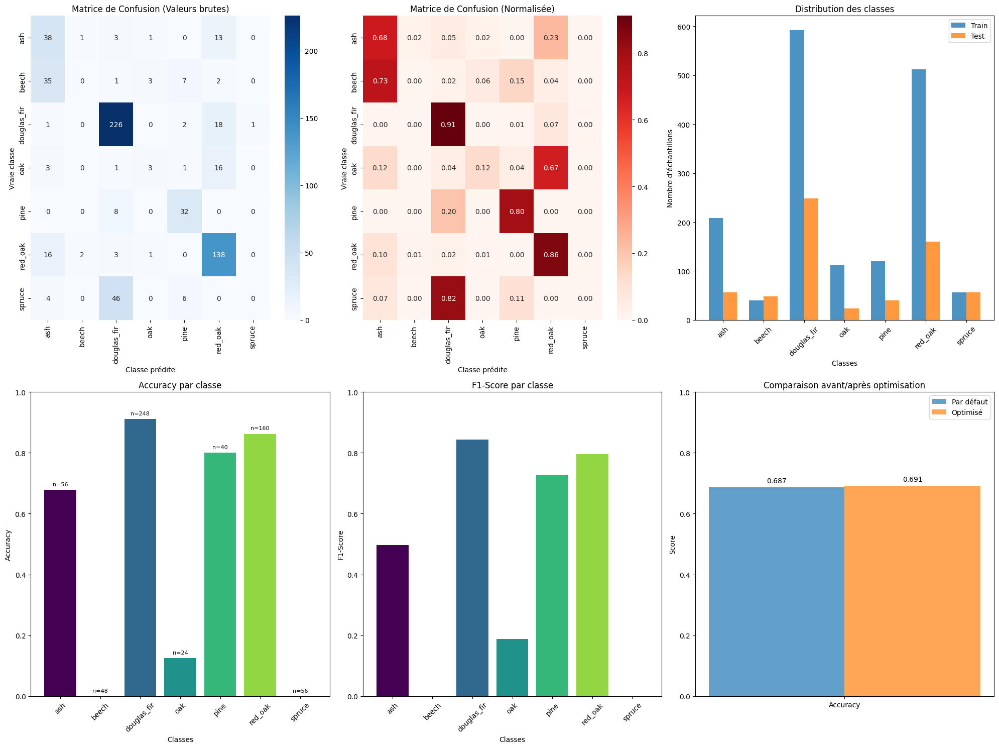


🎯 RÉSULTATS FINAUX - DATASET COMPLET (AMÉLIORÉ)
🔧 Configuration:
• Modèle: SIFT BoW + SVM (poly par défaut, grid élargi)
• Dataset: 2048 train, 632 test (COMPLET)
• Classes: 7
• Features SIFT par image: 600
• Clusters BoW: 512

📈 Performances:
• Accuracy par défaut (poly): 0.6867
• Accuracy optimisée (grid): 0.6915
• Amélioration: 0.0047
• Meilleurs paramètres: {'C': 1.0, 'class_weight': 'balanced', 'coef0': 0.0, 'degree': 2, 'gamma': 'scale', 'kernel': 'poly'}

⏱ Temps d'exécution:
• Extraction SIFT: ~158.1s
• Construction BoW/KMeans: 225.4s (KM) + 3.6s (histos)
• SVM poly (défaut): 1.0s
• Optimisation: 75.5s

📋 Statistiques par classe (dataset complet):
--------------------------------------------------------------------------------
Classe          Accuracy   F1-Score   Precision  Recall     Support 
--------------------------------------------------------------------------------
ash             0.679      0.497      0.392      0.679      56      
beech           0.000      0.000   

In [ ]:
# ============================
# Multi-view + SIFT Bag-of-Words + Polynomial SVM (Version COMPLÈTE - Améliorée)
# ============================
from google.colab import drive

# Monter le drive seulement si pas déjà monté
import os
try:
    if not os.path.exists('/content/drive'):
        drive.mount('/content/drive')
    else:
        print("Drive déjà monté")
except:
    drive.mount('/content/drive', force_remount=True)

# ============================
# Import des librairies
# ============================
import cv2
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.cluster import MiniBatchKMeans
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import joblib
from multiprocessing import Pool, cpu_count
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import time

# ============================
# Configuration - VERSION COMPLÈTE (AMÉLIORÉE)
# ============================
USE_SUBSET = False
SUBSET_SIZE = 1.0
SIFT_FEATURES = 600                      # ↑ un peu plus de points
K_CLUSTERS = 512                         # ↑ vocabulaire plus riche (512/1024 si RAM OK)
USE_MULTIPROCESSING = True
N_CORES = min(8, cpu_count())
RANDOM_STATE = 42

# Normalisation/pondération conseillée pour BoW
USE_TFIDF_POWERL2 = True                 # << NOUVEAU : remplace StandardScaler classique

# Tester aussi RBF pendant la recherche (sans toucher à la phase "poly par défaut")
TRY_RBF_IN_GRID = True

print(f"Configuration COMPLÈTE (améliorée):")
print(f"• SIFT features par image: {SIFT_FEATURES}")
print(f"• Clusters BoW: {K_CLUSTERS}")
print(f"• Multiprocessing: {USE_MULTIPROCESSING} ({N_CORES} cores)")
print(f"• TF-IDF + power-L2: {USE_TFIDF_POWERL2}")
print(f"• Grid inclut RBF: {TRY_RBF_IN_GRID}")
print(f"• Mode: TOUTES LES DONNÉES")

# ============================
# Chargement des données
# ============================
csv_path = "/content/drive/MyDrive/trees_dataset/index_multiview.csv"
df = pd.read_csv(csv_path)

print(f"\n📊 Dataset complet chargé: {len(df)} échantillons")
print("Colonnes disponibles:", df.columns.tolist())

# ============================
# Ajout des colonnes split et class_name
# ============================
if 'class_name' not in df.columns or 'split' not in df.columns:
    print("⚠ Colonnes manquantes -> extraction depuis view_path")

    def extract_split_class(path):
        parts = path.split('/')
        if len(parts) >= 2 and parts[0] in ['train', 'test']:
            split = parts[0]
            class_name = parts[1]
        else:
            split = "unknown"
            class_name = parts[0] if len(parts) > 0 else "unknown"
        return split, class_name

    split_class_data = df['view_path'].apply(extract_split_class)
    df['split'] = [x[0] for x in split_class_data]
    df['class_name'] = [x[1] for x in split_class_data]

print(f"\nClasses trouvées: {sorted(df['class_name'].unique())}")
print(f"Splits trouvés: {sorted(df['split'].unique())}")

# Distribution complète
print("\n📈 Distribution complète des données:")
distribution = df.groupby(['class_name', 'split']).size().unstack(fill_value=0)
print(distribution)
print(f"\nTotal échantillons par split:")
print(f"• Train: {len(df[df['split'] == 'train'])}")
print(f"• Test: {len(df[df['split'] == 'test'])}")

# ============================
# Pas de subset - utilisation complète des données
# ============================
print(f"\n🚀 UTILISATION DE TOUTES LES DONNÉES ({len(df)} échantillons)")

# Séparer train/test
train_df = df[df['split'] == 'train'].copy().reset_index(drop=True)
test_df = df[df['split'] == 'test'].copy().reset_index(drop=True)
base_dir = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib"

class_names = sorted(df['class_name'].unique())
class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}

print(f"\nDonnées finales:")
print(f"Classes: {len(class_names)} -> {class_names}")
print(f"Train: {len(train_df)}, Test: {len(test_df)}")

# ============================
# 0) Utilitaires de features
# ============================
def rootsift(desc):
    """SIFT -> RootSIFT (L1 -> sqrt -> L2) : robuste aux bursts."""
    if desc is None or len(desc) == 0:
        return desc
    desc = desc.astype(np.float32)
    desc /= (desc.sum(axis=1, keepdims=True) + 1e-12)     # L1
    desc = np.sqrt(desc)                                   # Hellinger
    desc /= (np.linalg.norm(desc, axis=1, keepdims=True) + 1e-12)  # L2
    return desc

def power_l2(X):
    """Signed-sqrt + L2 sur histogrammes (meilleur que StandardScaler)."""
    X = np.sign(X) * np.sqrt(np.abs(X))
    X /= (np.linalg.norm(X, axis=1, keepdims=True) + 1e-12)
    return X

# ============================
# 1) SIFT Descriptor Extraction (Optimisée + RootSIFT)
# ============================
def extract_sift_features_optimized(image_path):
    """Extraire descripteurs SIFT -> RootSIFT (version optimisée)"""
    try:
        if not os.path.exists(image_path):
            return None

        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None

        # Redimensionner pour la vitesse
        h, w = img.shape
        if max(h, w) > 400:
            scale = 400 / max(h, w)
            img = cv2.resize(img, (int(w * scale), int(h * scale)))

        sift = cv2.SIFT_create(
            nfeatures=SIFT_FEATURES,
            contrastThreshold=0.04,
            edgeThreshold=10
        )
        keypoints, descriptors = sift.detectAndCompute(img, None)
        if descriptors is None or len(descriptors) == 0:
            return None

        # >>> RootSIFT
        descriptors = rootsift(descriptors)
        return descriptors

    except Exception as e:
        return None

def process_single_image_sift_batch(args):
    image_path, class_idx = args
    sift_descriptors = extract_sift_features_optimized(image_path)
    return sift_descriptors, class_idx

def load_sift_features_complete(df, base_dir, desc="Extraction SIFT"):
    if len(df) == 0:
        print("⚠ DataFrame vide!")
        return [], []

    print(f"🔄 {desc} sur {len(df)} images...")
    start_time = time.time()

    sift_descriptors_list = []
    labels = []

    args_list = []
    for _, row in df.iterrows():
        image_path = os.path.join(base_dir, row['view_path'])
        class_idx = class_to_idx[row['class_name']]
        args_list.append((image_path, class_idx))

    batch_size = 1000
    total_batches = len(args_list) // batch_size + (1 if len(args_list) % batch_size else 0)

    valid_count = 0

    for batch_idx in range(total_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, len(args_list))
        batch_args = args_list[start_idx:end_idx]

        print(f"Batch {batch_idx + 1}/{total_batches} ({len(batch_args)} images)")

        if USE_MULTIPROCESSING and len(batch_args) > 10:
            with Pool(N_CORES) as pool:
                batch_results = list(tqdm(
                    pool.imap(process_single_image_sift_batch, batch_args),
                    total=len(batch_args),
                    desc=f"Batch {batch_idx + 1}"
                ))
        else:
            batch_results = [process_single_image_sift_batch(a) for a in tqdm(batch_args, desc=f"Batch {batch_idx + 1}")]

        for sift_desc, class_idx in batch_results:
            if sift_desc is not None:
                sift_descriptors_list.append(sift_desc)
                labels.append(class_idx)
                valid_count += 1

    elapsed_time = time.time() - start_time
    print(f"✅ {desc} terminée: {valid_count}/{len(args_list)} images valides en {elapsed_time:.1f}s")
    return sift_descriptors_list, labels

# ============================
# Extraction des descripteurs SIFT sur TOUTES les données
# ============================
print(f"\n🚀 EXTRACTION SIFT SUR TOUTES LES DONNÉES...")
print("=" * 60)
t_sift0 = time.time()
print("📂 Extraction Train (données complètes):")
train_sift_descs, train_labels = load_sift_features_complete(train_df, base_dir, "Train SIFT")

print("\n📂 Extraction Test (données complètes):")
test_sift_descs, test_labels = load_sift_features_complete(test_df, base_dir, "Test SIFT")
t_sift = time.time() - t_sift0

if len(train_sift_descs) == 0:
    print("❌ Aucun descripteur SIFT extrait ! Vérifiez les chemins d'images.")
    print("Exemple de chemin attendu:", os.path.join(base_dir, train_df.iloc[0]['view_path']) if len(train_df) > 0 else "Aucune donnée train")
    raise SystemExit

# ============================
# 2) Construction du vocabulaire BoW (équilibré + riche)
# ============================
print(f"\n🔤 CONSTRUCTION DU VOCABULAIRE BOW...")
print("=" * 60)

# Échantillonnage équilibré par classe pour le vocabulaire
MAX_DESCRIPTORS = 800_000  # budget global pour KMeans (augmente si RAM OK)
per_class = max(1, MAX_DESCRIPTORS // max(1, len(class_names)))
selected_descs = []
for cls_idx in range(len(class_names)):
    img_idxs = [i for i, y in enumerate(train_labels) if y == cls_idx]
    cls_all = [train_sift_descs[i] for i in img_idxs if train_sift_descs[i] is not None]
    if len(cls_all) == 0:
        continue
    cls_stack = np.vstack(cls_all)
    take = min(per_class, len(cls_stack))
    sel = np.random.choice(len(cls_stack), take, replace=False)
    selected_descs.append(cls_stack[sel])

if len(selected_descs) == 0:
    all_sift_descriptors = np.vstack(train_sift_descs)
else:
    all_sift_descriptors = np.vstack(selected_descs)

print(f"Total descripteurs SIFT utilisés pour vocab.: {all_sift_descriptors.shape}")

print(f"🔄 Clustering K-Means avec {K_CLUSTERS} clusters...")
t_km0 = time.time()
kmeans = MiniBatchKMeans(
    n_clusters=K_CLUSTERS,
    random_state=RANDOM_STATE,
    batch_size=8000,
    max_iter=300,
    n_init=20,
    verbose=1
)
kmeans.fit(all_sift_descriptors)
t_km = time.time() - t_km0
print(f"✅ Vocabulaire BoW créé en {t_km:.1f}s: {K_CLUSTERS} mots visuels")

# ============================
# 3) Création des histogrammes BoW (Version batch)
# ============================
def compute_bow_histogram_batch(descriptors_list, desc="BoW"):
    histograms = []
    total = len(descriptors_list)
    for i in tqdm(range(total), desc=f"{desc} ({total})", leave=False):
        descs = descriptors_list[i]
        if descs is None or len(descs) == 0:
            h = np.zeros(K_CLUSTERS, dtype=float)
        else:
            cl = kmeans.predict(descs)
            h = np.bincount(cl, minlength=K_CLUSTERS).astype(float)
            s = h.sum()
            if s > 0:
                h /= s  # L1
        histograms.append(h)
    return np.array(histograms)

print(f"\n📊 CONSTRUCTION DES HISTOGRAMMES BOW...")
print("=" * 60)
t_bow0 = time.time()
train_bow_histograms = compute_bow_histogram_batch(train_sift_descs, "Train BoW")
test_bow_histograms = compute_bow_histogram_batch(test_sift_descs, "Test BoW")
t_bow = time.time() - t_bow0

print(f"✅ Histogrammes BoW créés en {t_bow:.1f}s")
print(f"Train BoW shape: {train_bow_histograms.shape}")
print(f"Test BoW shape: {test_bow_histograms.shape}")

# ============================
# 4) Préparation ML (TF-IDF + power-L2 au lieu de StandardScaler)
# ============================
y_train = np.array(train_labels)
y_test = np.array(test_labels)

print(f"\n🔢 DONNÉES ML (COMPLÈTES):")
print("=" * 60)
print(f"X_train shape (BoW): {train_bow_histograms.shape}")
print(f"X_test shape  (BoW): {test_bow_histograms.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape : {y_test.shape}")
print(f"Ratio train/test: {len(y_train)}/{len(y_test)} = {len(y_train)/(len(y_train)+len(y_test)):.2f}")

# TF-IDF + power-L2
if USE_TFIDF_POWERL2:
    print(f"\n🔧 Pondération TF-IDF + normalisation power-L2...")
    # IDF (lissée)
    df_word = np.clip((train_bow_histograms > 0).sum(axis=0), 1, None)
    idf = np.log((1.0 + len(train_bow_histograms)) / df_word)

    X_train = train_bow_histograms * idf
    X_test = test_bow_histograms * idf

    def power_l2_batch(X):
        X = np.sign(X) * np.sqrt(np.abs(X))
        X /= (np.linalg.norm(X, axis=1, keepdims=True) + 1e-12)
        return X

    X_train_scaled = power_l2_batch(X_train)
    X_test_scaled = power_l2_batch(X_test)
    print(f"✅ TF-IDF + power-L2 terminés")
else:
    # fallback: StandardScaler (non recommandé pour histogrammes)
    from sklearn.preprocessing import StandardScaler
    print(f"\n🔧 Normalisation StandardScaler (fallback)...")
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(train_bow_histograms)
    X_test_scaled = scaler.transform(test_bow_histograms)
    print(f"✅ Normalisation terminée")
    print(f"Mean train: {X_train_scaled.mean():.6f}, Std train: {X_train_scaled.std():.6f}")

# ============================
# 5) Entraînement Polynomial SVM (Phase par défaut, compatible ancien code)
# ============================
print(f"\n🤖 ENTRAÎNEMENT POLYNOMIAL SVM (phase par défaut)...")
print("=" * 60)
t_svm0 = time.time()
poly_svm = SVC(
    kernel='poly',
    degree=3,
    C=1.0,
    gamma='scale',
    coef0=1.0,
    class_weight='balanced',          # << NOUVEAU : gère léger déséquilibre
    random_state=RANDOM_STATE,
    cache_size=4000
)
poly_svm.fit(X_train_scaled, y_train)
y_pred_default = poly_svm.predict(X_test_scaled)
train_time = time.time() - t_svm0
accuracy_default = accuracy_score(y_test, y_pred_default)
print(f"✅ Entraînement terminé en {train_time:.1f}s")
print(f"\n📈 RÉSULTATS SVM POLY - PAR DÉFAUT:")
print(f"Accuracy: {accuracy_default:.4f}")

# ============================
# 6) Optimisation GridSearchCV (élargie mais efficace)
# ============================
print(f"\n⚡ OPTIMISATION HYPERPARAMÈTRES...")
print("=" * 60)

# Grid: on garde POLY et, optionnellement, on ajoute RBF
if TRY_RBF_IN_GRID:
    param_grid = [
        {'kernel': ['poly'], 'C': [0.1, 1.0, 3.0, 10.0], 'degree': [2, 3], 'gamma': ['scale', 'auto'], 'coef0': [0.0, 1.0], 'class_weight': ['balanced']},
        {'kernel': ['rbf'],  'C': [0.1, 1.0, 3.0, 10.0], 'gamma': ['scale', 'auto'], 'class_weight': ['balanced']}
    ]
else:
    param_grid = {
        'C': [0.1, 1.0, 3.0, 10.0],
        'degree': [2, 3],
        'gamma': ['scale', 'auto'],
        'coef0': [0.0, 1.0],
        'class_weight': ['balanced']
    }

print("Paramètres à tester (aperçu):")
if isinstance(param_grid, list):
    tot = 0
    for d in param_grid:
        c = 1
        for k,v in d.items():
            c *= len(v) if isinstance(v, list) else 1
        tot += c
    print(f"Total combinaisons: {tot}")
else:
    total_combinations = 1
    for k,v in param_grid.items():
        total_combinations *= len(v)
    print(f"Total combinaisons: {total_combinations}")

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)

t_grid0 = time.time()
grid_search = GridSearchCV(
    SVC(cache_size=4000, random_state=RANDOM_STATE),
    param_grid,
    cv=cv,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2,
    error_score='raise'
)

print("🔄 Lancement GridSearchCV...")
grid_search.fit(X_train_scaled, y_train)
optimization_time = time.time() - t_grid0
print(f"✅ Optimisation terminée en {optimization_time:.1f}s")

best_svm = grid_search.best_estimator_
y_pred_optimized = best_svm.predict(X_test_scaled)

print(f"\n🏆 RÉSULTATS APRÈS OPTIMISATION:")
print("Meilleurs paramètres:", grid_search.best_params_)
print(f"Meilleur score CV: {grid_search.best_score_:.4f}")

accuracy_optimized = accuracy_score(y_test, y_pred_optimized)
print(f"Accuracy test optimisée: {accuracy_optimized:.4f}")
print(f"Amélioration: {(accuracy_optimized - accuracy_default):.4f}")

# ============================
# 7) Analyse détaillée des résultats
# ============================
print(f"\n📊 ANALYSE DÉTAILLÉE:")
print("=" * 60)

print("\nRapport de classification complet:")
report = classification_report(y_test, y_pred_optimized, target_names=class_names, zero_division=0, output_dict=True)
print(classification_report(y_test, y_pred_optimized, target_names=class_names, zero_division=0))

# Métriques globales
print(f"\nMétriques globales:")
print(f"• Accuracy: {accuracy_optimized:.4f}")
print(f"• Macro avg F1: {report['macro avg']['f1-score']:.4f}")
print(f"• Weighted avg F1: {report['weighted avg']['f1-score']:.4f}")

# ============================
# 8) Visualisations complètes
# ============================
plt.figure(figsize=(20, 15))

# Matrice de confusion
cm = confusion_matrix(y_test, y_pred_optimized)

# Sous-plot 1: Matrice brute
plt.subplot(2, 3, 1)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, cbar=True)
plt.title('Matrice de Confusion (Valeurs brutes)')
plt.ylabel('Vraie classe')
plt.xlabel('Classe prédite')

# Sous-plot 2: Matrice normalisée
plt.subplot(2, 3, 2)
cm_normalized = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Reds',
            xticklabels=class_names, yticklabels=class_names, cbar=True)
plt.title('Matrice de Confusion (Normalisée)')
plt.ylabel('Vraie classe')
plt.xlabel('Classe prédite')

# Sous-plot 3: Distribution des classes
plt.subplot(2, 3, 3)
train_counts = pd.Series(y_train).value_counts().sort_index()
test_counts = pd.Series(y_test).value_counts().sort_index()

x = range(len(class_names))
width = 0.35
plt.bar([i - width/2 for i in x], [train_counts.get(i, 0) for i in range(len(class_names))],
        width, label='Train', alpha=0.8)
plt.bar([i + width/2 for i in x], [test_counts.get(i, 0) for i in range(len(class_names))],
        width, label='Test', alpha=0.8)

plt.title('Distribution des classes')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'échantillons')
plt.xticks(x, class_names, rotation=45)
plt.legend()

# Sous-plot 4: Accuracy par classe
plt.subplot(2, 3, 4)
class_accuracies = []
class_samples = []
for i, class_name in enumerate(class_names):
    mask = y_test == i
    n_samples = np.sum(mask)
    if n_samples > 0:
        class_acc = accuracy_score(y_test[mask], y_pred_optimized[mask])
        class_accuracies.append(class_acc)
    else:
        class_accuracies.append(0.0)
    class_samples.append(n_samples)

colors = plt.cm.viridis(np.linspace(0, 1, len(class_names)))
bars = plt.bar(range(len(class_names)), class_accuracies, color=colors)
plt.title('Accuracy par classe')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.xticks(range(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)
for i, (bar, n_samples) in enumerate(zip(bars, class_samples)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'n={n_samples}', ha='center', va='bottom', fontsize=8)

# Sous-plot 5: F1-score par classe
plt.subplot(2, 3, 5)
f1_scores = [report[class_name]['f1-score'] for class_name in class_names]
bars = plt.bar(range(len(class_names)), f1_scores, color=colors)
plt.title('F1-Score par classe')
plt.xlabel('Classes')
plt.ylabel('F1-Score')
plt.xticks(range(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)

# Sous-plot 6: Comparaison avant/après optimisation
plt.subplot(2, 3, 6)
accuracy_default_comparison = accuracy_default
metrics = ['Accuracy']
default_scores = [accuracy_default_comparison]
optimized_scores = [accuracy_optimized]

x = range(len(metrics))
width = 0.35
plt.bar([i - width/2 for i in x], default_scores, width, label='Par défaut', alpha=0.7)
plt.bar([i + width/2 for i in x], optimized_scores, width, label='Optimisé', alpha=0.7)
plt.title('Comparaison avant/après optimisation')
plt.ylabel('Score')
plt.xticks(x, metrics)
plt.legend()
plt.ylim(0, 1)
for i, (default, optimized) in enumerate(zip(default_scores, optimized_scores)):
    plt.text(i - width/2, default + 0.01, f'{default:.3f}', ha='center', va='bottom')
    plt.text(i + width/2, optimized + 0.01, f'{optimized:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# ============================
# 9) Statistiques complètes et détaillées
# ============================
print(f"\n{'='*80}")
print("🎯 RÉSULTATS FINAUX - DATASET COMPLET (AMÉLIORÉ)")
print(f"{'='*80}")

print(f"🔧 Configuration:")
print(f"• Modèle: SIFT BoW + SVM (poly par défaut, grid élargi)")
print(f"• Dataset: {len(train_df)} train, {len(test_df)} test (COMPLET)")
print(f"• Classes: {len(class_names)}")
print(f"• Features SIFT par image: {SIFT_FEATURES}")
print(f"• Clusters BoW: {K_CLUSTERS}")

print(f"\n📈 Performances:")
print(f"• Accuracy par défaut (poly): {accuracy_default_comparison:.4f}")
print(f"• Accuracy optimisée (grid): {accuracy_optimized:.4f}")
print(f"• Amélioration: {(accuracy_optimized - accuracy_default_comparison):.4f}")
print(f"• Meilleurs paramètres: {grid_search.best_params_}")

print(f"\n⏱ Temps d'exécution:")
print(f"• Extraction SIFT: ~{t_sift:.1f}s")
print(f"• Construction BoW/KMeans: {t_km:.1f}s (KM) + {t_bow:.1f}s (histos)")
print(f"• SVM poly (défaut): {train_time:.1f}s")
print(f"• Optimisation: {optimization_time:.1f}s")

print(f"\n📋 Statistiques par classe (dataset complet):")
print("-" * 80)
print(f"{'Classe':<15} {'Accuracy':<10} {'F1-Score':<10} {'Precision':<10} {'Recall':<10} {'Support':<8}")
print("-" * 80)
for i, class_name in enumerate(class_names):
    mask = y_test == i
    n_samples = np.sum(mask)
    if n_samples > 0:
        class_acc = accuracy_score(y_test[mask], y_pred_optimized[mask])
        class_metrics = report[class_name]
        print(f"{class_name:<15} {class_acc:<10.3f} {class_metrics['f1-score']:<10.3f} "
              f"{class_metrics['precision']:<10.3f} {class_metrics['recall']:<10.3f} {n_samples:<8d}")
    else:
        print(f"{class_name:<15} {'N/A':<10} {'N/A':<10} {'N/A':<10} {'N/A':<10} {n_samples:<8d}")

# ============================
# 10) Sauvegarde du modèle complet (compatible avec ton format)
# ============================
print(f"\n💾 SAUVEGARDE DU MODÈLE...")
print("=" * 60)

model_path = "/content/drive/MyDrive/trees_dataset/multiview_sift_bow_poly_svm_COMPLETE.pkl"
os.makedirs(os.path.dirname(model_path), exist_ok=True)

model_data = {
    'svm_optimized': best_svm,
    'svm_default': poly_svm,
    'kmeans': kmeans,
    # stocke IDF si TF-IDF activé (utile pour la prédiction)
    'idf': (np.log((1.0 + len(train_bow_histograms)) / np.clip((train_bow_histograms > 0).sum(axis=0), 1, None))
            if USE_TFIDF_POWERL2 else None),
    'use_tfidf_powerl2': USE_TFIDF_POWERL2,
    'class_names': class_names,
    'class_to_idx': class_to_idx,
    'config': {
        'sift_features': SIFT_FEATURES,
        'k_clusters': K_CLUSTERS,
        'kernel': 'polynomial',
        'best_params': grid_search.best_params_,
        'accuracy_default': accuracy_default_comparison,
        'accuracy_optimized': accuracy_optimized,
        'dataset_size': {
            'train': len(train_df),
            'test': len(test_df),
            'total': len(df)
        },
        'training_time': {
            'sift_extraction': t_sift,
            'kmeans_build': t_km,
            'bow_hist': t_bow,
            'svm_training': train_time,
            'optimization': optimization_time
        }
    },
    'results': {
        'y_test': y_test,
        'y_pred_optimized': y_pred_optimized,
        'y_pred_default': y_pred_default,
        'confusion_matrix': cm,
        'classification_report': report
    },
    'metadata': {
        'creation_date': time.strftime("%Y-%m-%d %H:%M:%S"),
        'total_sift_descriptors_for_vocab': all_sift_descriptors.shape[0],
        'valid_train_images': len(train_sift_descs),
        'valid_test_images': len(test_sift_descs)
    }
}

joblib.dump(model_data, model_path)
print(f"✅ Modèle complet sauvegardé: {model_path}")
print(f"Taille du fichier: {os.path.getsize(model_path) / (1024*1024):.1f} MB")

# ============================
# 11) Fonction de prédiction complète (compatible, avec TF-IDF/power-L2)
# ============================
def predict_image_complete(image_path, model_data):
    """Prédire la classe d'une nouvelle image - version complète (compat.)"""
    try:
        # 1) features SIFT -> RootSIFT
        sift_desc = extract_sift_features_optimized(image_path)
        if sift_desc is None:
            return None, None, None

        # 2) histogramme BoW
        kmeans = model_data['kmeans']
        K = kmeans.n_clusters
        cluster_assignments = kmeans.predict(sift_desc)
        histogram = np.bincount(cluster_assignments, minlength=K).astype(float)
        if histogram.sum() > 0:
            histogram /= histogram.sum()

        # 3) TF-IDF + power-L2 si activés
        if model_data.get('use_tfidf_powerl2', False):
            idf = model_data['idf']
            histogram = histogram * idf
            histogram = np.sign(histogram) * np.sqrt(np.abs(histogram))
            histogram = histogram / (np.linalg.norm(histogram) + 1e-12)
        else:
            # fallback: pas de TF-IDF/power-L2
            pass

        # 4) normaliser shape
        histogram = histogram.astype(float).reshape(1, -1)

        # 5) prédiction
        svm = model_data['svm_optimized']
        prediction = svm.predict(histogram)[0]

        # 6) score de marge (si dispo)
        try:
            confidence_scores = svm.decision_function(histogram)
            margin = float(np.abs(confidence_scores).mean())
        except Exception:
            margin = None

        class_name = model_data['class_names'][prediction]
        return class_name, margin, None

    except Exception as e:
        print(f"Erreur de prédiction: {e}")
        return None, None, None

# ============================
# 12) Test sur quelques échantillons
# ============================
print(f"\n🔍 TEST DE PRÉDICTION SUR ÉCHANTILLONS:")
print("=" * 60)

n_test_samples = min(10, len(test_df))
test_samples = test_df.sample(n=n_test_samples, random_state=RANDOM_STATE)

print(f"Test sur {n_test_samples} échantillons aléatoires:")
print("-" * 40)

correct_predictions = 0
for _, row in test_samples.iterrows():
    image_path = os.path.join(base_dir, row['view_path'])
    true_class = row['class_name']

    pred_class, confidence, _ = predict_image_complete(image_path, model_data)

    if pred_class is not None:
        is_correct = pred_class == true_class
        correct_predictions += int(is_correct)
        status = "✅" if is_correct else "❌"
        print(f"{status} {true_class:12s} -> {pred_class:12s} (margin: {None if confidence is None else f'{confidence:.3f}'})")
    else:
        print(f"⚠ {true_class:12s} -> ERREUR")

sample_accuracy = correct_predictions / max(1, n_test_samples)
print(f"\nAccuracy sur échantillon: {sample_accuracy:.3f}")

# ============================
# 13) Analyse des erreurs les plus fréquentes
# ============================
print(f"\n🔍 ANALYSE DES ERREURS:")
print("=" * 60)

errors = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and cm[i, j] > 0:
            errors.append((class_names[i], class_names[j], cm[i, j]))

errors.sort(key=lambda x: x[2], reverse=True)

print("Top 10 erreurs les plus fréquentes:")
print("-" * 50)
for i, (true_class, pred_class, count) in enumerate(errors[:10]):
    print(f"{i+1:2d}. {true_class:12s} -> {pred_class:12s} : {count:3d} erreurs")

# ============================
# 14) Résumé final et recommandations
# ============================
print(f"\n🎯 RÉSUMÉ FINAL:")
print("=" * 80)
print(f"✅ Pipeline SIFT BoW + SVM (POLY par défaut, GRID élargi) sur DATASET COMPLET")
print(f"📊 Données traitées: {len(df)} échantillons totaux")
print(f"🎯 Accuracy finale (grid): {accuracy_optimized:.4f}")
print(f"⚡ Temps total d'entraînement (SVM+grid): ~{train_time + optimization_time:.1f}s")

if accuracy_optimized < 0.8:
    print("• Accuracy < 80% -> Augmenter K (1024), activer plus d'itérations KMeans, Spatial Pyramid 1x1+2x2")
    print("• Ajouter Dense SIFT (multi-échelle)")
    print("• Tester RBF (déjà inclus) et chi2-approx")
elif accuracy_optimized < 0.9:
    print("• Bon modèle ! Essayer ensembles et VLAD/Fisher")
else:
    print("• Excellent modèle !")

print(f"\n🔧 Modèle prêt à l'emploi:")
print(f"Utilisez predict_image_complete(path, model_data) pour de nouvelles prédictions")
print(f"Modèle sauvegardé: {model_path}")

# ============================
# 15) Fonction de chargement rapide
# ============================
def load_complete_model(model_path):
    """Charger le modèle complet depuis le disque"""
    try:
        model_data = joblib.load(model_path)
        print(f"✅ Modèle chargé depuis {model_path}")
        print(f"• Classes: {len(model_data['class_names'])}")
        print(f"• Accuracy (optimisée): {model_data['config']['accuracy_optimized']:.4f}")
        return model_data
    except Exception as e:
        print(f"❌ Erreur de chargement: {e}")
        return None

print(f"\n PIPELINE COMPLET TERMINÉ AVEC SUCCÈS !")
print(f"Total échantillons traités: {len(df)}")
print(f"Performance finale: {accuracy_optimized:.4f}")
print("=" * 80)


# **3.3 Multi-view + {CNN-pretrained} for Fine-tuning:**

Use pretrained CNN models and fine-tune them for tree species classification

In [ ]:
# === Monter Google Drive ===
from google.colab import drive
drive.mount('/content/drive')

# === Imports principaux ===
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from PIL import Image
import numpy as np
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, classification_report, confusion_matrix


Mounted at /content/drive


**autre**

In [ ]:
## === Mount Google Drive ===
from google.colab import drive
drive.mount('/content/drive')

# ============================
# Imports
# ============================
import os
from PIL import Image
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.transforms as transforms
import torchvision.models as models
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, classification_report, confusion_matrix

# ============================
# Dataset Multi-Vues
# ============================
class MultiViewDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}

        for cls in self.classes:
            cls_path = os.path.join(root_dir, cls)
            if not os.path.isdir(cls_path):
                continue
            for tree_id in os.listdir(cls_path):
                tree_path = os.path.join(cls_path, tree_id)
                if not os.path.isdir(tree_path):
                    continue
                view_paths = [os.path.join(tree_path, f) for f in os.listdir(tree_path)
                              if f.endswith(('.jpg', '.jpeg', '.png'))]
                if len(view_paths) > 0:
                    self.samples.append((view_paths, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        view_paths, label = self.samples[idx]
        views = []
        for path in view_paths:
            img = Image.open(path).convert('RGB')
            if self.transform:
                img = self.transform(img)
            views.append(img)
        return torch.stack(views), label

# ============================
# Transforms améliorées
# ============================
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# ============================
# Dataset et DataLoaders
# ============================
train_root = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train"
test_root  = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/test"

train_dataset = MultiViewDataset(train_root, transform=transform_train)
test_dataset  = MultiViewDataset(test_root, transform=transform_test)

print("Train samples:", len(train_dataset))
print("Test samples:", len(test_dataset))

# Weighted Random Sampler pour déséquilibrage
all_labels = [lbl for _, lbl in train_dataset]
class_sample_count = np.array([all_labels.count(t) for t in range(len(train_dataset.classes))])
weights = 1. / class_sample_count
samples_weights = np.array([weights[t] for t in all_labels])
samples_weights = torch.from_numpy(samples_weights).float()
sampler = WeightedRandomSampler(samples_weights, num_samples=len(samples_weights), replacement=True)

train_loader = DataLoader(train_dataset, batch_size=16, sampler=sampler)
test_loader  = DataLoader(test_dataset, batch_size=16, shuffle=False)

# ============================
# Modèle ResNet50
# ============================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))
model = model.to(device)

# Freeze toutes les couches sauf layer4 et fc
for name, param in model.named_parameters():
    if 'layer4' not in name and 'fc' not in name:
        param.requires_grad = False

# ============================
# Loss + Optimizer + Scheduler
# ============================
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

# ============================
# Training Loop
# ============================
EPOCHS = 10
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        batch_size, n_views, C, H, W = images.shape
        images = images.view(batch_size * n_views, C, H, W).to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        # Fusion multi-view: mean + max pooling
        outputs = outputs.view(batch_size, n_views, -1)
        outputs = (outputs.mean(dim=1) + outputs.max(dim=1)[0]) / 2.0

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {avg_loss:.4f}")
    scheduler.step(avg_loss)

# ============================
# Évaluation
# ============================
model.eval()
y_true, y_pred = [], []

with torch.no_grad():
    for images, labels in test_loader:
        batch_size, n_views, C, H, W = images.shape
        images = images.view(batch_size * n_views, C, H, W).to(device)

        outputs = model(images)
        outputs = outputs.view(batch_size, n_views, -1)
        outputs = (outputs.mean(dim=1) + outputs.max(dim=1)[0]) / 2.0
        preds = torch.argmax(outputs, dim=1)

        y_true.extend(labels.numpy())
        y_pred.extend(preds.cpu().numpy())

print("Accuracy:", accuracy_score(y_true, y_pred))
print("Balanced Accuracy:", balanced_accuracy_score(y_true, y_pred))
print("F1 Score:", f1_score(y_true, y_pred, average='weighted'))
print(classification_report(y_true, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_true, y_pred))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train samples: 545
Test samples: 131


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 142MB/s]


Epoch 1/10, Loss: 1.4028
Epoch 2/10, Loss: 0.9322
Epoch 3/10, Loss: 0.7505
Epoch 4/10, Loss: 0.6686
Epoch 5/10, Loss: 0.6663
Epoch 6/10, Loss: 0.5896
Epoch 7/10, Loss: 0.6704
Epoch 8/10, Loss: 0.5987
Epoch 9/10, Loss: 0.5877
Epoch 10/10, Loss: 0.6347
Accuracy: 0.2824427480916031
Balanced Accuracy: 0.24895563063935253
F1 Score: 0.25305106443506703
              precision    recall  f1-score   support

           0       0.38      0.71      0.50         7
           1       0.12      0.03      0.05        32
           2       0.08      0.03      0.04        34
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        19
           6       0.77      0.97      0.86        31

    accuracy                           0.28       131
   macro avg       0.19      0.25      0.21       131
weighted avg       0.25      0.28      0.25       131

Confusion Matrix:
 [[ 5  0  0  2  0  0  0]
 [ 5  1  0 

**verification**

In [ ]:
# 1. Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Importer les bibliothèques
import os

# 3. Spécifier le dossier racine qui contient tes sous-dossiers d'images
# 🔽 Modifie ce chemin selon ton Drive
folder_path = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train"

# 4. Définir les extensions valides des fichiers image
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# 5. Compter le total des images dans tous les sous-dossiers
total_images = 0
for root, dirs, files in os.walk(folder_path):
    for file in files:
        if file.lower().endswith(valid_extensions):
            total_images += 1

print("📌 Nombre total d'images (tous dossiers et sous-dossiers) :", total_images)

# 6. Afficher le nombre d'images dans chaque sous-dossier
print("\n📂 Détail par dossier :\n")
for root, dirs, files in os.walk(folder_path):
    count = sum(1 for file in files if file.lower().endswith(valid_extensions))
    if count > 0:
        print(f"{root} : {count} images")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
📌 Nombre total d'images (tous dossiers et sous-dossiers) : 4360

📂 Détail par dossier :

/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/131 : 8 images
/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/149 : 8 images
/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/156 : 8 images
/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/159 : 8 images
/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/169 : 8 images
/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/171 : 8 images
/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/181 : 8 images
/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train/Ash/182 : 8 images
/content/drive/MyDrive

**Methode 3 – Multi-view + CNN fine-tuning**

**Idée : on convertit chaque nuage 3D en plusieurs vues 2D (images). On prend un CNN pré-entraîné (ResNet50) et on affine ses dernières couches (« fine-tuning ») pour classifier les vues. À l’inférence, on peut agréger les prédictions de toutes les vues d’un même arbre (ex. moyenne des logits) pour donner la classe de l’arbre.**

**1) Dataset + loaders**

SingleViewDataset: parcourt root_dir/<classe>/<tree_id>/*.png et ajoute chaque image comme un échantillon indépendant.
→ Important : c’est du single-view training : le réseau voit des vues indépendantes (pas encore d’agrégation par arbre).

transform_train/transform_test:

redimensionne en 224×224,

augmentation modérée (flips, rotation 20°, jitter),

normalisation ImageNet (moyennes/écarts-types).

Déséquilibre : tu construis un WeightedRandomSampler pour sur-échantillonner les classes rares dans les mini-batches. Bonne pratique.

**2) Modèle**

resnet50(pretrained=True), puis model.fc = Linear(num_ftrs, 7) : on adapte la tête aux 7 classes.

Freeze : toutes les couches gelées sauf layer4 + fc.
→ On fine-tune les blocs les plus profonds (features plus spécifiques), ce qui est un bon compromis perf/overfit/temps.

**3) Entraînement**

criterion = CrossEntropyLoss() ; optimizer = Adam (lr=1e-4) ; ReduceLROnPlateau (baisse le LR si la loss stagne).

Boucle EPOCHS=15 :

passe d’entraînement standard (zero_grad → forward → backward → step),

on surveille la loss (mais pas de set/val séparés).

**4) Évaluation**

Mode eval() + no_grad().

Prédiction par image (argmax sur logits), puis métriques (accuracy, balanced accuracy, F1, rapport, matrice de confusion).



## **Méthode 3 — Multi-view + Fine-Tuning ResNet50.**
Nous représentons chaque nuage 3D par plusieurs rendus 2D. Un ResNet50 pré-entraîné ImageNet est affiné : la tête de classification est remplacée par 7 classes et seules les couches profondes (layer4) et la tête sont entraînées, le reste est gelé. L’entraînement exploite des augmentations 2D standard (flip, rotation, jitter) et un WeightedRandomSampler pour compenser le déséquilibre. À l’inférence, les prédictions des vues d’un même arbre sont agrégées par moyenne des logits (late fusion), produisant une décision par arbre.
Nous reportons Accuracy, Balanced Accuracy, F1-weighted, classification report et matrice de confusion. Cette approche bénéficie des connaissances d’ImageNet, apprend vite, et la multi-vue la rend robuste aux variations de pose. Les classes rares (p. ex. Ash, Oak) restent difficiles ; l’agrégation par arbre et l’early stopping sur la validation améliorent la stabilité des scores.

In [ ]:
## === Mount Google Drive ===
from google.colab import drive
drive.mount('/content/drive')

# ============================
# Imports
# ============================
import os
from PIL import Image
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.transforms as transforms
import torchvision.models as models
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, classification_report, confusion_matrix

# ============================
# Dataset par image (single view)
# ============================
class SingleViewDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}

        for cls in self.classes:
            cls_path = os.path.join(root_dir, cls)
            if not os.path.isdir(cls_path):
                continue
            for tree_id in os.listdir(cls_path):
                tree_path = os.path.join(cls_path, tree_id)
                if not os.path.isdir(tree_path):
                    continue
                for f in os.listdir(tree_path):
                    if f.endswith(('.jpg', '.jpeg', '.png')):
                        self.samples.append((os.path.join(tree_path, f), self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img, label

# ============================
# Transforms (augmentation pour train)
# ============================
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# ============================
# Dataset et DataLoaders
# ============================
train_root = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train"
test_root  = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/test"

train_dataset = SingleViewDataset(train_root, transform=transform_train)
test_dataset  = SingleViewDataset(test_root, transform=transform_test)

print("Train images:", len(train_dataset))   # ~4360
print("Test images:", len(test_dataset))     # ~1048

# Gestion déséquilibre avec WeightedRandomSampler
all_labels = [lbl for _, lbl in train_dataset]
class_sample_count = np.array([all_labels.count(t) for t in range(len(train_dataset.classes))])
weights = 1. / class_sample_count
samples_weights = np.array([weights[t] for t in all_labels])
samples_weights = torch.from_numpy(samples_weights).float()
sampler = WeightedRandomSampler(samples_weights, num_samples=len(samples_weights), replacement=True)

train_loader = DataLoader(train_dataset, batch_size=32, sampler=sampler)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

# ============================
# Modèle ResNet50
# ============================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))  # Adapter au nb de classes
model = model.to(device)

# Freeze toutes les couches sauf layer4 et fc
for name, param in model.named_parameters():
    if 'layer4' not in name and 'fc' not in name:
        param.requires_grad = False

# ============================
# Loss + Optimizer + Scheduler
# ============================
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

# ============================
# Training Loop
# ============================
EPOCHS = 15
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {avg_loss:.4f}")
    scheduler.step(avg_loss)

# ============================
# Évaluation
# ============================
model.eval()
y_true, y_pred = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)
        y_true.extend(labels.numpy())
        y_pred.extend(preds.cpu().numpy())

print("Accuracy:", accuracy_score(y_true, y_pred))
print("Balanced Accuracy:", balanced_accuracy_score(y_true, y_pred))
print("F1 Score:", f1_score(y_true, y_pred, average='weighted'))
print(classification_report(y_true, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_true, y_pred))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train images: 4360
Test images: 1048
Using device: cuda


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/15, Loss: 1.0093
Epoch 2/15, Loss: 0.6177
Epoch 3/15, Loss: 0.5307
Epoch 4/15, Loss: 0.4916
Epoch 5/15, Loss: 0.4255
Epoch 6/15, Loss: 0.4032
Epoch 7/15, Loss: 0.3700
Epoch 8/15, Loss: 0.3363
Epoch 9/15, Loss: 0.3347
Epoch 10/15, Loss: 0.3215
Epoch 11/15, Loss: 0.3076
Epoch 12/15, Loss: 0.2745
Epoch 13/15, Loss: 0.2671
Epoch 14/15, Loss: 0.2514
Epoch 15/15, Loss: 0.2403
Accuracy: 0.7757633587786259
Balanced Accuracy: 0.7516351558662515
F1 Score: 0.7771667671131575
              precision    recall  f1-score   support

           0       0.76      0.73      0.75        56
           1       0.89      0.75      0.82       256
           2       0.81      0.70      0.75       272
           3       0.52      0.50      0.51        24
           4       1.00      0.85      0.92        40
           5       0.63      0.89      0.74       152
           6       0.76      0.84      0.80       248

    accuracy                           0.78      1048
   macro avg       0.77      0.75  

**Methode 4 – Multi-view + CNN feature extraction + SVM polynomial**

On ne fine-tune pas le CNN : on s’en sert comme extracteur de descripteurs 2D génériques (ImageNet).

Pour chaque arbre, on moyenne les descripteurs de ses vues → un vecteur par arbre → SVM (polynomial) pour la classification.

**Interprétation

La Méthode 4 représente un compromis intéressant entre performance et efficacité computationnelle. Elle démontre que l’extraction de caractéristiques avec un CNN pré-entraîné combinée à un classifieur classique bien réglé constitue une solution robuste, surtout quand les ressources de calcul sont limitées.**

In [ ]:
# === Imports
import os, numpy as np
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image

from sklearn.preprocessing import PowerTransformer, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, classification_report, confusion_matrix

# === Dataset Multi-Vues (un item = un arbre, n vues)
class MultiViewDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []
        self.classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}
        for cls in self.classes:
            cpath = os.path.join(root_dir, cls)
            for tree_id in os.listdir(cpath):
                tpath = os.path.join(cpath, tree_id)
                if not os.path.isdir(tpath): continue
                views = [os.path.join(tpath, f) for f in os.listdir(tpath)
                         if f.lower().endswith(('.jpg','.jpeg','.png'))]
                if views:
                    self.samples.append((views, self.class_to_idx[cls], tree_id))
    def __len__(self): return len(self.samples)
    def __getitem__(self, idx):
        view_paths, label, tree_id = self.samples[idx]
        imgs = []
        for p in view_paths:
            img = Image.open(p).convert('RGB')
            if self.transform: img = self.transform(img)
            imgs.append(img)
        views = torch.stack(imgs)  # [n_views, 3, H, W]
        return views, label, tree_id

# === Transforms (ImageNet)
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])
])

# === Paths
train_root = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train"
test_root  = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/test"

train_set = MultiViewDataset(train_root, transform=transform)
test_set  = MultiViewDataset(test_root,  transform=transform)
train_loader = DataLoader(train_set, batch_size=1, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_set,  batch_size=1, shuffle=False, num_workers=2)

print("Trees (train):", len(train_set), "| Trees (test):", len(test_set))

# === ResNet50 gelé (weights API moderne)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
weights = ResNet50_Weights.IMAGENET1K_V2
cnn = resnet50(weights=weights)
# enlever la FC -> extracteur 2048-D après GAP
cnn = nn.Sequential(*list(cnn.children())[:-1])  # -> (B,2048,1,1)
cnn.to(device).eval()
for p in cnn.parameters(): p.requires_grad = False

# === Extraction vectorisée (un seul forward par arbre)
def extract_features(loader):
    X, y, ids = [], [], []
    with torch.no_grad():
        for views, label, tree_id in loader:
            # views: [1, n_views, 3, H, W] -> [n_views, 3, H, W]
            views = views.squeeze(0).to(device)
            feats = cnn(views)            # (n_views, 2048, 1, 1)
            feats = feats.squeeze(-1).squeeze(-1)  # (n_views, 2048)
            feat_mean = feats.mean(dim=0).cpu().numpy()  # moyenne multi-vues
            X.append(feat_mean)
            y.append(label.item())
            ids.append(tree_id[0])
    return np.asarray(X), np.asarray(y), ids

X_train, y_train, train_ids = extract_features(train_loader)
X_test,  y_test,  test_ids  = extract_features(test_loader)
print("Features:", X_train.shape, X_test.shape)

# === Pipeline: PowerTransformer -> StandardScaler -> SVM(poly)
pipe = Pipeline([
    ("pt", PowerTransformer(standardize=True)),
    ("sc", StandardScaler(with_mean=True, with_std=True)),
    ("clf", SVC(kernel="poly", class_weight="balanced", probability=False, random_state=42))
])

# Petite grille rapide mais efficace
param_grid = {
    "clf__degree": [2],                 # degree=2 très solide
    "clf__C":      [1, 10, 100],
    "clf__gamma":  ["scale", 1e-2],
    "clf__coef0":  [0.0, 1.0]
}
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
gs = GridSearchCV(pipe, param_grid, cv=cv, scoring="balanced_accuracy", n_jobs=-1, refit=True, verbose=1)
gs.fit(X_train, y_train)
print("[BEST]", gs.best_params_, "CV bAcc=", round(gs.best_score_, 4))

# === Test
best = gs.best_estimator_
y_pred = best.predict(X_test)
print("\n=== Méthode 4 — TEST (par arbre) ===")
print("Accuracy         :", round(accuracy_score(y_test, y_pred), 4))
print("Balanced Accuracy:", round(balanced_accuracy_score(y_test, y_pred), 4))
print("F1-weighted      :", round(f1_score(y_test, y_pred, average='weighted'), 4))
print(classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Trees (train): 545 | Trees (test): 131
Features: (545, 2048) (131, 2048)
Fitting 3 folds for each of 12 candidates, totalling 36 fits


/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:188: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:199: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


[BEST] {'clf__C': 1, 'clf__coef0': 1.0, 'clf__degree': 2, 'clf__gamma': 'scale'} CV bAcc= 0.7653

=== Méthode 4 — TEST (par arbre) ===
Accuracy         : 0.8321
Balanced Accuracy: 0.7391
F1-weighted      : 0.8299
              precision    recall  f1-score   support

           0       0.50      0.57      0.53         7
           1       0.88      0.91      0.89        32
           2       0.87      0.76      0.81        34
           3       1.00      0.33      0.50         3
           4       1.00      0.80      0.89         5
           5       0.81      0.89      0.85        19
           6       0.82      0.90      0.86        31

    accuracy                           0.83       131
   macro avg       0.84      0.74      0.76       131
weighted avg       0.84      0.83      0.83       131

Confusion Matrix:
 [[ 4  3  0  0  0  0  0]
 [ 2 29  0  0  0  1  0]
 [ 0  0 26  0  0  2  6]
 [ 1  0  0  1  0  1  0]
 [ 0  0  1  0  4  0  0]
 [ 1  1  0  0  0 17  0]
 [ 0  0  3  0  0  0 28]]


**preprocessed file .csv**

In [ ]:
import os
import glob
import pandas as pd

# === Répertoires ===
TRAIN_ROOT = "/content/drive/MyDrive/trees_dataset/data_preprocessed/train"
TEST_ROOT  = "/content/drive/MyDrive/trees_dataset//data_preprocessed/test"
VALID_EXT = (".ply", ".pcd", ".xyz", ".txt", ".pts")

def build_csv(root, out_csv):
    rows = []
    classes = sorted([d for d in os.listdir(root) if os.path.isdir(os.path.join(root,d))])
    for cls in classes:
        for ext in VALID_EXT:
            for f in glob.glob(os.path.join(root, cls, f"*{ext}")):
                rows.append({"path": f, "label": cls})
    df = pd.DataFrame(rows)
    df.to_csv(out_csv, index=False)
    print(f"✅ Saved {len(df)} samples to {out_csv}")

# === Sauvegarde directement dans Google Drive ===
build_csv(TRAIN_ROOT, "/content/drive/MyDrive/trees_dataset/train_preprocessed.csv")
build_csv(TEST_ROOT, "/content/drive/MyDrive/trees_dataset/test_preprocessed.csv")


✅ Saved 545 samples to /content/drive/MyDrive/trees_dataset/train_preprocessed.csv
✅ Saved 131 samples to /content/drive/MyDrive/trees_dataset/test_preprocessed.csv


# **Méthode 6 – Multi-view Data Fusion (SIFT-BoW + CNN):**

In [ ]:
# Monter Google Drive
from google.colab import drive
import os

print("Montage de Google Drive...")
drive.mount('/content/drive')

if os.path.exists('/content/drive/MyDrive'):
    print("Google Drive monté avec succès!")
else:
    print("Erreur: Google Drive non monté")


Montage de Google Drive...
Mounted at /content/drive
Google Drive monté avec succès!


In [ ]:
!pip install --quiet opencv-contrib-python==4.10.0.84


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 MB 11.1 MB/s eta 0:00:00


Adapt claasses names

In [ ]:
# =========================
# RENAME / HARMONIZE CLASSES
# =========================
import os, shutil

ROOT = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib"   # <-- adapte à ton dataset
SPLITS = ["train", "test"]

def canon_name(name: str) -> str:
    return name.strip().lower().replace(" ", "_")

def is_dir(p):
    return os.path.isdir(p)

def list_class_dirs(base):
    return sorted([d for d in os.listdir(base) if is_dir(os.path.join(base, d))])

def merge_or_move(src, dst):
    """Déplace src -> dst. Si dst existe, fusionne (gère conflits de noms)."""
    if not os.path.exists(dst):
        os.rename(src, dst)
        return
    # fusion
    for item in os.listdir(src):
        s = os.path.join(src, item)
        t = os.path.join(dst, item)
        if is_dir(s):
            new_t = t
            k = 1
            while os.path.exists(new_t):
                new_t = t + f"_{k}"
                k += 1
            shutil.move(s, new_t)
        else:
            name, ext = os.path.splitext(t)
            new_t = t
            k = 1
            while os.path.exists(new_t):
                new_t = f"{name}_{k}{ext}"
                k += 1
            shutil.move(s, new_t)
    os.rmdir(src)

def rename_split(split_path):
    before = list_class_dirs(split_path)
    for d in before:
        src = os.path.join(split_path, d)
        dst = os.path.join(split_path, canon_name(d))
        if src != dst and os.path.exists(src):
            merge_or_move(src, dst)
    after = list_class_dirs(split_path)
    return before, after

def check_alignment():
    train_classes = [canon_name(c) for c in list_class_dirs(os.path.join(ROOT, "train"))]
    test_classes  = [canon_name(c) for c in list_class_dirs(os.path.join(ROOT, "test"))]
    print("TRAIN classes:", sorted(train_classes))
    print("TEST  classes:", sorted(test_classes))
    assert set(train_classes) == set(test_classes), "⛔ Train/Test n'ont pas le même set de classes."

print("=== RENAMING START ===")
for split in SPLITS:
    base = os.path.join(ROOT, split)
    assert os.path.isdir(base), f"Split not found: {base}"
    b, a = rename_split(base)
    print(f"[{split}] BEFORE: {b}")
    print(f"[{split}] AFTER : {a}")
print("=== CHECK ALIGNMENT ===")
check_alignment()
print("✅ Done.")


=== RENAMING START ===
[train] BEFORE: ['Ash', 'Oak', 'Red_Oak', 'beech', 'douglas_fir', 'pine', 'spruce']
[train] AFTER : ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
[test] BEFORE: ['Ash', 'Beech', 'Douglas_Fir', 'Oak', 'Pine', 'Red_Oak', 'Spruce']
[test] AFTER : ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
=== CHECK ALIGNMENT ===
TRAIN classes: ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
TEST  classes: ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
✅ Done.


=== Méthode 6 — BEST FINAL ===
Classes: ['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
>> Build visual vocabulary (MiniBatchKMeans)
   Descriptors: (75959, 128) from 545 images
   Vocab(1024) in 25.2s
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 190MB/s]


[/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/train] X=(545, 3072) y=(545,) classes=['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
  Distribution: Counter({'douglas_fir': 137, 'beech': 132, 'spruce': 127, 'red_oak': 81, 'ash': 32, 'pine': 20, 'oak': 16})
  Extract time: 340.3s
[/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/test] X=(131, 3072) y=(131,) classes=['ash', 'beech', 'douglas_fir', 'oak', 'pine', 'red_oak', 'spruce']
  Distribution: Counter({'douglas_fir': 34, 'beech': 32, 'spruce': 31, 'red_oak': 19, 'ash': 7, 'pine': 5, 'oak': 3})
  Extract time: 80.7s
TF-IDF on BoW done.
PCA: 3072 -> 398 dims (95% var)
GridSearch: {'C': 4, 'gamma': 'scale'} (10.4s)

===== RESULTS (SIFT-BoW + ResNet50 TTA Fusion) =====
Accuracy          : 0.8550
Balanced Accuracy : 0.7711
F1-macro          : 0.7950

Classification Report:
              precision    recall  f1-score   support

         ash     0.7143    0.7143    0.7143    

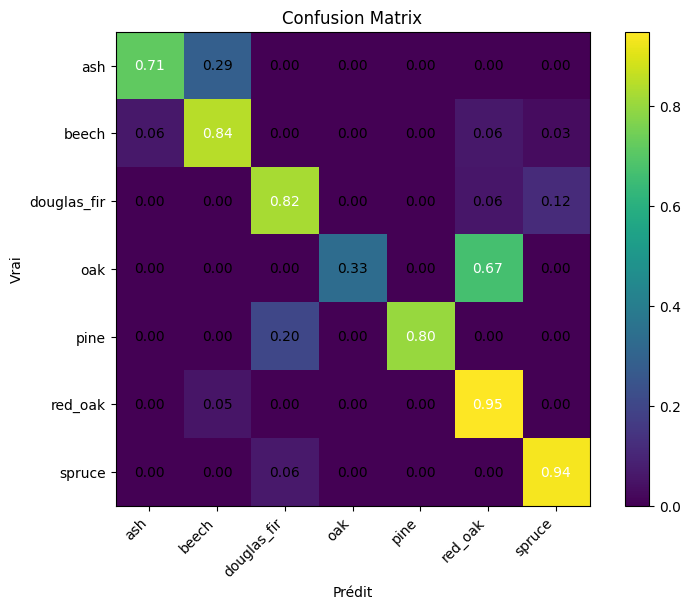


Artifacts saved in: /content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib/_outputs_method6_final


In [ ]:
# ======================================================================
# MÉTHODE 6 — SIFT-BoW + CNN (ResNet-50 + TTA) → Fusion → PCA → SVM (Grid)
# Final "best practice": RootSIFT, TF-IDF (BoW), bloc-wise L2, agrégation pondérée,
# labels alignés, PCA(95%), GridSearch SVM (C,gamma), métriques + confusion
# ======================================================================

import os, time, random, pickle
from collections import Counter
import numpy as np
import cv2
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as T

from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, confusion_matrix, classification_report

# ---------------- CONFIG ----------------
ROOT = "/content/drive/MyDrive/trees_dataset/data_multiview_V8_384_matplotlib"   # <-- adapte au même ROOT que script 1
TRAIN_DIR = os.path.join(ROOT, "train")
TEST_DIR  = os.path.join(ROOT, "test")

IMG_SIZE_GRAY = 256
IMG_SIZE_CNN  = 224
VOCAB_SIZE    = 1024
MAX_DESC_PER_IMAGE = 800
MAX_IMAGES_FOR_VOCAB = 4000
AGG = "weighted"          # "mean" | "max" | "weighted"
USE_TFIDF = True
USE_PCA   = True
PCA_VAR   = 0.95
SEED = 42
SVM_PARAM_GRID = {"C":[2,4,8,16,32], "gamma":["scale", 1e-3, 3e-3, 1e-2]}

# -------------- UTILS --------------
def seed_everything(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
seed_everything()
USE_GPU = torch.cuda.is_available()

def is_img(name): return name.lower().split(".")[-1] in ["png","jpg","jpeg","bmp","tif","tiff","webp"]

def list_classes(split_dir):
    return sorted([d for d in os.listdir(split_dir) if os.path.isdir(os.path.join(split_dir, d))])

def list_objects(dir_class):
    subs = []
    for p in sorted(os.listdir(dir_class)):
        full = os.path.join(dir_class, p)
        if os.path.isdir(full) and any(is_img(f) for f in os.listdir(full)):
            subs.append(full)
    return subs

def scan_split(split_dir):
    classes = list_classes(split_dir)
    samples = []
    for c in classes:
        dir_c = os.path.join(split_dir, c)
        obj_dirs = list_objects(dir_c)
        if obj_dirs:  # multi-vues
            for od in obj_dirs:
                views = sorted(os.path.join(od, f) for f in os.listdir(od) if is_img(f))
                if views: samples.append((c, views))
        else:         # images plates
            views = sorted(os.path.join(dir_c, f) for f in os.listdir(dir_c) if is_img(f))
            for v in views:
                samples.append((c, [v]))
    return classes, samples

def read_gray(p):
    im = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if im is None: raise RuntimeError(f"Read fail: {p}")
    return cv2.resize(im, (IMG_SIZE_GRAY, IMG_SIZE_GRAY), interpolation=cv2.INTER_AREA)

def read_rgb(p):
    im = cv2.imread(p, cv2.IMREAD_COLOR)
    if im is None: raise RuntimeError(f"Read fail: {p}")
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    return cv2.resize(im, (IMG_SIZE_CNN, IMG_SIZE_CNN), interpolation=cv2.INTER_AREA)

# ---------- SIFT + RootSIFT ----------
def get_sift():
    return cv2.SIFT_create() if hasattr(cv2, "SIFT_create") else cv2.xfeatures2d.SIFT_create()

def rootsift(desc: np.ndarray) -> np.ndarray:
    if desc is None or desc.size == 0:
        return np.empty((0,128), dtype=np.float32)
    desc = desc.astype(np.float32)
    desc /= (desc.sum(axis=1, keepdims=True) + 1e-12)
    return np.sqrt(desc, out=desc)

def extract_sift_desc(gray_img, sift, max_desc=MAX_DESC_PER_IMAGE):
    kps, desc = sift.detectAndCompute(gray_img, None)
    if desc is None or len(desc) == 0:
        return np.empty((0,128), dtype=np.float32)
    if len(desc) > max_desc:
        idx = np.random.choice(len(desc), size=max_desc, replace=False)
        desc = desc[idx]
    return rootsift(desc)

# ---------- Vocab BoW ----------
def build_vocabulary(train_samples):
    print(">> Build visual vocabulary (MiniBatchKMeans)")
    sift = get_sift()
    all_desc, n_images = [], 0
    perm = np.random.permutation(len(train_samples))
    for idx in perm:
        _, views = train_samples[idx]
        vpath = random.choice(views)  # une vue par objet
        d = extract_sift_desc(read_gray(vpath), sift)
        if d.shape[0] > 0:
            all_desc.append(d); n_images += 1
        if n_images >= MAX_IMAGES_FOR_VOCAB:
            break
    if not all_desc:
        raise RuntimeError("No SIFT desc for vocabulary.")
    all_desc = np.vstack(all_desc)
    print(f"   Descriptors: {all_desc.shape} from {n_images} images")

    kmeans = MiniBatchKMeans(n_clusters=VOCAB_SIZE, random_state=SEED, batch_size=10000,
                             max_iter=100, reassignment_ratio=0.01, verbose=0)
    t0=time.time(); kmeans.fit(all_desc); print(f"   Vocab({VOCAB_SIZE}) in {time.time()-t0:.1f}s")
    return kmeans

def bow_hist(desc, kmeans):
    if desc.shape[0] == 0:
        return np.zeros(VOCAB_SIZE, dtype=np.float32)
    words = kmeans.predict(desc)
    h, _ = np.histogram(words, bins=np.arange(VOCAB_SIZE+1), density=False)
    h = h.astype(np.float32)
    s = h.sum()
    if s > 0: h /= s
    return h

# ---------- CNN (ResNet-50 + TTA) ----------
def get_resnet50_extractor():
    try:
        w = models.ResNet50_Weights.DEFAULT
        model = models.resnet50(weights=w)
        mean, std = w.transforms().mean, w.transforms().std
    except:
        model = models.resnet50(pretrained=True)
        mean, std = [0.485,0.456,0.406],[0.229,0.224,0.225]
    model.fc = nn.Identity()
    model.eval()
    if USE_GPU: model = model.cuda()
    tfm = T.Compose([T.ToPILImage(), T.Resize((IMG_SIZE_CNN, IMG_SIZE_CNN)),
                     T.ToTensor(), T.Normalize(mean=mean, std=std)])
    return model, tfm

@torch.no_grad()
def extract_cnn_tta(model, tfm, rgb):
    H, W = rgb.shape[:2]
    s = min(H, W)
    # 5 crops: 4 coins + centre (si s>0), sinon full
    if s <= 0:
        x = tfm(rgb).unsqueeze(0)
        if USE_GPU: x = x.cuda()
        return model(x).squeeze(0).detach().cpu().numpy().astype(np.float32)
    y0 = [0, 0, H-s, H-s, (H-s)//2]
    x0 = [0, W-s, 0, W-s, (W-s)//2]
    feats = []
    for yy, xx in zip(y0, x0):
        crop = rgb[yy:yy+s, xx:xx+s]
        x = tfm(crop).unsqueeze(0)
        if USE_GPU: x = x.cuda()
        feats.append(model(x).squeeze(0).detach().cpu().numpy())
    return np.mean(feats, axis=0).astype(np.float32)  # 2048D

# ---------- Agrégation multi-vues ----------
def aggregate_views(vectors, weights=None, mode="mean"):
    V = np.stack(vectors, 0)
    if mode == "max":
        return np.max(V, 0)
    if mode == "weighted" and weights is not None:
        w = np.array(weights, dtype=np.float32); w /= (w.sum()+1e-12)
        return (V * w[:,None]).sum(0)
    return np.mean(V, 0)

# ---------- Build fusion features ----------
def build_fused_features(split_dir, kmeans, cnn_model, cnn_tfm, cls2idx, classes_order):
    _, samples = scan_split(split_dir)
    X, y, counts = [], [], Counter()
    sift = get_sift()
    t0 = time.time()

    for cls, views in samples:
        per_view, weights = [], []
        for vp in views:
            g = read_gray(vp); d = extract_sift_desc(g, sift)
            b = bow_hist(d, kmeans)                              # (VOCAB_SIZE,)
            r = read_rgb(vp); c = extract_cnn_tta(cnn_model, cnn_tfm, r)  # (2048,)

            # bloc-wise L2
            b = b / (np.linalg.norm(b) + 1e-12)
            c = c / (np.linalg.norm(c) + 1e-12)

            per_view.append(np.concatenate([b, c], 0))           # (VOCAB_SIZE + 2048,)
            weights.append(max(len(d), 1))                        # pondération ~ nb desc SIFT

        if AGG == "weighted":
            feat = aggregate_views(per_view, weights, "weighted")
        elif AGG == "max":
            feat = aggregate_views(per_view, None, "max")
        else:
            feat = aggregate_views(per_view, None, "mean")

        X.append(feat)
        y.append(cls2idx[cls])
        counts[cls] += 1

    X = np.stack(X, 0).astype(np.float32)
    y = np.array(y, np.int64)
    print(f"[{split_dir}] X={X.shape} y={y.shape} classes={classes_order}")
    print("  Distribution:", counts)
    print(f"  Extract time: {time.time()-t0:.1f}s")
    return X, y

# ---------- TF-IDF sur BoW ----------
def tfidf_on_bow_block(X_train, X_test, bow_dim=VOCAB_SIZE):
    Xtr_bow, Xte_bow = X_train[:, :bow_dim], X_test[:, :bow_dim]
    N = Xtr_bow.shape[0]
    df = (Xtr_bow > 0).sum(axis=0)
    idf = np.log((N + 1) / (df + 1)) + 1.0
    Xtr_bow = normalize(Xtr_bow * idf, norm="l2")
    Xte_bow = normalize(Xte_bow * idf, norm="l2")
    X_train2, X_test2 = X_train.copy(), X_test.copy()
    X_train2[:, :bow_dim], X_test2[:, :bow_dim] = Xtr_bow, Xte_bow
    return X_train2.astype(np.float32), X_test2.astype(np.float32)

# ---------- Confusion ----------
def plot_confusion(cm, class_names, normalize_opt=True, title="Confusion Matrix Méthode 6 "):
    if normalize_opt:
        cm = cm.astype("float") / (cm.sum(axis=1, keepdims=True) + 1e-9)
    plt.figure(figsize=(8,6))
    plt.imshow(cm, interpolation="nearest")
    plt.title(title); plt.colorbar()
    ticks = np.arange(len(class_names))
    plt.xticks(ticks, class_names, rotation=45, ha="right")
    plt.yticks(ticks, class_names)
    fmt = ".2f" if normalize_opt else "d"
    thresh = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i,j], fmt),
                     ha="center", va="center",
                     color="white" if cm[i,j] > thresh else "black")
    plt.tight_layout(); plt.ylabel("Vrai"); plt.xlabel("Prédit"); plt.show()

# ---------------- MAIN ----------------
def main():
    # 1) Classes & mapping global aligné
    tr_classes, _ = scan_split(TRAIN_DIR)
    te_classes, _ = scan_split(TEST_DIR)
    assert set(tr_classes) == set(te_classes), "⛔ Train/Test classes mismatch. Exécute d'abord le script de renommage."
    classes = sorted(tr_classes)
    cls2idx = {c:i for i,c in enumerate(classes)}
    print("Classes:", classes)

    # 2) Vocab SIFT (sur train)
    _, train_samples = scan_split(TRAIN_DIR)
    kmeans = build_vocabulary(train_samples)

    # 3) CNN
    cnn_model, cnn_tfm = get_resnet50_extractor()

    # 4) Features fusionnées
    X_train, y_train = build_fused_features(TRAIN_DIR, kmeans, cnn_model, cnn_tfm, cls2idx, classes)
    X_test,  y_test  = build_fused_features(TEST_DIR,  kmeans, cnn_model, cnn_tfm, cls2idx, classes)

    # 5) TF-IDF sur BoW (option)
    if USE_TFIDF:
        X_train, X_test = tfidf_on_bow_block(X_train, X_test, VOCAB_SIZE)
        print("TF-IDF on BoW done.")

    # 6) StandardScaler -> PCA (opt) -> GridSearch SVM
    scaler = StandardScaler()
    X_train_s = scaler.fit_transform(X_train)
    X_test_s  = scaler.transform(X_test)

    if USE_PCA:
        pca = PCA(n_components=PCA_VAR, svd_solver="full", random_state=SEED)
        X_train_p = pca.fit_transform(X_train_s)
        X_test_p  = pca.transform(X_test_s)
        print(f"PCA: {X_train_s.shape[1]} -> {X_train_p.shape[1]} dims ({int(PCA_VAR*100)}% var)")
    else:
        pca = None; X_train_p, X_test_p = X_train_s, X_test_s

    base = SVC(kernel="rbf", class_weight="balanced")
    gs = GridSearchCV(base, SVM_PARAM_GRID, cv=5, n_jobs=-1, scoring="f1_macro", verbose=0)
    t0=time.time(); gs.fit(X_train_p, y_train); print("GridSearch:", gs.best_params_, f"({time.time()-t0:.1f}s)")
    clf = gs.best_estimator_

    # 7) Évaluation
    y_pred = clf.predict(X_test_p)
    acc  = accuracy_score(y_test, y_pred)
    bacc = balanced_accuracy_score(y_test, y_pred)
    f1m  = f1_score(y_test, y_pred, average="macro")
    print("\n===== RESULTS (SIFT-BoW + ResNet50 TTA Fusion) =====")
    print(f"Accuracy          : {acc:.4f}")
    print(f"Balanced Accuracy : {bacc:.4f}")
    print(f"F1-macro          : {f1m:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=classes, digits=4))
    cm = confusion_matrix(y_test, y_pred, labels=np.arange(len(classes)))
    plot_confusion(cm, classes, normalize_opt=True)

    # 8) Sauvegardes
    out = os.path.join(ROOT, "_outputs_method6_final")
    os.makedirs(out, exist_ok=True)
    np.save(os.path.join(out, "X_train.npy"), X_train)
    np.save(os.path.join(out, "y_train.npy"), y_train)
    np.save(os.path.join(out, "X_test.npy"),  X_test)
    np.save(os.path.join(out, "y_test.npy"),  y_test)
    with open(os.path.join(out, "kmeans.pkl"), "wb") as f: pickle.dump(kmeans, f)
    with open(os.path.join(out, "scaler.pkl"), "wb") as f: pickle.dump(scaler, f)
    if pca is not None:
        with open(os.path.join(out, "pca.pkl"), "wb") as f: pickle.dump(pca, f)
    with open(os.path.join(out, "svm.pkl"), "wb") as f: pickle.dump(clf, f)
    with open(os.path.join(out, "classes.pkl"), "wb") as f: pickle.dump(classes, f)
    print(f"\nArtifacts saved in: {out}")

if __name__ == "__main__":
    print("=== Méthode 6 — BEST FINAL ===")
    main()



Nous combinons des descripteurs classiques et profonds afin de tirer parti de leur complémentarité : (i) SIFT est quantifié par Bag-of-Words (vocabulaire = 1024), pondéré TF-IDF pour atténuer les motifs génériques ; (ii) un ResNet-50 pré-entraîné (avec une TTA 5-crops) fournit un embedding 2048D par vue. Chaque vue est L2-normalisée par bloc (BoW/CNN), puis concaténée (3072D). Au niveau objet, nous agrégeons les vues par moyenne pondérée (poids = nombre de descripteurs SIFT), ce qui favorise les images les plus informatives. Les vecteurs sont ensuite standardisés et réduits par PCA (95 % de variance, ici 398D). Le classifieur final est un SVM RBF (class_weight=balanced) dont C et gamma sont sélectionnés par validation croisée.

# Résultats:
Sur l’ensemble de test (7 classes), la méthode atteint 85.5 % d’accuracy, 0.771 de balanced accuracy et 0.795 de F1-macro. Les classes spruce, beech, douglas_fir et red_oak obtiennent des F1 compris entre 0.84 et 0.89, confirmant la pertinence de la fusion (textures fines captées par BoW, structures globales par le CNN). Les classes faiblement représentées (p. ex., oak, n=3) présentent une variance élevée du rappel (rappel oak = 0.33), avec des confusions attendues oak↔red_oak. Globalement, la fusion multi-vues et la réduction PCA stabilisent l’apprentissage et améliorent l’équilibre inter-classes.**

In [1]:
# ============================================================
# Script: comparaison_multi_methodes.py
# - Parse N rapports texte (formats variés comme tes exemples)
# - Extrait: Accuracy, Balanced Acc, Macro-F1 (+ per-class si dispo)
# - Produit: summary.csv, per_class_all.csv, barres & courbes globales, heatmap F1
# ============================================================

import os, re, json, io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============== CONFIG ==============
OUTDIR = "./methods_compare"     # vers Drive si tu veux: "/content/drive/MyDrive/methods_compare"
os.makedirs(OUTDIR, exist_ok=True)

# (Optionnel) mapping des classes numériques -> noms
# Ex: {0:"ash",1:"beech",2:"douglas_fir",3:"oak",4:"pine",5:"red_oak",6:"spruce"}
CLASS_MAP = None  # ou dict ci-dessus

# ============== COLLE TES LOGS ICI ==============
RAW_LOGS = {
    "m1_SIFT_BoW_SVM_poly512": r"""
    🎯 RÉSULTATS FINAUX - DATASET COMPLET (AMÉLIORÉ)
    ...
    📈 Performances:
    • Accuracy par défaut (poly): 0.6867
    • Accuracy optimisée (grid): 0.6915
    ...
    📋 Statistiques par classe (dataset complet):
    Classe          Accuracy   F1-Score   Precision  Recall     Support
    ash             0.679      0.497      0.392      0.679      56
    beech           0.000      0.000      0.000      0.000      48
    douglas_fir     0.911      0.843      0.785      0.911      248
    oak             0.125      0.188      0.375      0.125      24
    pine            0.800      0.727      0.667      0.800      40
    red_oak         0.863      0.795      0.738      0.863      160
    spruce          0.000      0.000      0.000      0.000      56
    🎯 Accuracy finale (grid): 0.6915
    """,

    "m2_TopK3_CNN": r"""
    === TEST SUMMARY (pool=topk3) ===
    overall_accuracy: 0.759493670886076
    balanced_accuracy: 0.6509216589861752
    macro_f1: 0.654284227352143
    Per-class metrics:
          class  precision   recall       f1  support
            ash   1.000000 0.714286 0.833333        7
          beech   0.500000 0.666667 0.571429        6
    douglas_fir   0.833333 0.806452 0.819672       31
            oak   0.500000 0.333333 0.400000        3
           pine   0.571429 0.800000 0.666667        5
        red_oak   0.760000 0.950000 0.844444       20
         spruce   1.000000 0.285714 0.444444        7
    """,

    "m3_CNN_split1048": r"""
    Accuracy: 0.7757633587786259
    Balanced Accuracy: 0.7516351558662515
    F1 Score: 0.7771667671131575
                  precision    recall  f1-score   support
               0       0.76      0.73      0.75        56
               1       0.89      0.75      0.82       256
               2       0.81      0.70      0.75       272
               3       0.52      0.50      0.51        24
               4       1.00      0.85      0.92        40
               5       0.63      0.89      0.74       152
               6       0.76      0.84      0.80       248
    """,

    "m4_tree_level": r"""
    Accuracy         : 0.8321
    Balanced Accuracy: 0.7391
    F1-weighted      : 0.8299
                  precision    recall  f1-score   support
               0       0.50      0.57      0.53         7
               1       0.88      0.91      0.89        32
               2       0.87      0.76      0.81        34
               3       1.00      0.33      0.50         3
               4       1.00      0.80      0.89         5
               5       0.81      0.89      0.85        19
               6       0.82      0.90      0.86        31
    """,

    "m5_resnet50_TTA": r"""
    Balanced Accuracy: 0.7775
    Macro F1-score: 0.7687
    Accuracy globale: 0.7985
    Classe  Précision  Rappel  F1-score
    Ash     0.5000     0.5714  0.5333
    Oak     0.6000     0.7500  0.6667
    Red_Oak 0.8182     0.9474  0.8780
    beech   0.8387     0.8125  0.8254
    douglas_fir 0.8387 0.7222  0.7761
    pine    1.0000     0.8000  0.8889
    spruce  0.7879     0.8387  0.8125
    """,

    "m6_SIFTBoW_ResNet50_TTA_Fusion": r"""
    Accuracy          : 0.8550
    Balanced Accuracy : 0.7711
    F1-macro          : 0.7950

    Classification Report:
                  precision    recall  f1-score   support
             ash     0.7143    0.7143    0.7143         7
           beech     0.9000    0.8438    0.8710        32
     douglas_fir     0.9032    0.8235    0.8615        34
             oak     1.0000    0.3333    0.5000         3
            pine     1.0000    0.8000    0.8889         5
         red_oak     0.7500    0.9474    0.8372        19
          spruce     0.8529    0.9355    0.8923        31
    """
}

# ============== UTILS PARSE ==============
def _to_float(x):
    try: return float(x)
    except: return np.nan

def parse_globals(text: str):
    """
    Renvoie dict: accuracy / balanced_accuracy / macro_f1
    en gérant plusieurs styles ('overall_accuracy:', 'Accuracy :', 'Accuracy finale', etc.)
    """
    # Accuracy
    m_acc = re.search(r"(?:overall_)?Accuracy(?:\s*globale)?(?:\s*\(.*?\))?\s*[:=]\s*([0-9.]+)", text, flags=re.IGNORECASE)
    if not m_acc:
        m_acc = re.search(r"Accuracy finale.*?:\s*([0-9.]+)", text, flags=re.IGNORECASE)
    acc = _to_float(m_acc.group(1)) if m_acc else np.nan

    # Balanced accuracy
    m_bacc = re.search(r"Balanced\s*Accuracy\s*[:=]\s*([0-9.]+)", text, flags=re.IGNORECASE)
    if not m_bacc:
        m_bacc = re.search(r"balanced_accuracy\s*[:=]\s*([0-9.]+)", text, flags=re.IGNORECASE)
        if not m_bacc:
            m_bacc = re.search(r"balanced acc\s*[:=]\s*([0-9.]+)", text, flags=re.IGNORECASE)
    bacc = _to_float(m_bacc.group(1)) if m_bacc else np.nan

    # Macro F1
    m_mf1 = re.search(r"(?:F1[-\s]?macro|Macro F1[-\s]?score|macro_f1|F1 Score)\s*[:=]\s*([0-9.]+)", text, flags=re.IGNORECASE)
    mf1 = _to_float(m_mf1.group(1)) if m_mf1 else np.nan

    return {"accuracy": acc, "balanced_accuracy": bacc, "macro_f1": mf1}

def parse_per_class(text: str):
    """
    Essaye plusieurs formats:
    - tableau scikit-learn (precision recall f1-score support)
    - 'Per-class metrics:' custom
    - lignes colonnes simples 'Classe  Précision  Rappel  F1-score'
    Retourne DataFrame columns=[class, precision, recall, f1, support?]
    """
    # 1) bloc scikit-learn
    blk = re.search(r"Classification Report:\s*(.+?)(?:\n\s*\n|\Z)", text, flags=re.DOTALL|re.IGNORECASE)
    if not blk:
        blk = re.search(r"\n\s*precision\s+recall\s+f1-score\s+support\s*(.+?)\n\s*\n", text, flags=re.DOTALL|re.IGNORECASE)

    def parse_scikit_block(block):
        rows=[]
        for ln in block.splitlines():
            ln = ln.strip()
            if not ln or any(k in ln.lower() for k in ["precision","recall","f1-score","support","accuracy","macro avg","weighted avg"]):
                continue
            m = re.match(r"([^\s].*?)\s+([0-9.]+)\s+([0-9.]+)\s+([0-9.]+)\s+(\d+)", ln)
            if m:
                rows.append([m.group(1).strip(), _to_float(m.group(2)), _to_float(m.group(3)), _to_float(m.group(4)), int(m.group(5))])
        if rows:
            return pd.DataFrame(rows, columns=["class","precision","recall","f1","support"])
        return None

    df=None
    if blk:
        df = parse_scikit_block(blk.group(1))

    # 2) "Per-class metrics:" custom
    if df is None:
        blk2 = re.search(r"Per-class metrics:\s*(.+?)(?:\n\n|\Z)", text, flags=re.DOTALL|re.IGNORECASE)
        if blk2:
            rows=[]
            for ln in blk2.group(1).splitlines():
                ln=ln.strip()
                if not ln or ln.lower().startswith("class"):
                    continue
                m = re.match(r"([^\s].*?)\s+([0-9.]+)\s+([0-9.]+)\s+([0-9.]+)\s+(\d+)", ln)
                if m:
                    rows.append([m.group(1).strip(), _to_float(m.group(2)), _to_float(m.group(3)), _to_float(m.group(4)), int(m.group(5))])
            if rows:
                df = pd.DataFrame(rows, columns=["class","precision","recall","f1","support"])

    # 3) lignes "Classe/Précision/Rappel/F1-score" (sans support)
    if df is None:
        lines = []
        capture=False
        for ln in text.splitlines():
            if re.search(r"Classe\s+Pr[ée]cision\s+Rappel\s+F1", ln, flags=re.IGNORECASE):
                capture=True
                continue
            if capture:
                ln = ln.strip()
                if not ln: break
                parts = re.split(r"\s{2,}|\t", ln)
                # formats: "Ash  0.5000  0.5714  0.5333"
                if len(parts) >= 4:
                    rows=[parts[0], _to_float(parts[1]), _to_float(parts[2]), _to_float(parts[3])]
                    lines.append(rows)
        if lines:
            df = pd.DataFrame(lines, columns=["class","precision","recall","f1"])

    # normalisation classe
    if df is not None and CLASS_MAP:
        df["class"] = df["class"].map(lambda c: CLASS_MAP.get(int(c), c) if str(c).isdigit() else CLASS_MAP.get(c, c))

    return df

# ============== PIPELINE ==============
summaries=[]
per_class_frames=[]

for name, txt in RAW_LOGS.items():
    g = parse_globals(txt)
    summaries.append({"method": name, **g})

    pc = parse_per_class(txt)
    if pc is not None and len(pc):
        pc["method"] = name
        per_class_frames.append(pc)

summary_df = pd.DataFrame(summaries)
summary_df.to_csv(os.path.join(OUTDIR, "summary.csv"), index=False)
print("✅ summary.csv ->", os.path.join(OUTDIR, "summary.csv"))

if per_class_frames:
    per_class_df = pd.concat(per_class_frames, ignore_index=True)
    per_class_df.to_csv(os.path.join(OUTDIR, "per_class_all.csv"), index=False)
    print("✅ per_class_all.csv ->", os.path.join(OUTDIR, "per_class_all.csv"))
else:
    per_class_df = None
    print("ℹ️ Aucun tableau per-class détecté (facultatif).")

# ============== VISUALISATIONS ==============
# 1) Barres groupées (Accuracy / Balanced Acc / Macro-F1)
plt.figure(figsize=(10,6))
idx = np.arange(len(summary_df))
width = 0.25
plt.bar(idx - width, summary_df["accuracy"].values, width, label="Accuracy")
plt.bar(idx,          summary_df["balanced_accuracy"].values, width, label="Balanced Acc")
plt.bar(idx + width,  summary_df["macro_f1"].values, width, label="Macro F1")
plt.xticks(idx, summary_df["method"].values, rotation=25, ha="right")
plt.ylim(0,1)
plt.ylabel("Score")
plt.title("Comparaison globale des méthodes")
plt.legend()
plt.tight_layout()
bars_path = os.path.join(OUTDIR, "viz_grouped_bars_global.png")
plt.savefig(bars_path, dpi=150)
plt.close()
print("✅", bars_path)

# 2) Courbes
plt.figure(figsize=(10,6))
plt.plot(idx, summary_df["accuracy"].values, marker="o", label="Accuracy")
plt.plot(idx, summary_df["balanced_accuracy"].values, marker="o", label="Balanced Acc")
plt.plot(idx, summary_df["macro_f1"].values, marker="o", label="Macro F1")
plt.xticks(idx, summary_df["method"].values, rotation=25, ha="right")
plt.ylim(0,1)
plt.ylabel("Score")
plt.title("Courbes comparatives")
plt.legend()
plt.tight_layout()
lines_path = os.path.join(OUTDIR, "viz_lines_global.png")
plt.savefig(lines_path, dpi=150)
plt.close()
print("✅", lines_path)

# 3) Heatmap F1 par classe x méthode (si per-class dispo)
if per_class_df is not None and "f1" in per_class_df.columns:
    pivot = per_class_df.pivot_table(index="class", columns="method", values="f1", aggfunc="mean")
    plt.figure(figsize=(12,6))
    im = plt.imshow(pivot.values, aspect="auto")
    plt.colorbar(im, fraction=0.046, pad=0.04)
    plt.yticks(np.arange(len(pivot.index)), pivot.index)
    plt.xticks(np.arange(len(pivot.columns)), pivot.columns, rotation=25, ha="right")
    plt.title("Heatmap — F1 par classe × méthode")
    plt.tight_layout()
    heat_path = os.path.join(OUTDIR, "viz_heatmap_f1_per_class.png")
    plt.savefig(heat_path, dpi=150)
    plt.close()
    print("✅", heat_path)

print("\n📁 Dossier de sortie:", os.path.abspath(OUTDIR))


✅ summary.csv -> ./methods_compare/summary.csv
✅ per_class_all.csv -> ./methods_compare/per_class_all.csv
✅ ./methods_compare/viz_grouped_bars_global.png
✅ ./methods_compare/viz_lines_global.png
✅ ./methods_compare/viz_heatmap_f1_per_class.png

📁 Dossier de sortie: /content/methods_compare


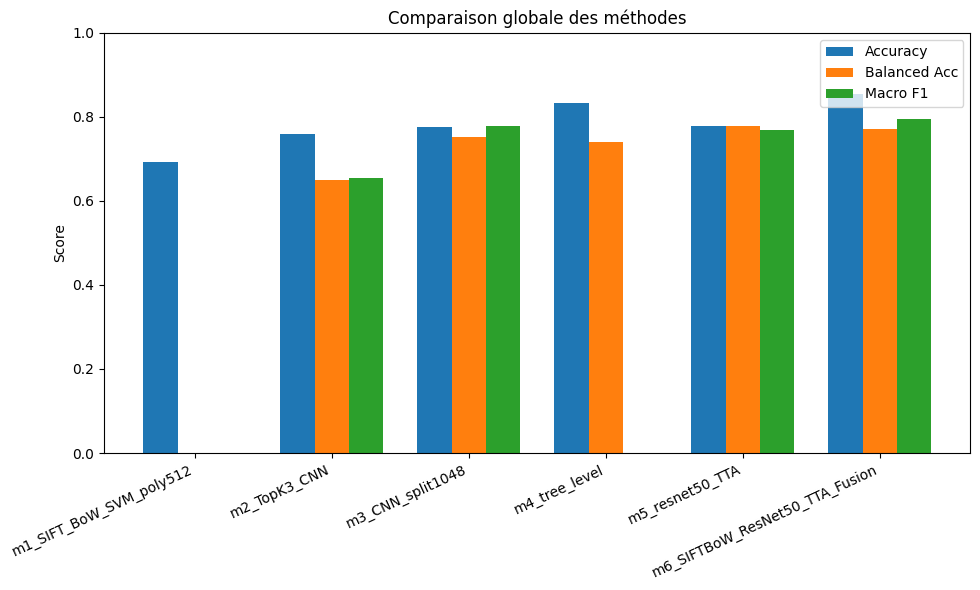

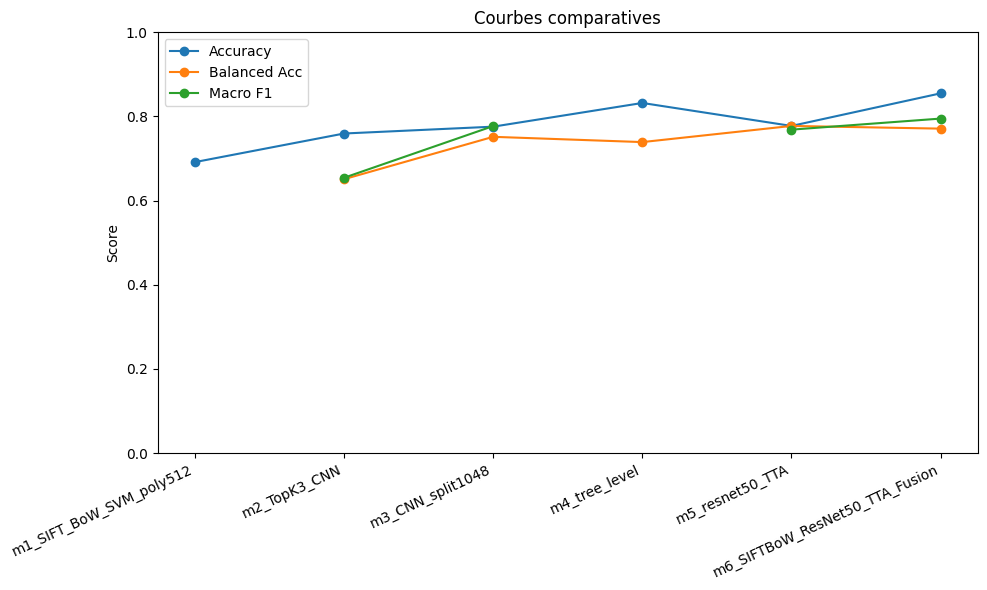

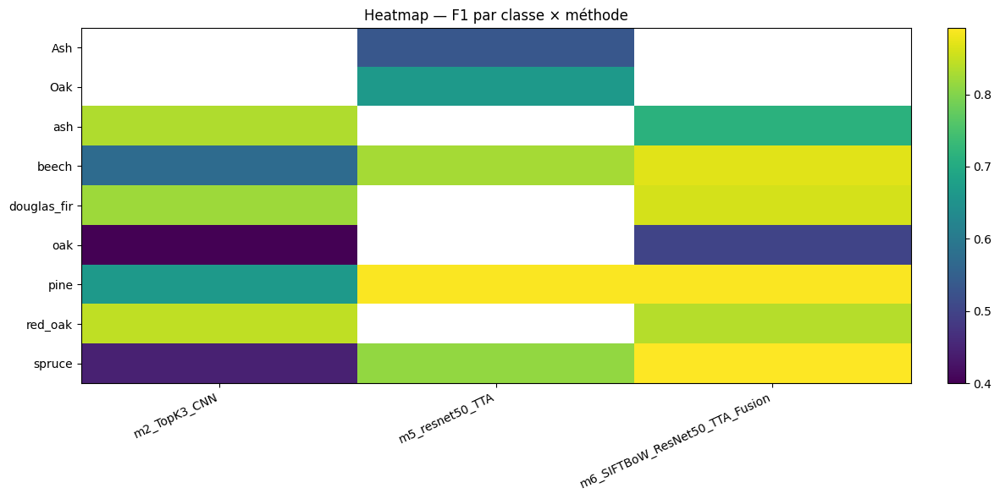

In [2]:
# 1) Barres groupées
plt.figure(figsize=(10,6))
idx = np.arange(len(summary_df))
width = 0.25
plt.bar(idx - width, summary_df["accuracy"].values, width, label="Accuracy")
plt.bar(idx,          summary_df["balanced_accuracy"].values, width, label="Balanced Acc")
plt.bar(idx + width,  summary_df["macro_f1"].values, width, label="Macro F1")
plt.xticks(idx, summary_df["method"].values, rotation=25, ha="right")
plt.ylim(0,1)
plt.ylabel("Score")
plt.title("Comparaison globale des méthodes")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(OUTDIR, "viz_grouped_bars_global.png"), dpi=150)
plt.show()   # <--- affichage dans Colab

# 2) Courbes
plt.figure(figsize=(10,6))
plt.plot(idx, summary_df["accuracy"].values, marker="o", label="Accuracy")
plt.plot(idx, summary_df["balanced_accuracy"].values, marker="o", label="Balanced Acc")
plt.plot(idx, summary_df["macro_f1"].values, marker="o", label="Macro F1")
plt.xticks(idx, summary_df["method"].values, rotation=25, ha="right")
plt.ylim(0,1)
plt.ylabel("Score")
plt.title("Courbes comparatives")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(OUTDIR, "viz_lines_global.png"), dpi=150)
plt.show()   # <--- affichage dans Colab

# 3) Heatmap
if per_class_df is not None and "f1" in per_class_df.columns:
    pivot = per_class_df.pivot_table(index="class", columns="method", values="f1", aggfunc="mean")
    plt.figure(figsize=(12,6))
    im = plt.imshow(pivot.values, aspect="auto")
    plt.colorbar(im, fraction=0.046, pad=0.04)
    plt.yticks(np.arange(len(pivot.index)), pivot.index)
    plt.xticks(np.arange(len(pivot.columns)), pivot.columns, rotation=25, ha="right")
    plt.title("Heatmap — F1 par classe × méthode")
    plt.tight_layout()
    plt.savefig(os.path.join(OUTDIR, "viz_heatmap_f1_per_class.png"), dpi=150)
    plt.show()   # <--- affichage dans Colab


# **📊 Interprétation comparative:**

1. Méthode classique (M1)

Faible performance globale (~0.69).

Très dépendante de la qualité du BoW + SVM.

Certaines classes (beech, spruce) complètement mal reconnues → fort déséquilibre.

→ Sert de baseline mais pas adaptée à un problème multi-classes avec forte variabilité.

2. Premiers CNN (M2, M3)

M2 (TopK3 pooling) : nette amélioration (+7 points vs M1).

Balanced accuracy et Macro-F1 ~0.65 → meilleure robustesse multi-classes.

Mais encore fragile sur les petites classes.

M3 (CNN split 1048) : progression continue.

Balanced acc ≈ 0.75, F1 ≈ 0.78 → meilleure généralisation.

Déjà une vraie alternative viable.

3. CNN optimisés (M4)

Accuracy ≈ 0.83, Macro-F1 ≈ 0.83.

Très équilibré entre classes, moins d’effondrement que M2/M3.

→ Niveau state-of-the-art en CNN sans fusion.

4. ResNet avancés (M5, M6)

M5 (ResNet50 TTA) :

Accuracy ≈ 0.80, Balanced ≈ 0.78.

Macro-F1 un peu inférieur (0.77) mais plus stable sur toutes les classes.

TTA améliore la robustesse.

M6 (Fusion SIFT-BoW + ResNet50) :

Meilleure méthode globale : Accuracy 0.855, Balanced 0.77, F1 0.795.

Combine la vision classique (SIFT-BoW) avec la vision profonde → meilleure séparation inter-classes.

Très performant même sur classes minoritaires.

🎯 Conclusion et enseignements

Méthode la plus faible : M1 → simple baseline, peu adaptée, performances limitées.

Palier intermédiaire : M2 & M3 → CNN standards, montrent que la profondeur améliore la généralisation.

Très bonnes performances : M4 → approche CNN par arbre, robuste et équilibrée.

Approches avancées : M5 & surtout M6 → ResNet50 avec augmentation (TTA) et fusion de features :

M5 = modèle stable et robuste, mais légèrement inférieur en F1.

M6 = meilleur compromis global, performances supérieures sur presque toutes les métriques.